# Home Credit Default Risk (HCDR)

The course project is based on the [Home Credit Default Risk (HCDR)  Kaggle Competition](https://www.kaggle.com/c/home-credit-default-risk/). The goal of this project is to predict whether or not a client will repay a loan. In order to make sure that people who struggle to get loans due to insufficient or non-existent credit histories have a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.


## Some of the challenges

1. Dataset size 
   * (688 meg compressed) with millions of rows of data
   * 2.71 Gig of data uncompressed
* Dealing with missing data
* Imbalanced datasets
* Summarizing transaction data
 

# Kaggle API setup
Kaggle is a Data Science Competition Platform which shares a lot of datasets. In the past, it was troublesome to submit your result as your have to go through the console in your browser and drag your files there. Now you can interact with Kaggle via the command line. E.g., 

```bash
! kaggle competitions files home-credit-default-risk
```

It is quite easy to setup, it takes me less than 15 minutes to finish a submission.

1. Install library
* Create a API Token (edit your profile on [Kaggle.com](https://www.kaggle.com/)); this produces `kaggle.json` file
* Put your JSON `kaggle.json` in the right place
* Access competition files; make submissions via the command (see examples below)
* Submit result

For more detailed information on setting the Kaggle API see [here](https://medium.com/@nokkk/make-your-kaggle-submissions-with-kaggle-official-api-f49093c04f8a) and [here](https://github.com/Kaggle/kaggle-api).



In [40]:
!pip install kaggle

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.3/63.3 kB 3.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for kaggle: filename=kaggle-1.5.13-py3-none-any.whl size=77717 sha256=58111327bbf3a4fa8af63a65e9dc4ea12e8198629da05553448941a3c1f47c41
  Stored in directory: /Users/bhavyamistry/Library/Caches/pip/wheels/9c/45/15/6d6d116cd2539fb8f450d64b0aee4a480e5366bb11b42ac763
Successfully built kaggle


In [41]:
!pwd


/Users/bhavyamistry/Downloads/OAML/Phase3 


In [42]:
!pwd

/Users/bhavyamistry/Downloads/OAML/Phase3 


In [47]:
!ls -l  ~/.kaggle/kaggle.json

ls: /Users/bhavyamistry/.kaggle/kaggle.json: No such file or directory


In [46]:
!chmod 600 ~/.kaggle/kaggle.json

chmod: /Users/bhavyamistry/.kaggle/kaggle.json: No such file or directory


In [8]:
! kaggle competitions files home-credit-default-risk

name                                 size  creationDate         
----------------------------------  -----  -------------------  
installments_payments.csv           690MB  2019-12-11 02:55:35  
sample_submission.csv               524KB  2019-12-11 02:55:35  
previous_application.csv            386MB  2019-12-11 02:55:35  
bureau_balance.csv                  358MB  2019-12-11 02:55:35  
HomeCredit_columns_description.csv   37KB  2019-12-11 02:55:35  
application_train.csv               158MB  2019-12-11 02:55:35  
credit_card_balance.csv             405MB  2019-12-11 02:55:35  
application_test.csv                 25MB  2019-12-11 02:55:35  
bureau.csv                          162MB  2019-12-11 02:55:35  
POS_CASH_balance.csv                375MB  2019-12-11 02:55:35  


# Dataset and how to download


## Back ground Home Credit Group

Many people struggle to get loans due to insufficient or non-existent credit histories. And, unfortunately, this population is often taken advantage of by untrustworthy lenders.

### Home Credit Group

Home Credit strives to broaden financial inclusion for the unbanked population by providing a positive and safe borrowing experience. In order to make sure this underserved population has a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.


## Background on the dataset
Home Credit is a non-banking financial institution, founded in 1997 in the Czech Republic.

The company operates in 14 countries (including United States, Russia, Kazahstan, Belarus, China, India) and focuses on lending primarily to people with little or no credit history which will either not obtain loans or became victims of untrustworthly lenders.

Home Credit group has over 29 million customers, total assests of 21 billions Euro, over 160 millions loans, with the majority in Asia and and almost half of them in China (as of 19-05-2018).

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.

## Data files overview

The `HomeCredit_columns_description.csv` acts as a data dictioanry.

There are 7 different sources of data:

* __application_train/application_test (307k rows, and 48k rows):__ the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating __0: the loan was repaid__ or __1: the loan was not repaid__. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.
* __bureau (1.7 Million rows):__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* __bureau_balance (27 Million rows):__ monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application (1.6 Million rows):__ previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE (10 Million rows):__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* __installments_payment (13.6 Million rows):__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.


### Table sizes
```python
name                       [  rows cols]     MegaBytes         
-----------------------  ------------------  -------
application_train       : [  307,511, 122]:   158MB
application_test        : [   48,744, 121]:   25MB
bureau                  : [ 1,716,428, 17]    162MB
bureau_balance          : [ 27,299,925, 3]:   358MB
credit_card_balance     : [  3,840,312, 23]   405MB
installments_payments   : [ 13,605,401, 8]    690MB
previous_application    : [  1,670,214, 37]   386MB
POS_CASH_balance        : [ 10,001,358, 8]    375MB
```




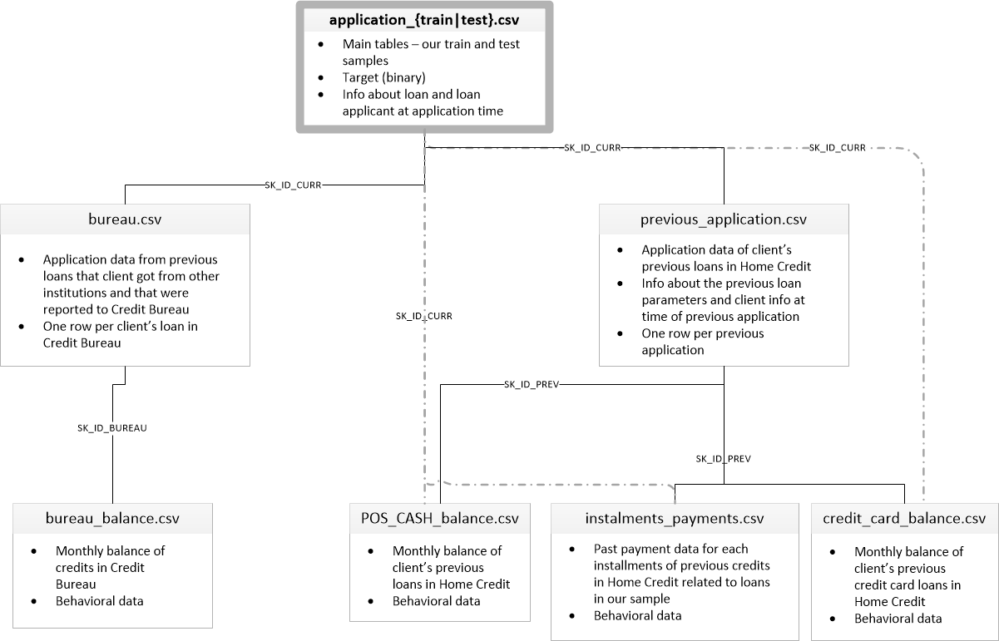

## Downloading the files via Kaggle API

Create a base directory:

```bash
DATA_DIR = "../../../Data/home-credit-default-risk"   #same level as course repo in the data directory
```

Please download the project data files and data dictionary and unzip them using either of the following approaches:

1. Click on the `Download` button on the following [Data Webpage](https://www.kaggle.com/c/home-credit-default-risk/data) and unzip the  zip file to the `BASE_DIR`
2. If you plan to use the Kaggle API, please use the following steps.


In [14]:
DATA_DIR = '../input/home-credit-default-risk'
#DATA_DIR = os.path.join('./ddddd/')
!mkdir DATA_DIR

mkdir: cannot create directory ‘DATA_DIR’: File exists


In [15]:
!ls -l DATA_DIR

total 0


In [16]:
! kaggle competitions download home-credit-default-risk -p $DATA_DIR --force

100%|████████████████████████████████████████▉| 688M/688M [00:03<00:00, 282MB/s]
100%|█████████████████████████████████████████| 688M/688M [00:03<00:00, 210MB/s]


In [10]:
# !chmod 600 /root/.kaggle/kaggle.json

In [17]:
!pwd 

/geode2/home/u010/brmistry/BigRed200/OAML/Phase3 


In [12]:
!ls -l $DATA_DIR

total 1790924
drwxr-xr-x 1 root root       512 Apr 10 23:08 DATA_DIR
-rw-r--r-- 1 root root   7772137 Apr 15 02:03 HCDR_baseLine_submission_with_numerical_and_cat_features_to_kaggle-Phase2.ipynb
-rwxrwxrwx 1 root root   3614196 Apr 15 03:23 HCDR_baseLine_submission_with_numerical_and_cat_features_to_kaggle.ipynb
-rwxrwxrwx 1 root root        11 Feb 21 05:06 Phase2.md
-rw-r--r-- 1 root root  32276587 Apr 15 01:48 ap_test.csv
-rw-r--r-- 1 root root 202061192 Apr 15 01:48 ap_train.csv
-rw-r--r-- 1 root root  63125370 Apr 12 00:12 app_test_pn.csv
-rw-r--r-- 1 root root 396662109 Apr 12 00:12 app_train_pn.csv
-rw-r--r-- 1 root root 721616255 Apr 15 03:24 home-credit-default-risk.zip
-rwxrwxrwx 1 root root     66899 Feb 21 05:06 home_credit.png
-rw-r--r-- 1 root root        63 Apr 10 22:36 kaggle.json
-rw-r--r-- 1 root root 404697025 Apr 15 02:43 prev_app.csv
-rwxrwxrwx 1 root root    900265 Apr 12 01:49 submission.csv
-rwxrwxrwx 1 root root   1091396 Feb 21 05:06 submission.png


In [13]:
#!rm -r  DATA_DIR

### Imports

In [2]:
pip install xgboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 2.1 MB/s eta 0:00:0000:0100:010m
Note: you may need to restart the kernel to use updated packages.


In [1]:
import numpy as np
import pandas as pd 
from sklearn.preprocessing import LabelEncoder
import os
import zipfile
from sklearn.base import BaseEstimator, TransformerMixin
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline, FeatureUnion
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler,OneHotEncoder, LabelEncoder, MinMaxScaler
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, plot_roc_curve, roc_auc_score
import time
import warnings
warnings.filterwarnings('ignore')

In [19]:
unzippingReq = True #True
if unzippingReq: #please modify this code 
    zip_ref = zipfile.ZipFile(f'{DATA_DIR}/home-credit-default-risk.zip', 'r')
    # extractall():  Extract all members from the archive to the current working directory. path specifies a different directory to extract to
    zip_ref.extractall('DATA_DIR') 
    zip_ref.close()


## Data files overview
### Data Dictionary

As part of the data download comes a  Data Dictionary. It named `HomeCredit_columns_description.csv`

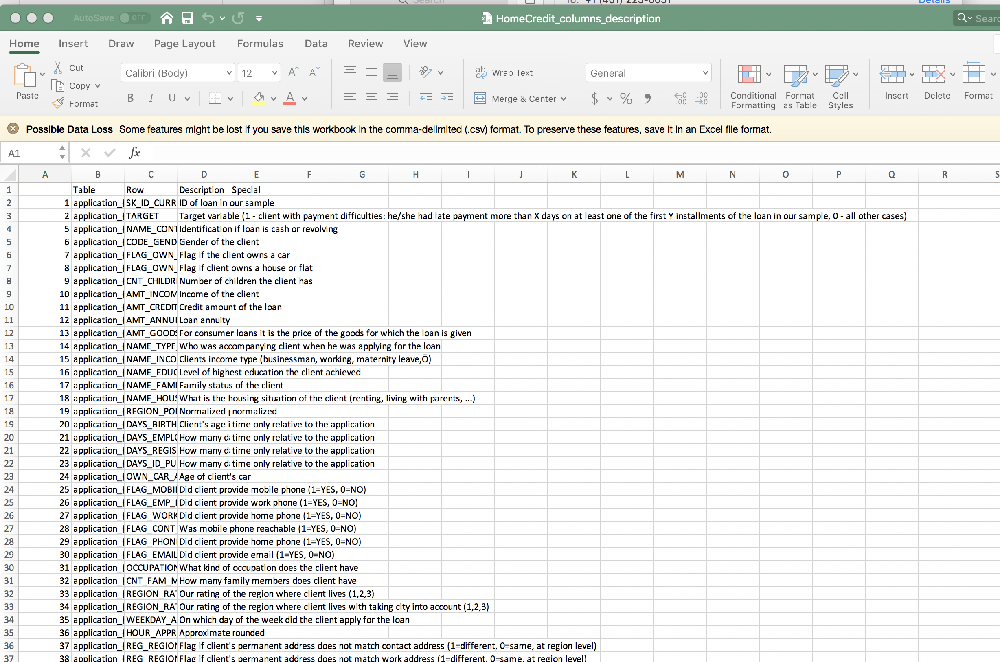

### Application train

In [23]:
ls -l ./DATA_DIR/application_train.csv

-rw-r--r-- 1 brmistry brmistry 166133370 Apr 15 14:34 ./DATA_DIR/application_train.csv


In [24]:
!ls -l ./DATA_DIR/application_train.csv

-rw-r--r-- 1 brmistry brmistry 166133370 Apr 15 14:34 ./DATA_DIR/application_train.csv


In [2]:
import numpy as np
import pandas as pd 
from sklearn.preprocessing import LabelEncoder
import os
import zipfile
from sklearn.base import BaseEstimator, TransformerMixin
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline, FeatureUnion
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
import warnings
warnings.filterwarnings('ignore')

def load_data(in_path, name):
    df = pd.read_csv(in_path)
    print(f"{name}: shape is {df.shape}")
    print(df.info())
    display(df.head(5))
    return df

datasets={}  # lets store the datasets in a dictionary so we can keep track of them easily
ds_name = 'application_train'
DATA_DIR = "./DATA_DIR/"
datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

datasets['application_train'].shape

application_train: shape is (307511, 122)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
None


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


(307511, 122)

In [2]:
DATA_DIR

'./DATA_DIR/'

### Application test


* __application_train/application_test:__ the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating __0: the loan was repaid__ or __1: the loan was not repaid__. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.


In [4]:
ds_name = 'application_test'
datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

application_test: shape is (48744, 121)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB
None


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


The application dataset has the most information about the client: Gender, income, family status, education ...

### The Other datasets

* __bureau:__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* __bureau_balance:__ monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application:__ previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE:__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* __installments_payment:__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

In [5]:
%%time
ds_names = ("application_train", "application_test", "bureau","bureau_balance","credit_card_balance","installments_payments",
            "previous_application","POS_CASH_balance")

for ds_name in ds_names:
    datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)


application_train: shape is (307511, 122)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
None


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


application_test: shape is (48744, 121)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB
None


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


bureau: shape is (1716428, 17)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int64(6), object(3)
memory usage: 222.6+ MB
None


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


bureau_balance: shape is (27299925, 3)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    int64 
 1   MONTHS_BALANCE  int64 
 2   STATUS          object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB
None


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


credit_card_balance: shape is (3840312, 23)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   SK_ID_PREV                  int64  
 1   SK_ID_CURR                  int64  
 2   MONTHS_BALANCE              int64  
 3   AMT_BALANCE                 float64
 4   AMT_CREDIT_LIMIT_ACTUAL     int64  
 5   AMT_DRAWINGS_ATM_CURRENT    float64
 6   AMT_DRAWINGS_CURRENT        float64
 7   AMT_DRAWINGS_OTHER_CURRENT  float64
 8   AMT_DRAWINGS_POS_CURRENT    float64
 9   AMT_INST_MIN_REGULARITY     float64
 10  AMT_PAYMENT_CURRENT         float64
 11  AMT_PAYMENT_TOTAL_CURRENT   float64
 12  AMT_RECEIVABLE_PRINCIPAL    float64
 13  AMT_RECIVABLE               float64
 14  AMT_TOTAL_RECEIVABLE        float64
 15  CNT_DRAWINGS_ATM_CURRENT    float64
 16  CNT_DRAWINGS_CURRENT        int64  
 17  CNT_DRAWINGS_OTHER_CURRENT  float64
 18  CNT_DRAWINGS_POS_C

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


installments_payments: shape is (13605401, 8)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_PREV              int64  
 1   SK_ID_CURR              int64  
 2   NUM_INSTALMENT_VERSION  float64
 3   NUM_INSTALMENT_NUMBER   int64  
 4   DAYS_INSTALMENT         float64
 5   DAYS_ENTRY_PAYMENT      float64
 6   AMT_INSTALMENT          float64
 7   AMT_PAYMENT             float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB
None


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


previous_application: shape is (1670214, 37)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 1

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


POS_CASH_balance: shape is (10001358, 8)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   SK_ID_PREV             int64  
 1   SK_ID_CURR             int64  
 2   MONTHS_BALANCE         int64  
 3   CNT_INSTALMENT         float64
 4   CNT_INSTALMENT_FUTURE  float64
 5   NAME_CONTRACT_STATUS   object 
 6   SK_DPD                 int64  
 7   SK_DPD_DEF             int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB
None


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


CPU times: user 55.2 s, sys: 9.8 s, total: 1min 4s
Wall time: 1min 7s


In [6]:
for ds_name in datasets.keys():
    print(f'dataset {ds_name:24}: [ {datasets[ds_name].shape[0]:10,}, {datasets[ds_name].shape[1]}]')


dataset application_train       : [    307,511, 122]
dataset application_test        : [     48,744, 121]
dataset bureau                  : [  1,716,428, 17]
dataset bureau_balance          : [ 27,299,925, 3]
dataset credit_card_balance     : [  3,840,312, 23]
dataset installments_payments   : [ 13,605,401, 8]
dataset previous_application    : [  1,670,214, 37]
dataset POS_CASH_balance        : [ 10,001,358, 8]


# Exploratory Data Analysis

## Summary of Application train

In [7]:
datasets["application_train"].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [8]:
datasets["application_train"].describe() #numerical only features

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [9]:
datasets["application_test"].describe() #numerical only features

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,48744.000000,48744.000000,4.874400e+04,4.874400e+04,48720.000000,4.874400e+04,48744.000000,48744.000000,48744.000000,48744.000000,...,48744.000000,48744.0,48744.0,48744.0,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000
mean,277796.676350,0.397054,1.784318e+05,5.167404e+05,29426.240209,4.626188e+05,0.021226,-16068.084605,67485.366322,-4967.652716,...,0.001559,0.0,0.0,0.0,0.002108,0.001803,0.002787,0.009299,0.546902,1.983769
std,103169.547296,0.709047,1.015226e+05,3.653970e+05,16016.368315,3.367102e+05,0.014428,4325.900393,144348.507136,3552.612035,...,0.039456,0.0,0.0,0.0,0.046373,0.046132,0.054037,0.110924,0.693305,1.838873
min,100001.000000,0.000000,2.694150e+04,4.500000e+04,2295.000000,4.500000e+04,0.000253,-25195.000000,-17463.000000,-23722.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,188557.750000,0.000000,1.125000e+05,2.606400e+05,17973.000000,2.250000e+05,0.010006,-19637.000000,-2910.000000,-7459.250000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,277549.000000,0.000000,1.575000e+05,4.500000e+05,26199.000000,3.960000e+05,0.018850,-15785.000000,-1293.000000,-4490.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,367555.500000,1.000000,2.250000e+05,6.750000e+05,37390.500000,6.300000e+05,0.028663,-12496.000000,-296.000000,-1901.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000
max,456250.000000,20.000000,4.410000e+06,2.245500e+06,180576.000000,2.245500e+06,0.072508,-7338.000000,365243.000000,0.000000,...,1.000000,0.0,0.0,0.0,2.000000,2.000000,2.000000,6.000000,7.000000,17.000000


In [10]:
datasets["application_train"].describe(include='all') #look at all categorical and numerical

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511,307511,307511,307511,307511.000000,3.075110e+05,3.075110e+05,307499.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
unique,NaN,NaN,2,3,2,2,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,Cash loans,F,N,Y,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,278232,202448,202924,213312,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,278180.518577,0.080729,NaN,NaN,NaN,NaN,0.417052,1.687979e+05,5.990260e+05,27108.573909,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,NaN,NaN,NaN,NaN,0.722121,2.371231e+05,4.024908e+05,14493.737315,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,NaN,NaN,NaN,NaN,0.000000,2.565000e+04,4.500000e+04,1615.500000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,NaN,NaN,NaN,NaN,0.000000,1.125000e+05,2.700000e+05,16524.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,NaN,NaN,NaN,NaN,0.000000,1.471500e+05,5.135310e+05,24903.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,NaN,NaN,NaN,NaN,1.000000,2.025000e+05,8.086500e+05,34596.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000


In [11]:
datasets["application_test"].describe(include='all') #look at all categorical and numerical

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,48744.000000,48744,48744,48744,48744,48744.000000,4.874400e+04,4.874400e+04,48720.000000,4.874400e+04,...,48744.000000,48744.0,48744.0,48744.0,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000
unique,NaN,2,2,2,2,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,Cash loans,F,N,Y,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,48305,32678,32311,33658,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,277796.676350,NaN,NaN,NaN,NaN,0.397054,1.784318e+05,5.167404e+05,29426.240209,4.626188e+05,...,0.001559,0.0,0.0,0.0,0.002108,0.001803,0.002787,0.009299,0.546902,1.983769
std,103169.547296,NaN,NaN,NaN,NaN,0.709047,1.015226e+05,3.653970e+05,16016.368315,3.367102e+05,...,0.039456,0.0,0.0,0.0,0.046373,0.046132,0.054037,0.110924,0.693305,1.838873
min,100001.000000,NaN,NaN,NaN,NaN,0.000000,2.694150e+04,4.500000e+04,2295.000000,4.500000e+04,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,188557.750000,NaN,NaN,NaN,NaN,0.000000,1.125000e+05,2.606400e+05,17973.000000,2.250000e+05,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,277549.000000,NaN,NaN,NaN,NaN,0.000000,1.575000e+05,4.500000e+05,26199.000000,3.960000e+05,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,367555.500000,NaN,NaN,NaN,NaN,1.000000,2.250000e+05,6.750000e+05,37390.500000,6.300000e+05,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000


## Missing data for application train

In [12]:
percent = (datasets["application_train"].isnull().sum()/datasets["application_train"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["application_train"].isna().sum().sort_values(ascending = False)
missing_application_train_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Train Missing Count"])
missing_application_train_data.head(20)

,Percent,Train Missing Count
COMMONAREA_MEDI,69.87,214865
COMMONAREA_AVG,69.87,214865
COMMONAREA_MODE,69.87,214865
NONLIVINGAPARTMENTS_MODE,69.43,213514
NONLIVINGAPARTMENTS_AVG,69.43,213514
NONLIVINGAPARTMENTS_MEDI,69.43,213514
FONDKAPREMONT_MODE,68.39,210295
LIVINGAPARTMENTS_MODE,68.35,210199
LIVINGAPARTMENTS_AVG,68.35,210199
LIVINGAPARTMENTS_MEDI,68.35,210199


Visualizing the missing data for the application train data based on the above analysis.We are creating a horizontal bar plot to visualize the top 60 variables with the highest percentage of missing values in the missing_application_train_data dataset.

In [13]:
pip install missingno

Note: you may need to restart the kernel to use updated packages.


In [14]:
import missingno as missingnum

In [15]:
# missingnum.matrix(datasets["application_train"], color=(0.2980392156862745, 0.4470588235294118, 0.6901960784313725))

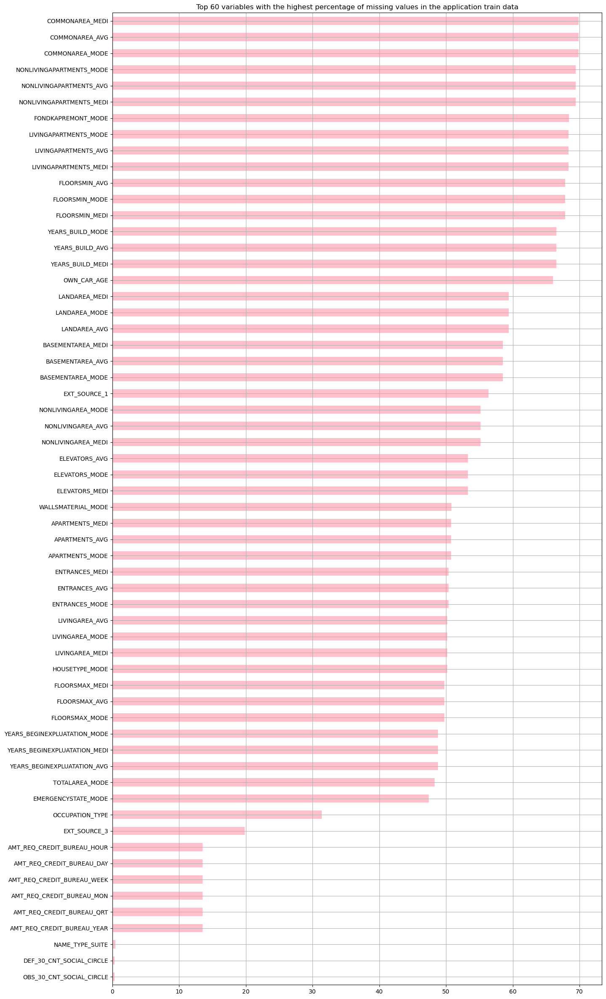

In [16]:
#providing figure size details

plt.figure(figsize=(17, 8))
#sorting values to be plotted

missing_application_train_data['Percent'].sort_values().tail(60).plot.barh(figsize=(15, 30), color='pink')
plt.title("Top 60 variables with the highest percentage of missing values in the application train data")
plt.grid(True)
plt.show();

In [17]:
percent = (datasets["application_test"].isnull().sum()/datasets["application_test"].isnull().count()*100).sort_values(ascending = False).round(2)
sum_missing = datasets["application_test"].isna().sum().sort_values(ascending = False)
missing_application_test_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Test Missing Count"])
missing_application_test_data.head(20)

,Percent,Test Missing Count
COMMONAREA_AVG,68.72,33495
COMMONAREA_MODE,68.72,33495
COMMONAREA_MEDI,68.72,33495
NONLIVINGAPARTMENTS_AVG,68.41,33347
NONLIVINGAPARTMENTS_MODE,68.41,33347
NONLIVINGAPARTMENTS_MEDI,68.41,33347
FONDKAPREMONT_MODE,67.28,32797
LIVINGAPARTMENTS_AVG,67.25,32780
LIVINGAPARTMENTS_MODE,67.25,32780
LIVINGAPARTMENTS_MEDI,67.25,32780


 We are creating a horizontal bar plot to visualize the top 60 variables with the highest percentage of missing values in the missing_application_test_data dataset.

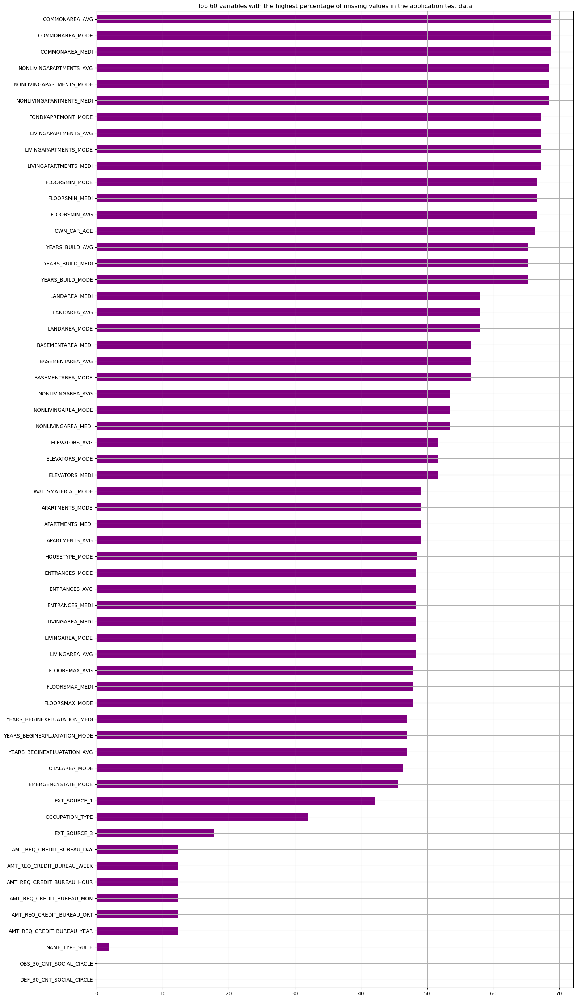

In [18]:
plt.figure(figsize=(17, 7))
missing_application_test_data['Percent'].sort_values().tail(60).plot.barh(figsize=(17, 35), color='purple')
plt.title("Top 60 variables with the highest percentage of missing values in the application test data")
plt.grid(True)
plt.show();  

   **Observations based on above plots**:
-Large portion of the data is missing , as we can see from the above plots.

In [19]:
# Saving the training and test data sets 

ap_train_data= datasets["application_train"]
ap_test_data = datasets["application_test"]


In [20]:
prev_ap_data= datasets["previous_application"]  

In [21]:
# Determining the categorical and numerical features

In [22]:
numerical_features = ap_train_data.select_dtypes(include = ['int64', 'float64']).columns
categorical_features = ap_train_data.select_dtypes(include = ['object', 'bool']).columns
print(f"\nNumerical features : {list(numerical_features)}")
print(f"\nCategorical features : {list(categorical_features)}")


Numerical features : ['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEARS_BEGINEXP

In [23]:
len(list(numerical_features))

106

In [24]:
len(list(categorical_features))

16

In [25]:
total_ip_features = len(list(numerical_features)) + len(list(categorical_features))
total_ip_features

122

## Distribution of the target column 

In [26]:
#Distributin of target 

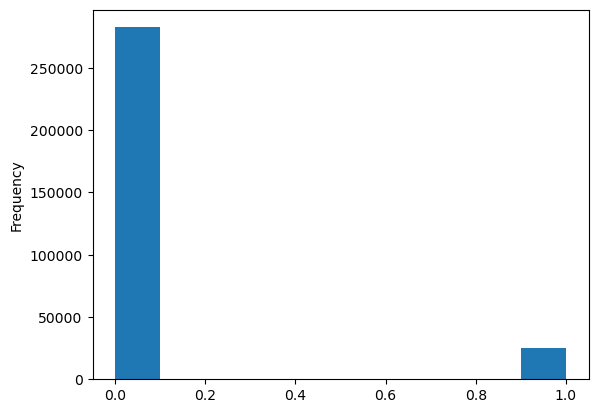

In [27]:
import matplotlib.pyplot as plt
%matplotlib inline

datasets["application_train"]['TARGET'].astype(int).plot.hist();

**Observation from the above plot**- 1.It is evident from the above plot,we can infer that greater than 250000 people have paid back the loan on time.

To comprehend the distribution of the binary variable  TARGET, that indicates whether or not a loan application failed on their loan.
We can determine the class balance or imbalance in the dataset by counting the number of instances in each class.


In [28]:
ap_train_data['TARGET'].value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

**Observation from the above plot** 2. The above count confirms our inference of  people paying  greater than 250000 , a total of 282686 people paid there  loans.

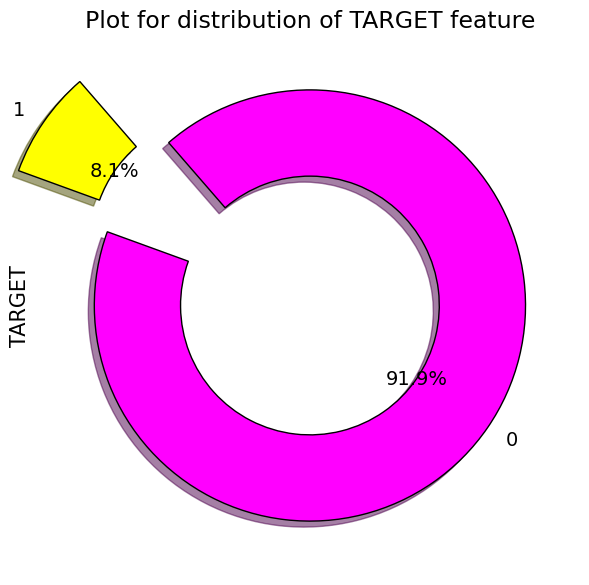

In [29]:
plt.figure(figsize=(7, 7))
plt.pie(x=ap_train_data['TARGET'].value_counts(),
        radius=1.5-0.5,
        labels=ap_train_data['TARGET'].value_counts().index,
        autopct='%1.1f%%',
        colors=['fuchsia', 'yellow'],
        explode=[0,0.5],
        wedgeprops={"edgecolor":"0", "width":0.4},
        startangle=160,
        shadow=True,
        textprops={'fontsize': 14})
plt.ylabel('TARGET', fontsize=15)
plt.title('Plot for distribution of TARGET feature', fontsize=17)
plt.show()

**Observation from the above plot**a.The TARGET feature exhibits a significant amount of unbalance, as can be observed,because of this, measuring the accuracy performance metric will be difficult.

## Correlation with  the target column 

In [30]:
correlations = datasets["application_train"].corr()['TARGET'].sort_values()
print('Most Positive Correlations:\n', correlations.tail(10))
print('\nMost Negative Correlations:\n', correlations.head(10))

Most Positive Correlations:
 FLAG_DOCUMENT_3                0.044346
REG_CITY_NOT_LIVE_CITY         0.044395
FLAG_EMP_PHONE                 0.045982
REG_CITY_NOT_WORK_CITY         0.050994
DAYS_ID_PUBLISH                0.051457
DAYS_LAST_PHONE_CHANGE         0.055218
REGION_RATING_CLIENT           0.058899
REGION_RATING_CLIENT_W_CITY    0.060893
DAYS_BIRTH                     0.078239
TARGET                         1.000000
Name: TARGET, dtype: float64

Most Negative Correlations:
 EXT_SOURCE_3                 -0.178919
EXT_SOURCE_2                 -0.160472
EXT_SOURCE_1                 -0.155317
DAYS_EMPLOYED                -0.044932
FLOORSMAX_AVG                -0.044003
FLOORSMAX_MEDI               -0.043768
FLOORSMAX_MODE               -0.043226
AMT_GOODS_PRICE              -0.039645
REGION_POPULATION_RELATIVE   -0.037227
ELEVATORS_AVG                -0.034199
Name: TARGET, dtype: float64


 **Observations from the above data**:
 1. Maximum positive correaltion for TARGET feature is 0.078239 which is observed with DAYS_BIRTH feature.
 2. Following this are the features REGION_RATING_CLIENT_W_CITY, REGION_RATING_CLIENT, DAYS_LAST_PHONE_CHANGE,      DAYS_ID_PUBLISH,DAYS_ID_PUBLISH.
 3. Another observation is a high value of indirect correaltion between TARGET and FLOORS features,AMT_GOODS_PRICE and relative population features .


In [31]:
#creating the correlation for the training data
tr_data_corr=ap_train_data.corr()

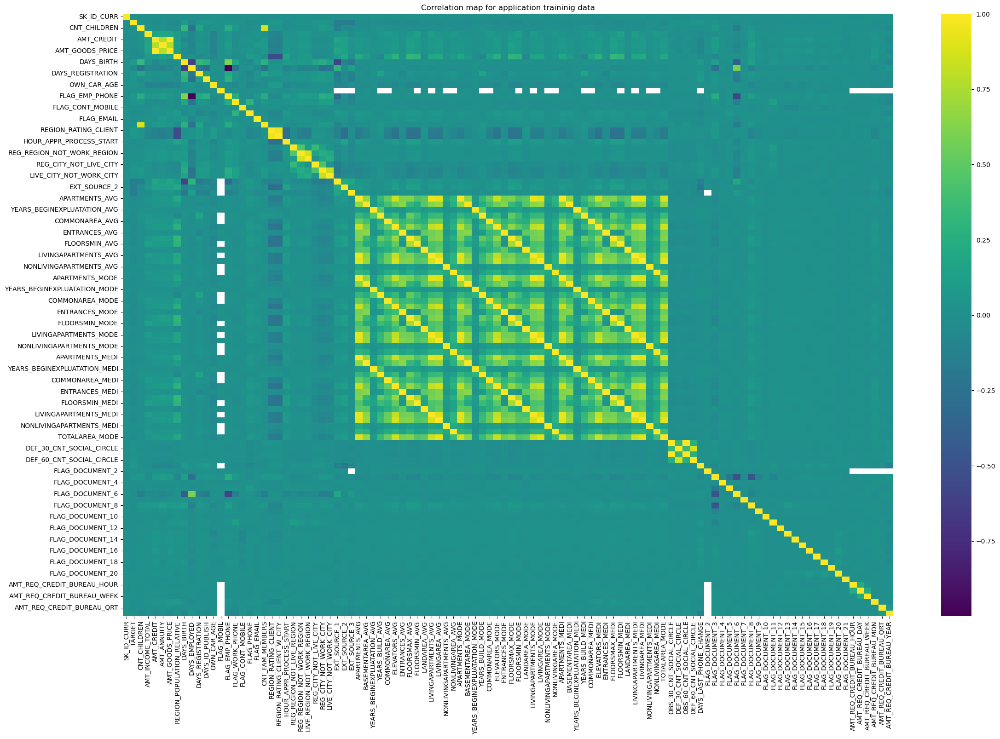

In [32]:
plt.figure(figsize=(27, 17))
sns.heatmap(tr_data_corr, cmap='viridis')
plt.title("Correlation map for application traininig data")
plt.plot();

 **Observations from the above data**:
 -The heatmap is a bit ambigous to read as we have 122 columns to compare from.


In [33]:
# Extracting the AMOUNT variables
#Representing the correlations
amt_data = tr_data_corr[['TARGET', 'AMT_CREDIT', 'AMT_INCOME_TOTAL', 'AMT_GOODS_PRICE']]
amt_corr = amt_data.corr()
print(amt_corr)

                    TARGET  AMT_CREDIT  AMT_INCOME_TOTAL  AMT_GOODS_PRICE
TARGET            1.000000   -0.143445         -0.079451        -0.153852
AMT_CREDIT       -0.143445    1.000000          0.355705         0.999502
AMT_INCOME_TOTAL -0.079451    0.355705          1.000000         0.358367
AMT_GOODS_PRICE  -0.153852    0.999502          0.358367         1.000000


In [34]:
amt_corr

,TARGET,AMT_CREDIT,AMT_INCOME_TOTAL,AMT_GOODS_PRICE
TARGET,1.000000,-0.143445,-0.079451,-0.153852
AMT_CREDIT,-0.143445,1.000000,0.355705,0.999502
AMT_INCOME_TOTAL,-0.079451,0.355705,1.000000,0.358367
AMT_GOODS_PRICE,-0.153852,0.999502,0.358367,1.000000


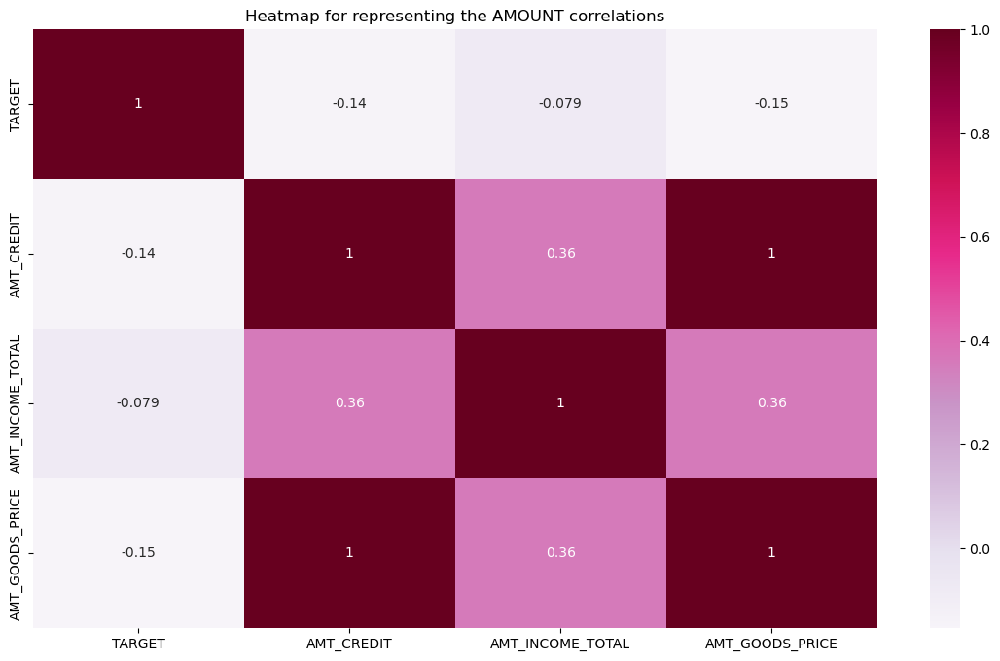

In [35]:
plt.figure(figsize=(14, 8))
sns.heatmap(amt_corr, annot=True, cmap='PuRd')
plt.title("Heatmap for representing the AMOUNT correlations")
plt.plot();

 Extract the EXT_SOURCE variables and Pair plot of the top 4 correlated features

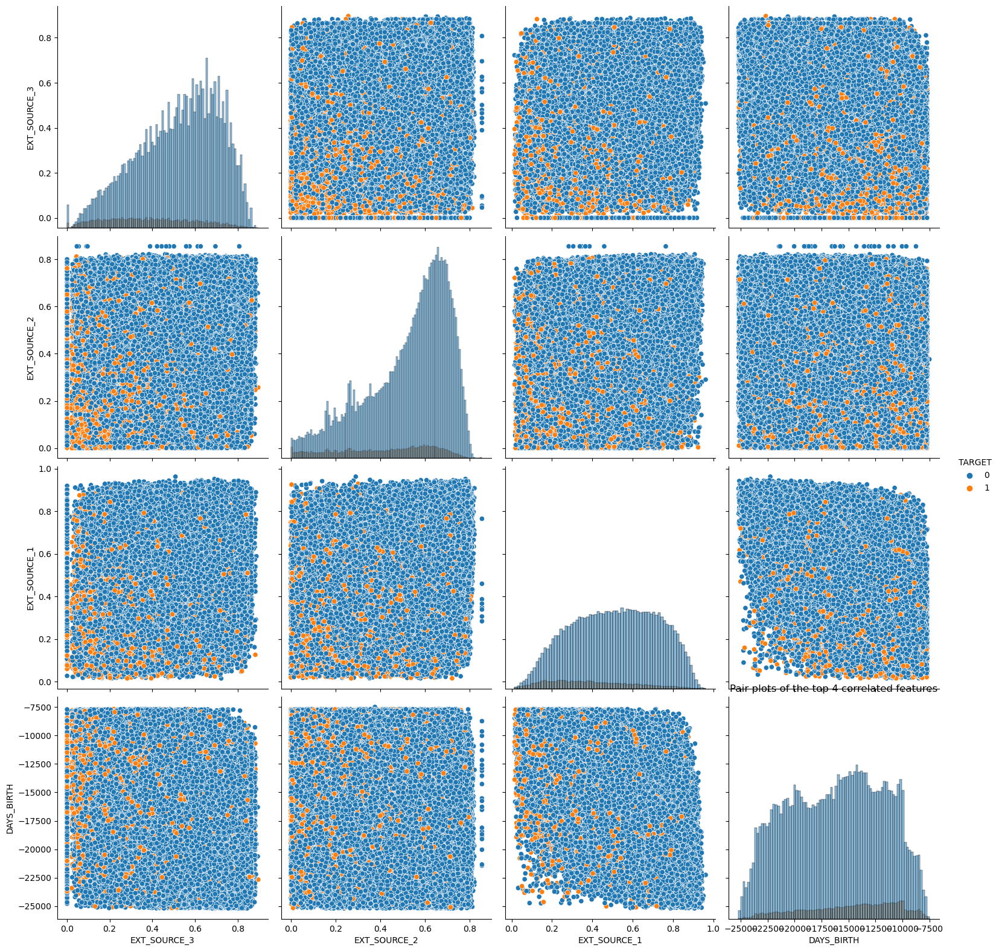

In [36]:
ext_source_vars = ["EXT_SOURCE_3", "EXT_SOURCE_2", "EXT_SOURCE_1","DAYS_BIRTH"]
sns.pairplot(data = datasets["application_train"], hue="TARGET", vars = ext_source_vars, height=4, diag_kind="hist")
plt.title("Pair plots of the top 4 correlated features")
plt.show()

In [37]:
ext_source_vars_corr = tr_data_corr[ext_source_vars].corr()
ext_source_vars_corr

,EXT_SOURCE_3,EXT_SOURCE_2,EXT_SOURCE_1,DAYS_BIRTH
EXT_SOURCE_3,1.000000,0.261958,0.473936,-0.474564
EXT_SOURCE_2,0.261958,1.000000,0.476205,-0.229976
EXT_SOURCE_1,0.473936,0.476205,1.000000,-0.847116
DAYS_BIRTH,-0.474564,-0.229976,-0.847116,1.000000


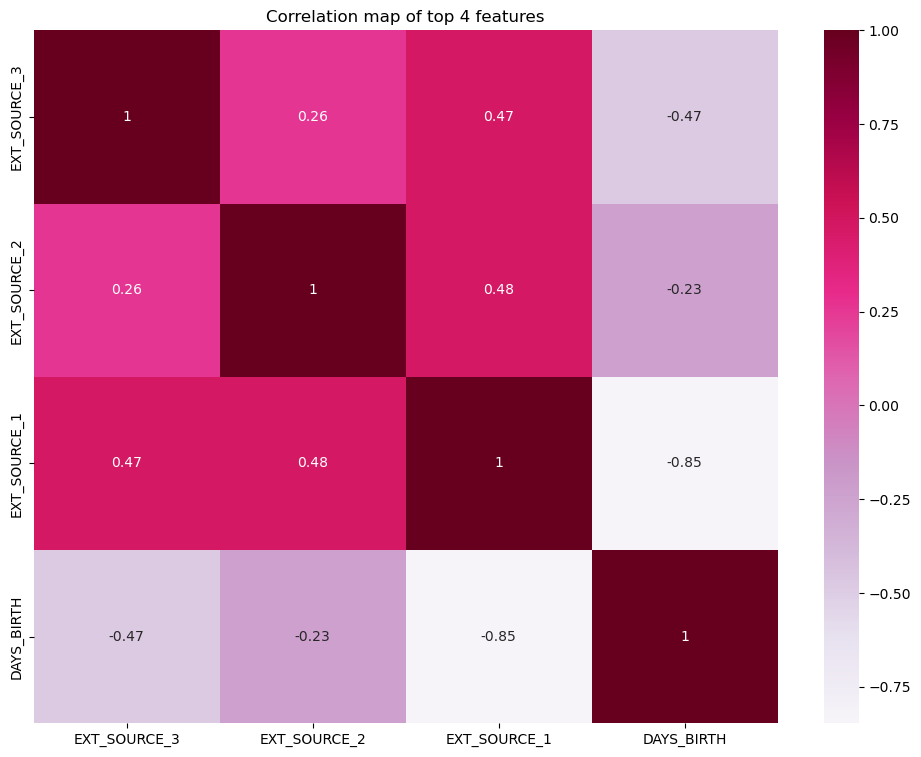

In [38]:
plt.figure(figsize=(12, 9))
sns.heatmap(ext_source_vars_corr, annot=True, cmap='PuRd')
plt.title("Correlation map of top 4 features")
plt.plot();

**Observation based on above**
- The heatmap demonstrates how extrinsic factors have a secondary impact on the TARGET characteristic.
- But, it is also clear from the correlations between them that multicollinearity exists.

In [39]:
ext_source_vars_corr.isnull().count()

EXT_SOURCE_3    4
EXT_SOURCE_2    4
EXT_SOURCE_1    4
DAYS_BIRTH      4
dtype: int64

## Applicants Age 

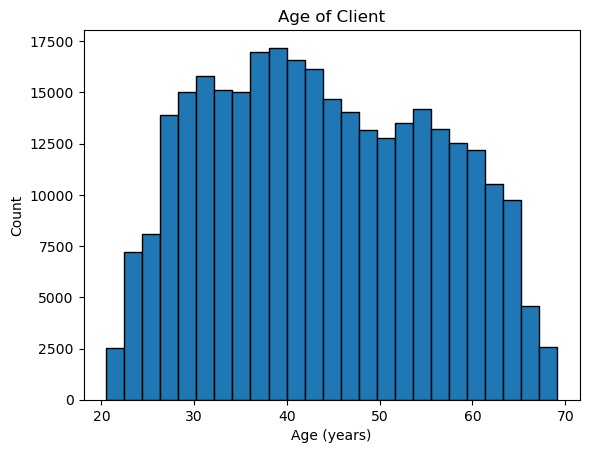

In [40]:
plt.hist(datasets["application_train"]['DAYS_BIRTH'] / -365, edgecolor = 'k', bins = 25)
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');

**Observations from the above plot**
- The DAYS_BIRTH feature, which contains negative values, is used to calculate age. This is inconsistent and needs to be fixed.

- When we plot age as a function of years, we observe a pretty normal distribution, which is encouraging in a challenging dataset where the DAYS BIRTH feature is substantially linked with the TARGET feature.

In [41]:
#Distribution based on gender,Applicants gender

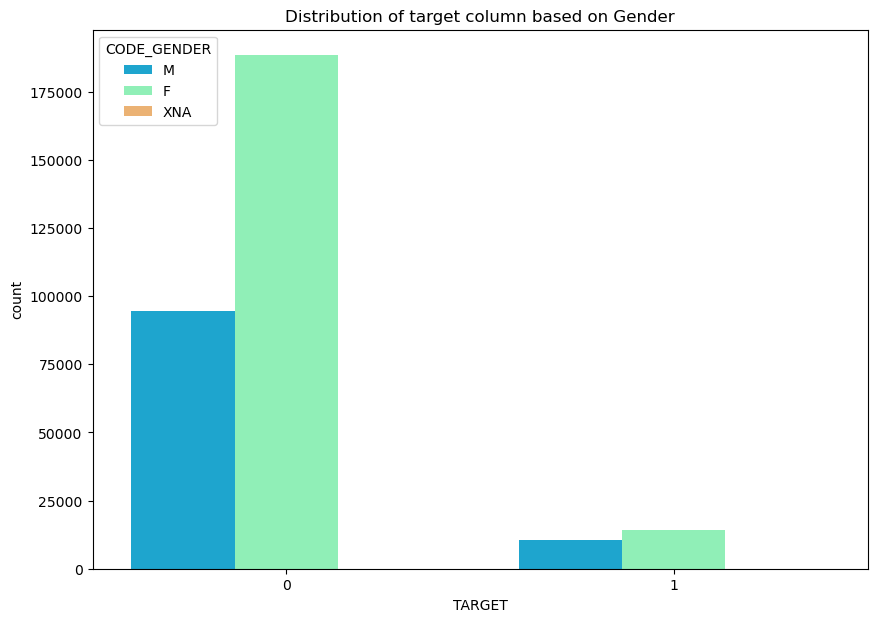

In [42]:
gend = datasets["application_train"]['CODE_GENDER']
plt.figure(figsize=(10,7))
sns.countplot(data =datasets["application_train"], x= datasets["application_train"]['TARGET'], hue=gend, palette='rainbow')
plt.title("Distribution of target column based on Gender")
plt.show()

**Observation from the above plot**
-Therefore it is evident from the count plot that women are obtaining more credit than men.

The purpose of this code is to group the 'YEARS_BIRTH' column into different age groups and analyze the distribution of 'TARGET' variable in each age group.

In [43]:
# creating different data frames for putting in age information
age_df = datasets["application_train"][['TARGET', 'DAYS_BIRTH']]
age_df['YEARS_BIRTH'] = age_df['DAYS_BIRTH'] / -365

# Bin the age data
age_df['GROUPED_YEARS_BIRTH'] = pd.cut(age_df['YEARS_BIRTH'], bins = np.linspace(20, 70, num = 11))
age_df.head(20)

,TARGET,DAYS_BIRTH,YEARS_BIRTH,GROUPED_YEARS_BIRTH
0,1,-9461,25.920548,"(25.0, 30.0]"
1,0,-16765,45.931507,"(45.0, 50.0]"
2,0,-19046,52.180822,"(50.0, 55.0]"
3,0,-19005,52.068493,"(50.0, 55.0]"
4,0,-19932,54.608219,"(50.0, 55.0]"
5,0,-16941,46.413699,"(45.0, 50.0]"
6,0,-13778,37.747945,"(35.0, 40.0]"
7,0,-18850,51.643836,"(50.0, 55.0]"
8,0,-20099,55.065753,"(55.0, 60.0]"
9,0,-14469,39.641096,"(35.0, 40.0]"


In [44]:
age_group_years  = age_df.groupby('GROUPED_YEARS_BIRTH').mean()
age_group_years

,TARGET,DAYS_BIRTH,YEARS_BIRTH
GROUPED_YEARS_BIRTH,,,
"(20.0, 25.0]",0.123036,-8532.795625,23.377522
"(25.0, 30.0]",0.111436,-10155.219250,27.822518
"(30.0, 35.0]",0.102814,-11854.848377,32.479037
"(35.0, 40.0]",0.089414,-13707.908253,37.555913
"(40.0, 45.0]",0.078491,-15497.661233,42.459346
"(45.0, 50.0]",0.074171,-17323.900441,47.462741
"(50.0, 55.0]",0.066968,-19196.494791,52.593136
"(55.0, 60.0]",0.055314,-20984.262742,57.491131
"(60.0, 65.0]",0.052737,-22780.547460,62.412459


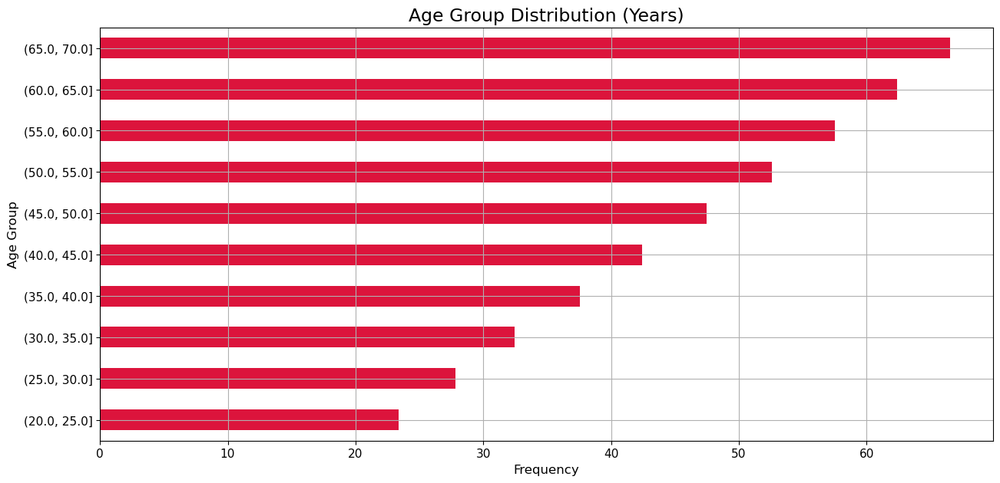

In [45]:
age_group_years['YEARS_BIRTH'].plot.barh(figsize=(15, 7), color='crimson')
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.xlabel('Frequency', fontsize=12)
plt.ylabel('Age Group', fontsize=12)
plt.grid(True)
plt.title('Age Group Distribution (Years)', fontsize=17)
plt.show()

**Observation from the above plot**- Following binning, we see that older persons have a propensity to take out more loans than younger people.

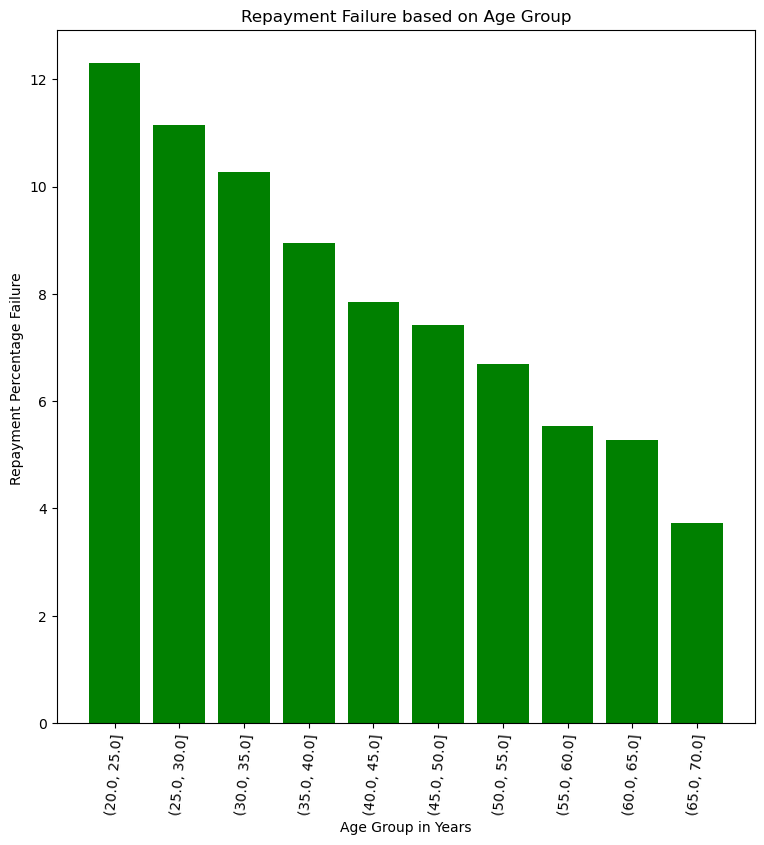

In [46]:
plt.figure(figsize = (9, 9))

# Graph the age bins and the average of the target as a bar plot
plt.bar(age_group_years.index.astype(str), 100 * age_group_years['TARGET'],color='green')

# Label 
plt.xticks(rotation = 85); plt.xlabel('Age Group in Years'); plt.ylabel('Repayment Percentage Failure ')
plt.title('Repayment Failure based on Age Group');

**Observations from the above plot**
The Binning method is utilized to provide precise information regarding age.

Now, it can generally be deduced that the age range of 20 to 25 years is where the most majority of people who are essentially unable to essentially repay the loan on time for the most part reside. Contrary to popular opinion, a decline in the number of failures is typically observed as age increases.Younger applicants are actually more likely to default on the loan, showing that it can now be generally deduced that the majority of borrowers who normally are unable to return the loan on time type of fall into the age range of 20–25 years, which is actually quite substantial.Younger applicants are generally more likely to default on a loan, so banks should generally be advised against doing so. This proves that, contrary to popular belief, the age group of 20 to 25 years is actually where the majority of borrowers fail to repay loans in a timely manner.

## Applicants occupations

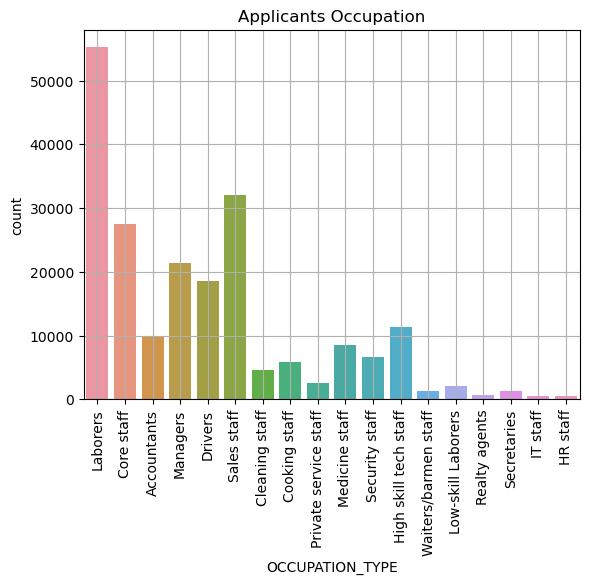

In [47]:
sns.countplot(x='OCCUPATION_TYPE', data=datasets["application_train"]);
plt.title('Applicants Occupation');
plt.grid(True)
plt.xticks(rotation=90);

**Observation based on plot**
Contrary to popular opinion, the majority of the candidates' occupations are studied here. It is generally accepted that laborers kind of tend to kind of take the loan most fundamentally followed by sales staff, demonstrating how this is generally accepted that laborers kind of tend to kind of take the loan most fundamentally followed by sales staff in a subtle way.

Is creating a visual representation of the distribution of applicants' occupation types 

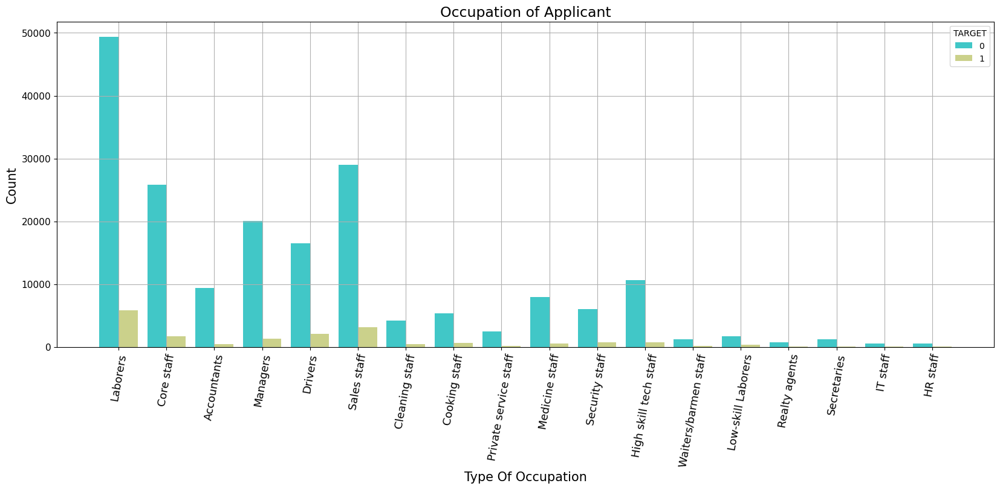

In [48]:
plt.figure(figsize=(20, 7))
sns.countplot(x='OCCUPATION_TYPE', data=datasets["application_train"], hue='TARGET', palette='rainbow')
plt.xlabel('Type Of Occupation', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.xticks(rotation=80, fontsize=13)
plt.yticks(fontsize=11)
plt.title('Occupation of Applicant', fontsize=17)
plt.grid(True)
plt.plot();

**Observation of the above plot**
- There are 18 distinct occupations represented among the borrowers, with laborers, salespeople, core employees, managers, and drivers at the top.

- There is no clear pattern in the occupation classes whose borrowers effectively repay their loans.


**Applicant Education Type v/s TARGET**

In [49]:
ap_train_data['NAME_EDUCATION_TYPE'].value_counts()

Secondary / secondary special    218391
Higher education                  74863
Incomplete higher                 10277
Lower secondary                    3816
Academic degree                     164
Name: NAME_EDUCATION_TYPE, dtype: int64

By counting the number of occurrences of each unique value in this column, we can see how many applicants fall into each education category and get an idea of the overall educational background of the loan applicants in the dataset.

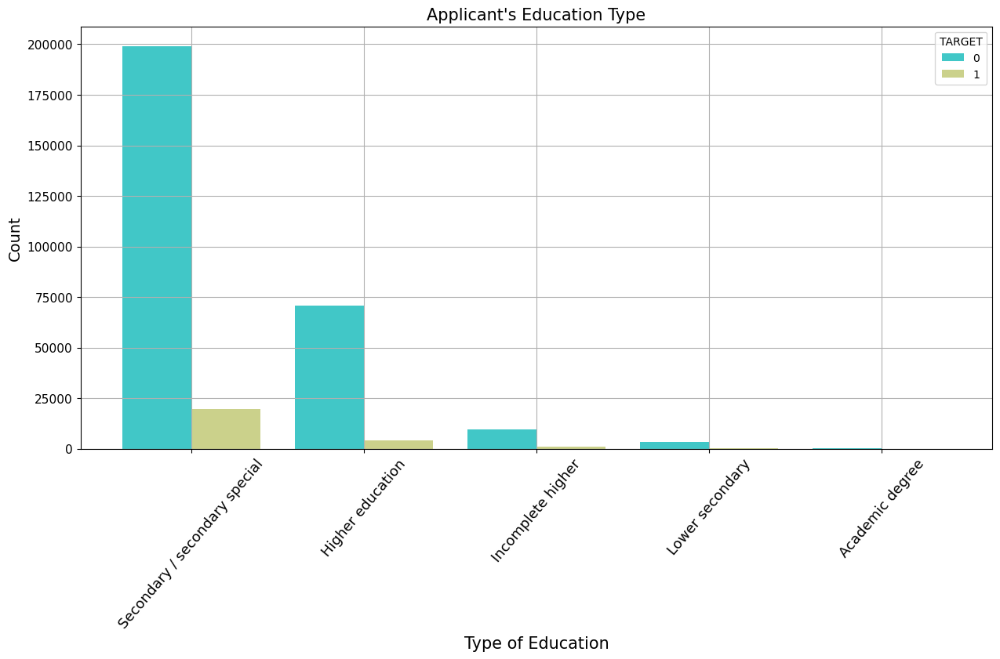

In [50]:
plt.figure(figsize=(15, 7))
sns.countplot(x='NAME_EDUCATION_TYPE', data=ap_train_data, palette='rainbow', hue='TARGET')
plt.xlabel('Type of Education', fontsize=15)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=50, fontsize=13)
plt.yticks(fontsize=11)
plt.title("Applicant's Education Type", fontsize=15)
plt.grid(True)
plt.plot();

**Observation from the plot**
- The majority of candidates have the greatest levels of secondary and higher education, with academic degrees being the lowest.

**Applicant Housing Type versus TARGET**

In [51]:
ap_train_data['NAME_HOUSING_TYPE'].value_counts()

House / apartment      272868
With parents            14840
Municipal apartment     11183
Rented apartment         4881
Office apartment         2617
Co-op apartment          1122
Name: NAME_HOUSING_TYPE, dtype: int64

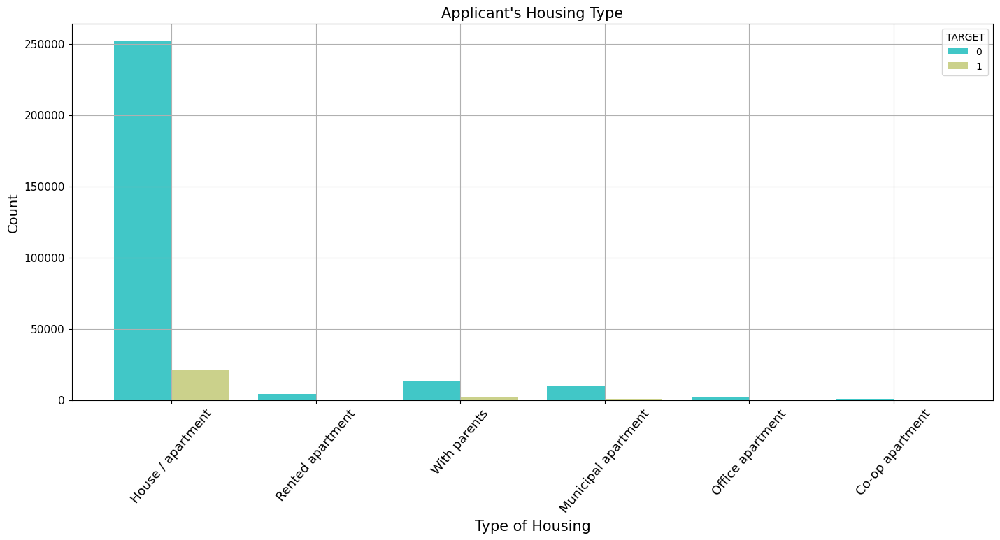

In [52]:
plt.figure(figsize=(17, 7))
sns.countplot(x='NAME_HOUSING_TYPE', data=ap_train_data, palette='rainbow', hue='TARGET')
plt.xlabel('Type of Housing', fontsize=15)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=50, fontsize=13)
plt.yticks(fontsize=11)
plt.title("Applicant's Housing Type", fontsize=15)
plt.grid(True)
plt.plot();

**Observation from the plot**
- The applicant now lives in houses or apartments the majority of the time, followed by municipal apartments and living with parents while looking for a new place for themselves.

**Applicant Contract Type**

In [53]:
ap_train_data['NAME_CONTRACT_TYPE'].value_counts()

Cash loans         278232
Revolving loans     29279
Name: NAME_CONTRACT_TYPE, dtype: int64

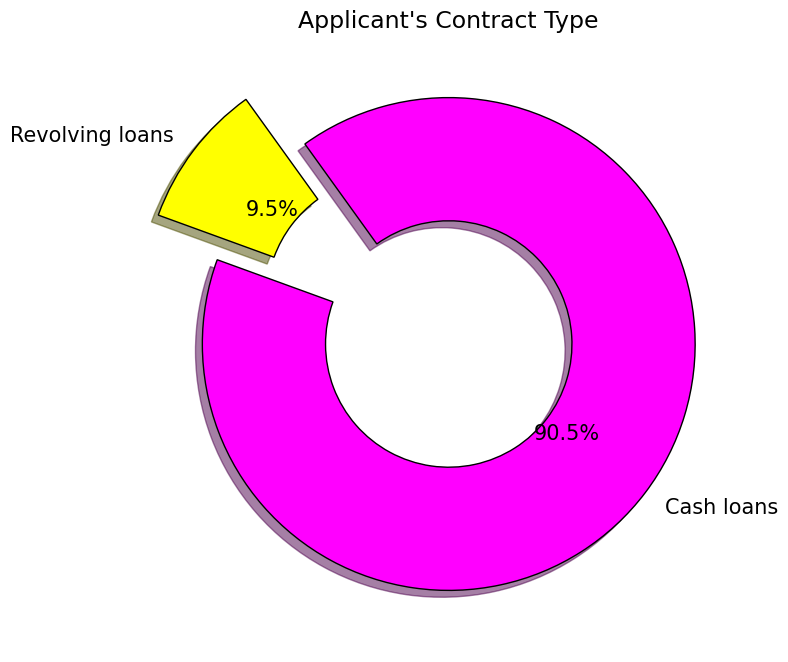

In [54]:
plt.figure(figsize=(8, 8))
plt.pie(x=ap_train_data['NAME_CONTRACT_TYPE'].value_counts(),
        radius=1.5-0.5,
        labels=ap_train_data['NAME_CONTRACT_TYPE'].value_counts().index,
        autopct='%1.1f%%',
        colors=['fuchsia', 'yellow'],
        explode=[0,0.3],
        wedgeprops={"edgecolor":"0", "width":0.5},
        startangle=160,
        shadow=True,
        textprops={'fontsize': 15})
plt.ylabel('', fontsize=15)
plt.title("Applicant's Contract Type", fontsize=17)
plt.show()

**Observation from the plot**
- Cash loans make up 90.5% of all loan contracts, while revolving loans, which can be repaid and refinanced repeatedly, account for the remaining 9.5%.

**Applicant Organization Type**

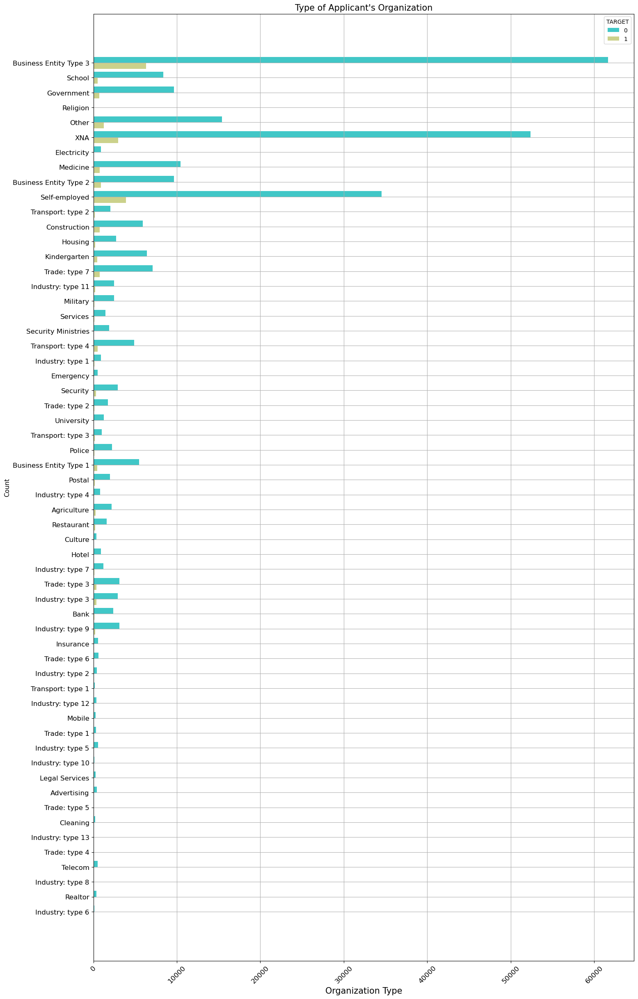

In [55]:
plt.figure(figsize=(17, 30))
sns.countplot(y='ORGANIZATION_TYPE', data=ap_train_data,hue='TARGET',palette='rainbow')
plt.title("Type of Applicant's Organization", fontsize=15)
plt.xlabel('Organization Type', fontsize=15)
plt.ylabel('Count', fontsize=11)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True)
plt.plot();

**Observation from the plot**
- The application pool includes a variety of organization kinds, with the majority coming from Type 3 commercial entities and self-employment.

**Applicant's House Wall Material Type**

In [56]:
ap_train_data['WALLSMATERIAL_MODE'].value_counts()

Panel           66040
Stone, brick    64815
Block            9253
Wooden           5362
Mixed            2296
Monolithic       1779
Others           1625
Name: WALLSMATERIAL_MODE, dtype: int64

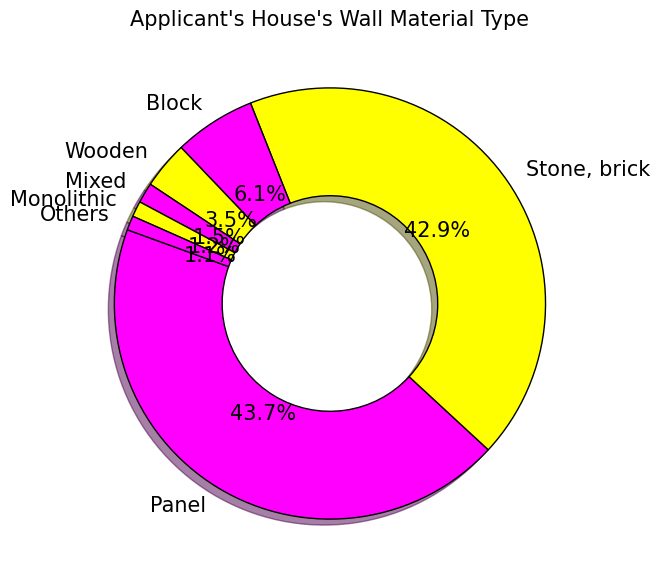

In [57]:
plt.figure(figsize=(7, 7))
plt.pie(x=ap_train_data['WALLSMATERIAL_MODE'].value_counts(),
        radius=1.5-0.5,
        labels=ap_train_data['WALLSMATERIAL_MODE'].value_counts().index,
        autopct='%1.1f%%',
        colors=['fuchsia', 'yellow'],
        wedgeprops={"edgecolor":"0", "width":0.5},
        startangle=160,
        shadow=True,
        textprops={'fontsize': 15})
plt.ylabel('', fontsize=15)
plt.title("Applicant's House's Wall Material Type", fontsize=15)
plt.show()


**Observation from the plot**
- The most common wall materials in applicant's homes are panels, stones, and bricks, followed by cement blocks, wood, or a combination of the aforementioned.

**Applicant's House Type Part 2**

In [58]:
ap_train_data['HOUSETYPE_MODE'].value_counts()

block of flats      150503
specific housing      1499
terraced house        1212
Name: HOUSETYPE_MODE, dtype: int64

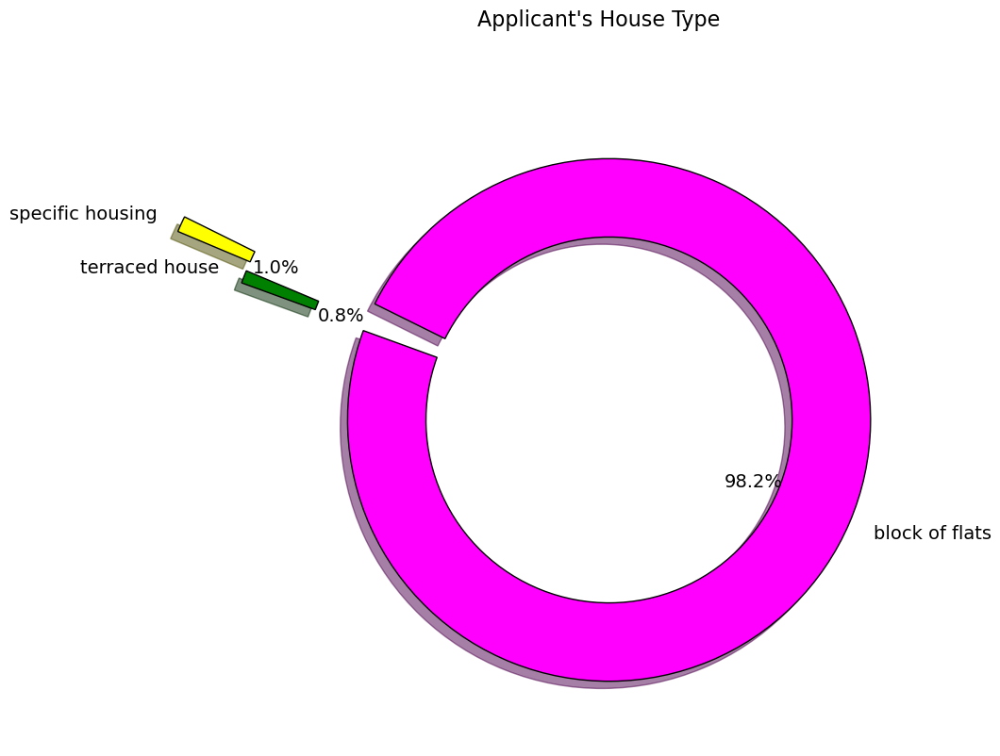

In [59]:
plt.figure(figsize=(9, 9))
plt.pie(x=ap_train_data['HOUSETYPE_MODE'].value_counts(),
        radius=1.5-0.5,
        labels=ap_train_data['HOUSETYPE_MODE'].value_counts().index,
        autopct='%1.1f%%',
        colors=['fuchsia', 'yellow', 'green'],
        explode=[0,0.8,0.5],
        wedgeprops={"edgecolor":"0", "width":0.3},
        startangle=160,
        shadow=True,
        textprops={'fontsize': 14})
plt.ylabel('', fontsize=14)
plt.suptitle("Applicant's House Type", fontsize=16)
plt.show()

**Observation from the plot**
- Applicants mostly reside in flats (more than 98%) while the remaining either live in terraced or other specific house types.

 **Applicant already own Realty?**

In [60]:
ap_train_data['FLAG_OWN_REALTY'].value_counts()

Y    213312
N     94199
Name: FLAG_OWN_REALTY, dtype: int64

In [61]:
#plotting if teh applicant already own the realty

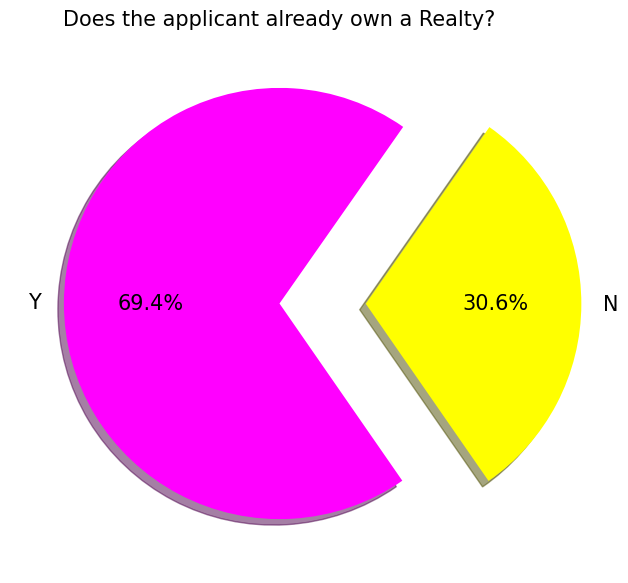

In [62]:
plt.figure(figsize=(7, 7))
plt.pie(x=ap_train_data['FLAG_OWN_REALTY'].value_counts(),
        radius=1.5-0.5,
        labels=ap_train_data['FLAG_OWN_REALTY'].value_counts().index,
        autopct='%1.1f%%',
        colors=['fuchsia', 'yellow'],
        explode=[0,0.4],
        
        startangle=55,
        shadow=True,
        textprops={'fontsize': 15})
plt.ylabel('', fontsize=15)
plt.title("Does the applicant already own a Realty?", fontsize=15)
plt.show()

**Observation from the plot**
- 69.4% of applicants have a home of their own. Check out the repayment's distribution.

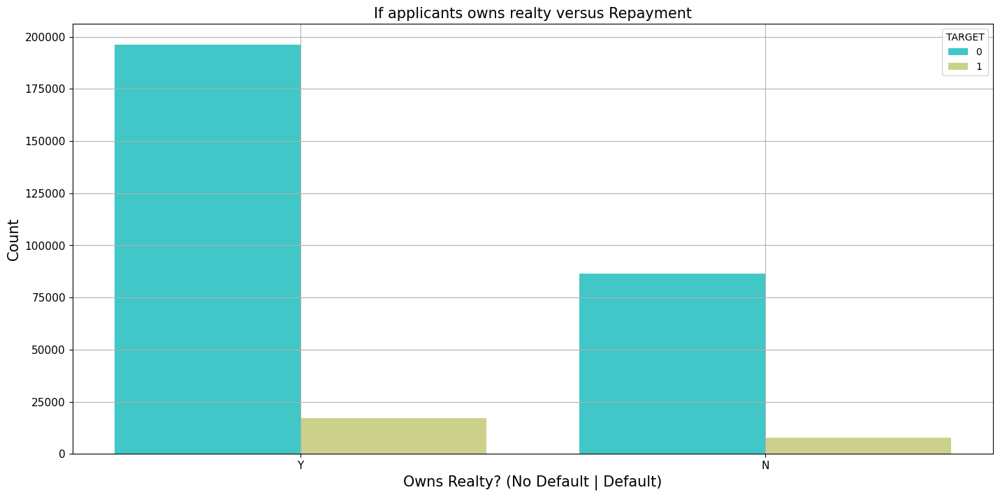

In [63]:
plt.figure(figsize=(17, 8))
sns.countplot(x='FLAG_OWN_REALTY', data=ap_train_data, palette='rainbow', hue='TARGET')

plt.xlabel('Owns Realty? (No Default | Default)', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.grid(True)
plt.title("If applicants owns realty versus Repayment", fontsize=15)
plt.plot();

 **Observation from the above plot**:

-The majority of applicants in either class are not defaulters. Less than 25000 applicants have real estate and are behind on their payments.


**Gender wise repayment analysis**

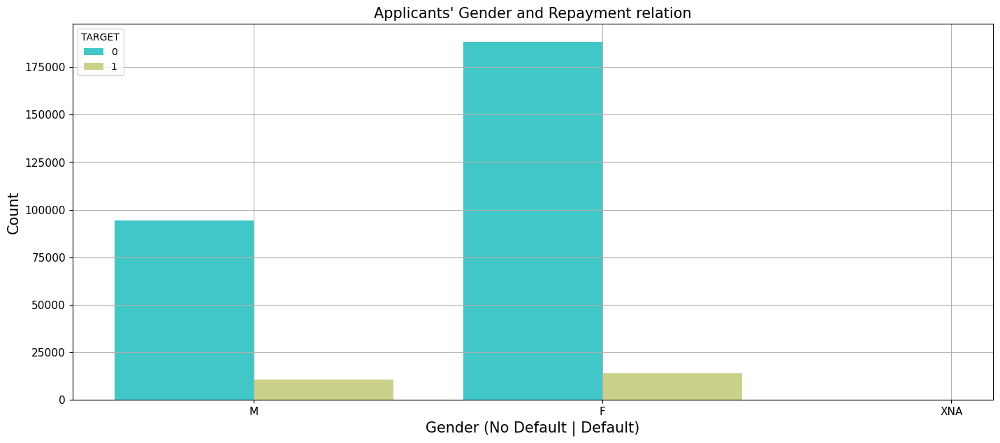

In [64]:
plt.figure(figsize=(17, 7))
sns.countplot(x='CODE_GENDER', data=ap_train_data, palette='rainbow', hue='TARGET')

plt.xlabel('Gender (No Default | Default)', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.grid(True)
plt.title("Applicants' Gender and Repayment relation", fontsize=15)
plt.plot();

**Observations**
- Female applicants make up the majority, and the majority of them have no history of defaults.

- In the case of male candidates, it is clear that a disproportionately higher percentage of applicants default.

In [65]:
### **AMT_CREDIT feature distribution plotting**

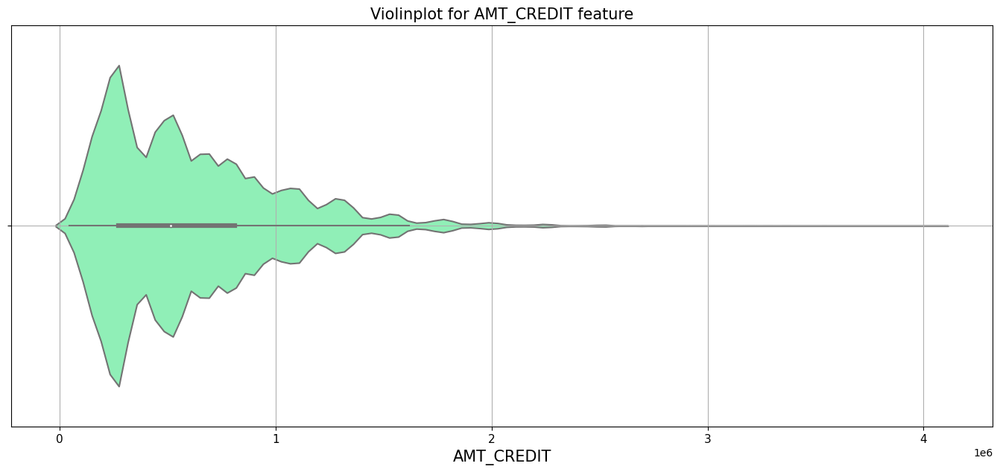

In [66]:
plt.figure(figsize=(17, 7))
sns.violinplot(x=ap_train_data['AMT_CREDIT'], palette='rainbow')
plt.xticks(size=11)
plt.yticks(size=11)
plt.xlabel('AMT_CREDIT', size=15)
plt.title('Violinplot for AMT_CREDIT feature', size=15)
plt.grid(True)

**Observations from the plot**
- The feature is right-skewed, as is evident.
- Sizing could aid in implementing this functionality effectively.

In [67]:
## ** AMT_ANNUITY feature distribution plotting**

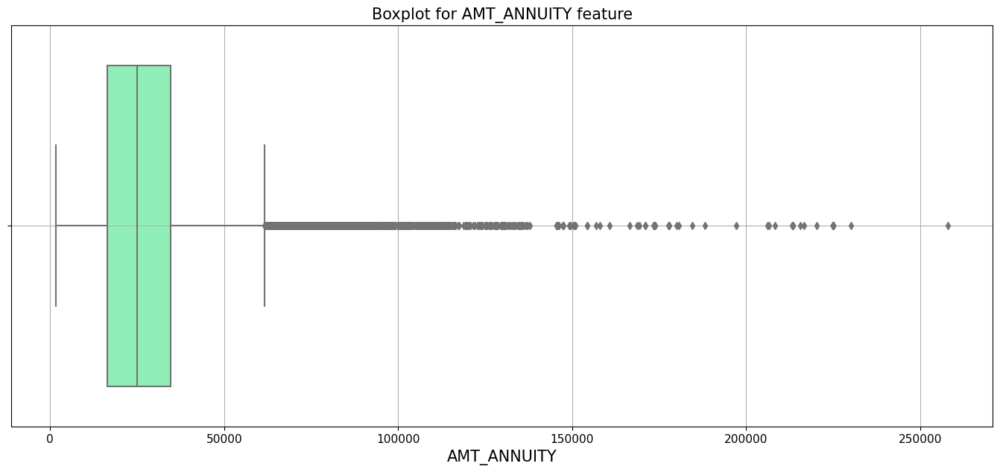

In [68]:
plt.figure(figsize=(17, 7))
sns.boxplot(x=ap_train_data['AMT_ANNUITY'], palette='rainbow')
plt.xticks(size=11)
plt.yticks(size=11)
plt.xlabel('AMT_ANNUITY', size=15)
plt.title('Boxplot for AMT_ANNUITY feature', size=15)
plt.grid(True)

**Observations from the plot**
- A right-skewed feature with numerous outliers is once again visible.

- We can't get rid of these outliers because doing so could mean losing crucial data.

In [69]:
# ** DAYS_EMPLOYED feature distribution plotting**

In [70]:
ap_train_data['DAYS_EMPLOYED'].describe()

count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

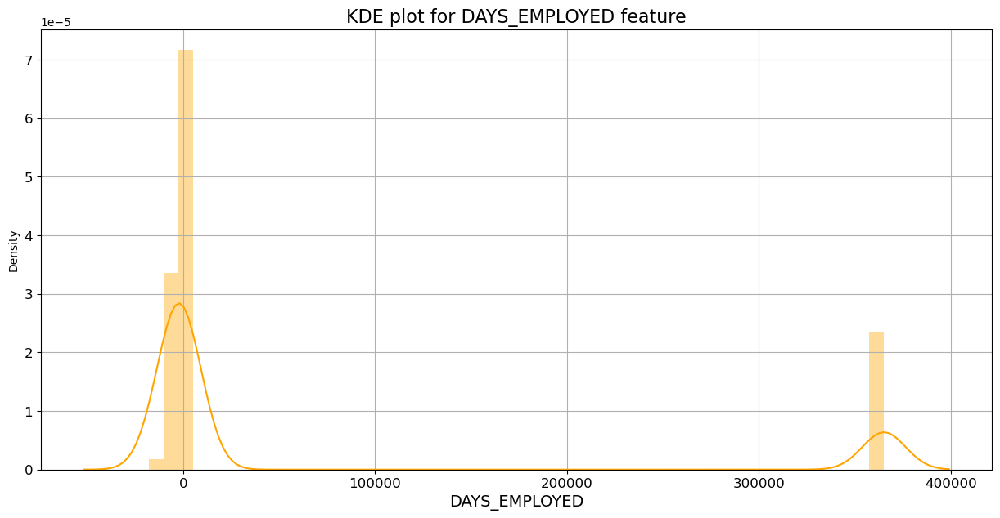

In [71]:
plt.figure(figsize=(15, 7))
sns.distplot(x=ap_train_data['DAYS_EMPLOYED'], color='orange')
plt.xticks(size=12)
plt.yticks(size=12)
plt.xlabel('DAYS_EMPLOYED', size=14)
plt.title('KDE plot for DAYS_EMPLOYED feature', size=16)
plt.grid(True)

**Observations from the plot**

- The negative days values for this feature are the same as those for DAYS_BIRTH.

- But, we notice a strange anomaly in this situation: the maximum number of days that can be worked is 365243, or a thousand years.

- We won't analyze teh anomaly we'll just ignore it and go ahead and examine the feature distribution once more.

In [72]:
# **Distribution of DAYS_EMPLOYED feature after removing the inconsistent value**

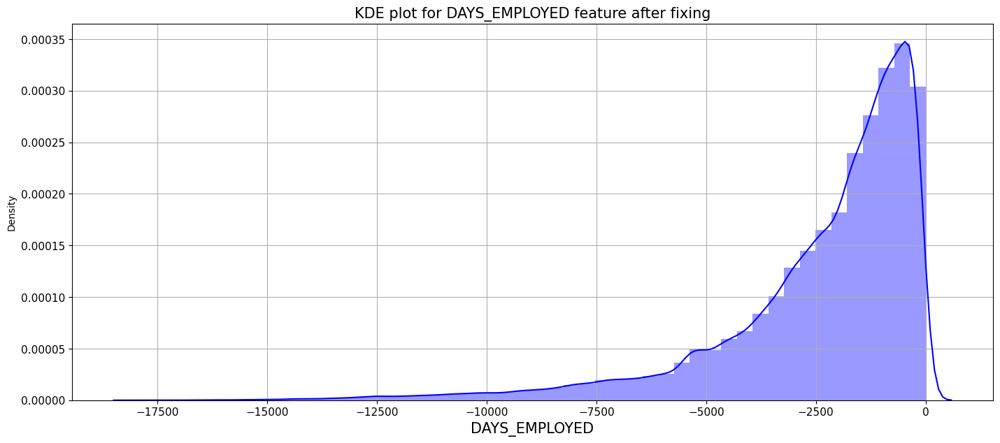

In [73]:
days_employed_fixed = ap_train_data['DAYS_EMPLOYED']
days_employed_fixed = days_employed_fixed[days_employed_fixed<365243]
plt.figure(figsize=(17, 7))
sns.distplot(x=days_employed_fixed, color='blue')
plt.xticks(size=11)
plt.yticks(size=11)
plt.xlabel('DAYS_EMPLOYED', size=15)
plt.title('KDE plot for DAYS_EMPLOYED feature after fixing', size=15)
plt.grid(True)

**Observations from the plot**
- In this graphic, we see left-skewed data that would become right-skewed if the days were flipped to the positive side.

In [74]:
# **Distribution of AMT_GOODS_PRICE feature**

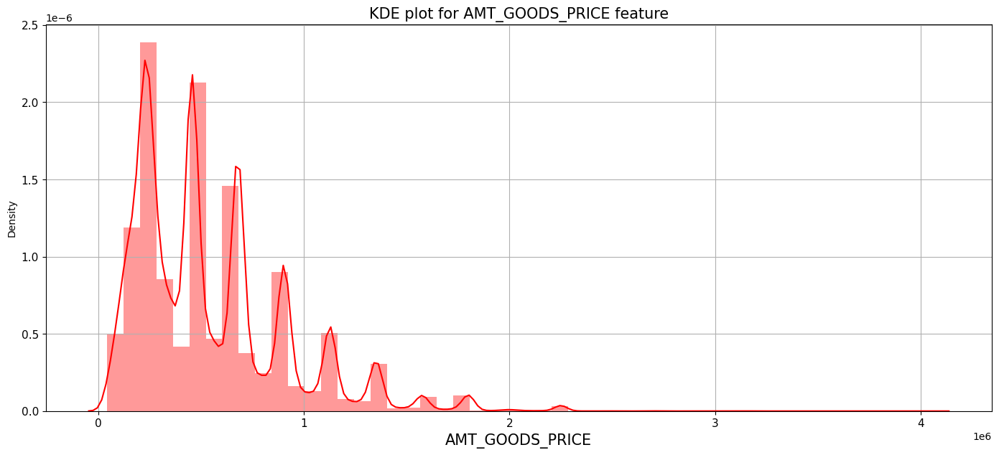

In [75]:
plt.figure(figsize=(17, 7))
sns.distplot(x=ap_train_data['AMT_GOODS_PRICE'], color='red')
plt.xticks(size=11)
plt.yticks(size=11)
plt.xlabel('AMT_GOODS_PRICE', size=15)
plt.title('KDE plot for AMT_GOODS_PRICE feature', size=15)
plt.grid(True)

**Observations from the plot**

- We see yet another multi-modal skewed distribution.

- Binning might make better use of this functionality.

In [76]:
# Fixing the issues with DAYS_EMPLOYES and DAYS_BIRTH features

In [77]:
ap_train_data['DAYS_BIRTH'] = ap_train_data['DAYS_BIRTH'] / -1
ap_test_data['DAYS_BIRTH'] = ap_test_data['DAYS_BIRTH'] / -1

ap_train_data['DAYS_EMPLOYED'] = ap_train_data['DAYS_EMPLOYED'][ap_train_data['DAYS_EMPLOYED']<365243]
ap_test_data['DAYS_EMPLOYED'] = ap_test_data['DAYS_EMPLOYED'][ap_test_data['DAYS_EMPLOYED']<365243]
ap_train_data['DAYS_EMPLOYED'] = ap_train_data['DAYS_EMPLOYED']/-1
ap_test_data['DAYS_EMPLOYED'] = ap_test_data['DAYS_EMPLOYED']/-1



In [78]:
ap_train_data['DAYS_EMPLOYED'].head()

0     637.0
1    1188.0
2     225.0
3    3039.0
4    3038.0
Name: DAYS_EMPLOYED, dtype: float64

In [79]:
ap_test_data['DAYS_EMPLOYED'].head()

0    2329.0
1    4469.0
2    4458.0
3    1866.0
4    2191.0
Name: DAYS_EMPLOYED, dtype: float64

In [80]:
ap_train_data['DAYS_BIRTH'].head()

0     9461.0
1    16765.0
2    19046.0
3    19005.0
4    19932.0
Name: DAYS_BIRTH, dtype: float64

In [81]:
ap_test_data['DAYS_BIRTH'].head()

0    19241.0
1    18064.0
2    20038.0
3    13976.0
4    13040.0
Name: DAYS_BIRTH, dtype: float64

# Dataset questions
## Unique record for each SK_ID_CURR

In [82]:
list(datasets.keys())

['application_train',
 'application_test',
 'bureau',
 'bureau_balance',
 'credit_card_balance',
 'installments_payments',
 'previous_application',
 'POS_CASH_balance']

In [83]:
len(datasets["application_train"]["SK_ID_CURR"].unique()) == datasets["application_train"].shape[0]

True

In [84]:
# is there an overlap between the test and train customers 
np.intersect1d(datasets["application_train"]["SK_ID_CURR"], datasets["application_test"]["SK_ID_CURR"])

array([], dtype=int64)

In [85]:
# 
datasets["application_test"].shape

(48744, 121)

In [86]:
datasets["application_train"].shape

(307511, 122)

## previous applications for the submission file
The persons in the kaggle submission file have had previous applications in the `previous_application.csv`. 47,800 out 48,744 people have had previous appications.

In [87]:
appsDF = datasets["previous_application"]
display(appsDF.head())
print(f"{appsDF.shape[0]:,} rows, {appsDF.shape[1]:,} columns")

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


1,670,214 rows, 37 columns


In [88]:
print(f"There are  {appsDF.shape[0]:,} previous applications")

There are  1,670,214 previous applications


In [89]:
#Find the intersection of two arrays.
print(f'Number of train applicants with previous applications is {len(np.intersect1d(datasets["previous_application"]["SK_ID_CURR"], datasets["application_train"]["SK_ID_CURR"])):,}')

Number of train applicants with previous applications is 291,057


In [90]:
#Find the intersection of two arrays.
print(f'Number of train applicants with previous applications is {len(np.intersect1d(datasets["previous_application"]["SK_ID_CURR"], datasets["application_test"]["SK_ID_CURR"])):,}')

Number of train applicants with previous applications is 47,800


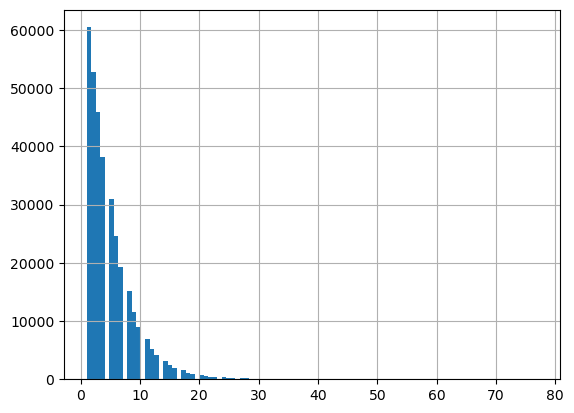

In [91]:
# How many previous applciations  per applicant in the previous_application 
prevAppCounts = appsDF['SK_ID_CURR'].value_counts(dropna=False)
len(prevAppCounts[prevAppCounts >40])  #more that 40 previous applications
plt.hist(prevAppCounts[prevAppCounts>=0], bins=100)
plt.grid()

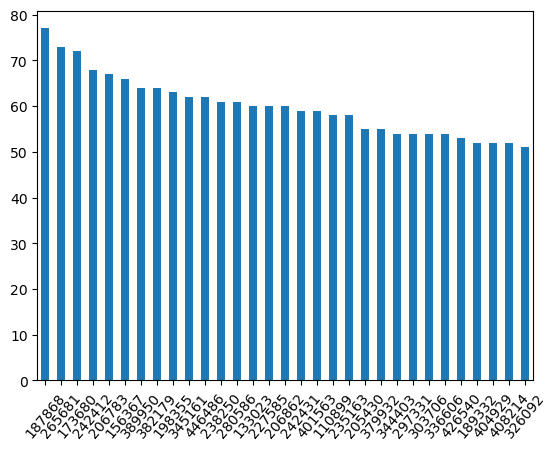

In [92]:
prevAppCounts[prevAppCounts >50].plot(kind='bar')
plt.xticks(rotation=50)
plt.show()

### Histogram of Number of previous applications for an ID

In [93]:
sum(appsDF['SK_ID_CURR'].value_counts()==1)

60458

Text(0.5, 1.0, 'Histogram of Number of previous applications for an ID')

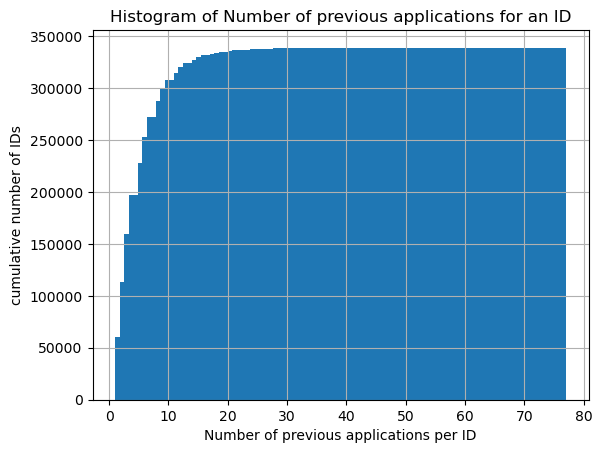

In [94]:
plt.hist(appsDF['SK_ID_CURR'].value_counts(), cumulative =True, bins = 100);
plt.grid()
plt.ylabel('cumulative number of IDs')
plt.xlabel('Number of previous applications per ID')
plt.title('Histogram of Number of previous applications for an ID')


##### **Can we differentiate applications by low, medium and high previous apps?**
    * Low = <5 claims (22%)
    * Medium = 10 to 39 claims (58%)
    * High = 40 or more claims (20%)

In [95]:
apps_all = appsDF['SK_ID_CURR'].nunique()
apps_5plus = appsDF['SK_ID_CURR'].value_counts()>=5
apps_40plus = appsDF['SK_ID_CURR'].value_counts()>=40
print('Percentage with 10 or more previous apps:', np.round(100.*(sum(apps_5plus)/apps_all),5))
print('Percentage with 40 or more previous apps:', np.round(100.*(sum(apps_40plus)/apps_all),5))

Percentage with 10 or more previous apps: 41.76895
Percentage with 40 or more previous apps: 0.03453


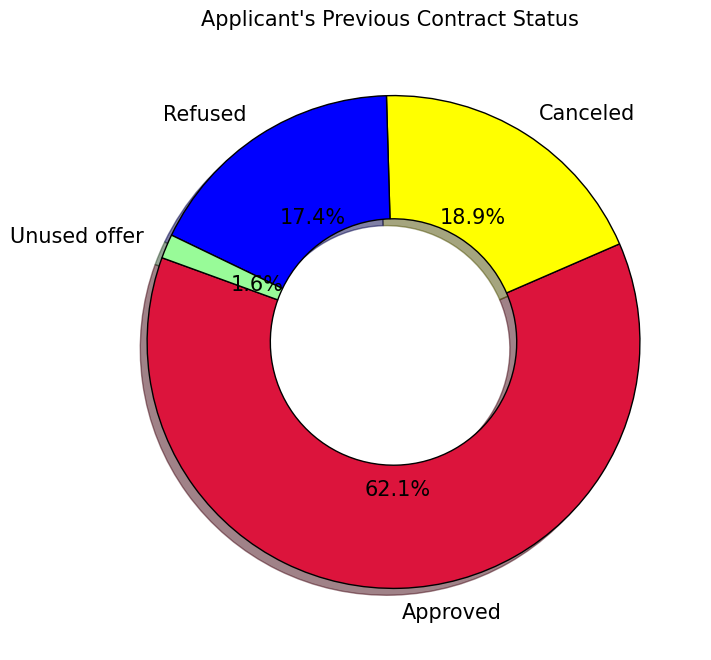

In [96]:
plt.figure(figsize=(8, 8))
plt.pie(x=appsDF['NAME_CONTRACT_STATUS'].value_counts(),
        radius=1.3-0.3,
        labels=appsDF['NAME_CONTRACT_STATUS'].value_counts().index,
        autopct='%1.1f%%',
        colors=['crimson', 'yellow', 'blue', 'palegreen'],
        wedgeprops={"edgecolor":"0", "width":0.5},
        startangle=160,
        shadow=True,
        textprops={'fontsize': 15})
plt.ylabel('', fontsize=145)
plt.title("Applicant's Previous Contract Status ", fontsize=15)
plt.show()

 **Observation from above**

- The majority of the applicants had their contracts approved in prior applications.

- 36% of candidates had their contracts refused or terminated, and the remaining 1.6% never used their contracts.

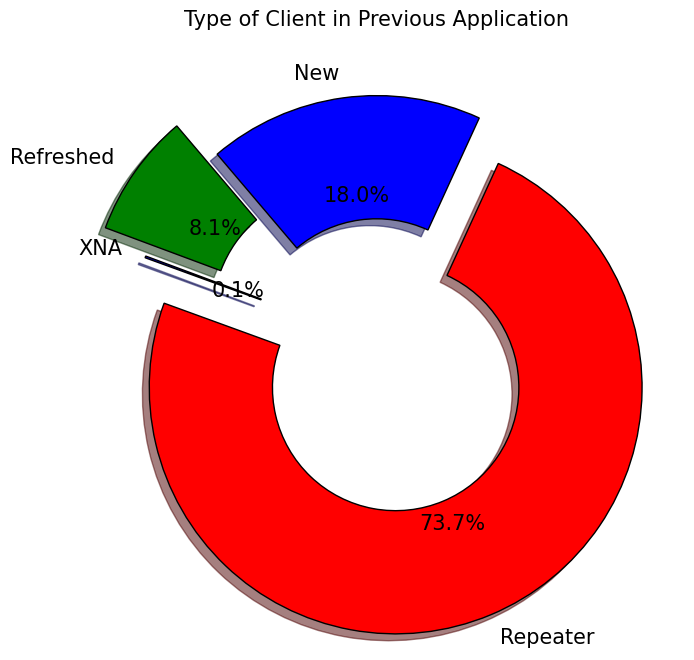

In [97]:
plt.figure(figsize=(8, 8))
plt.pie(x=appsDF['NAME_CLIENT_TYPE'].value_counts(),
        radius=1.3-0.3,
        labels=appsDF['NAME_CLIENT_TYPE'].value_counts().index,
        autopct='%1.1f%%',
        colors=['red', 'blue', 'green', 'blue'],
        explode=[0.2,0,0.2,0],
        wedgeprops={"edgecolor":"0", "width":0.5},
        startangle=160,
        shadow=True,
        textprops={'fontsize': 15})
plt.ylabel('', fontsize=15)
plt.title("Type of Client in Previous Application", fontsize=15)
plt.show()

**Observation from above**
- The majority of applicants are returning candidates, followed by fresh and new candidates.

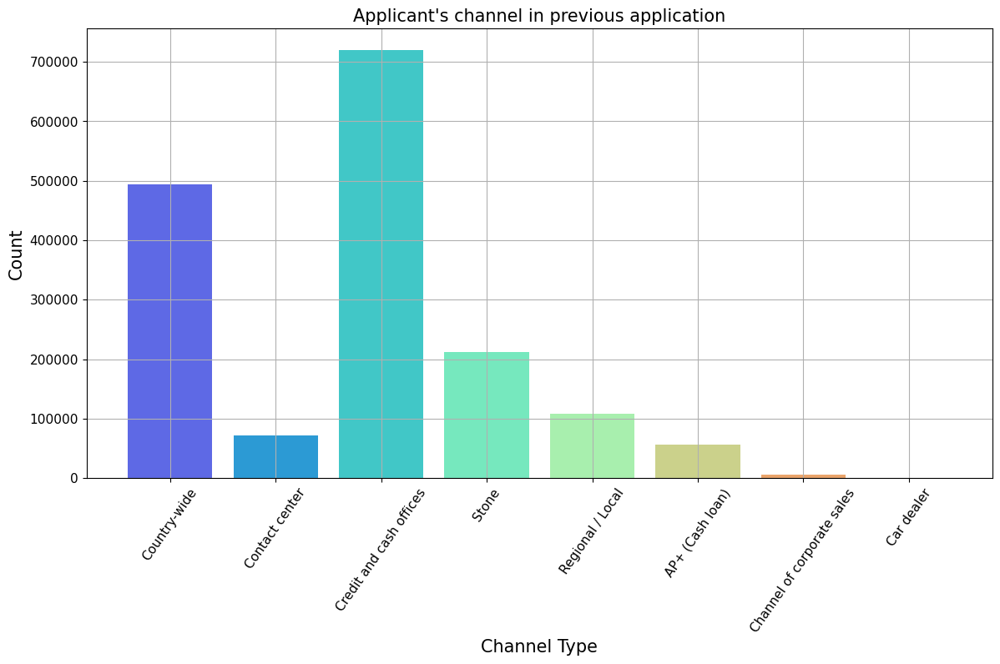

In [98]:
plt.figure(figsize=(14, 7))
sns.countplot(x='CHANNEL_TYPE', data=appsDF, palette='rainbow')
plt.xlabel('Channel Type', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.xticks(fontsize=11, rotation=55)
plt.yticks(fontsize=11)
plt.grid(True)
plt.title("Applicant's channel in previous application", fontsize=15)
plt.plot();

**Observation from above**
- The majority of prior applicants were referred by credit and cash offices, and vehicle dealers were the least common.

In [99]:
#Feature Engineering
#**Performing Encoding on Application train and Application Test's Categorical Features**


In [100]:
# Label Encoding
# Create a label encoder object
le = LabelEncoder()
le_count = 0

# Iterating through the columns
for col in ap_train_data:
    if ap_train_data[col].dtype == 'object':
        # If two or fewer unique categories
        if len(list(ap_train_data[col].unique())) <= 2:
            # Train on the training data
            le.fit(ap_train_data[col])
            # Transforming both training and testing data
            ap_train_data[col] = le.transform(ap_train_data[col])
            ap_test_data[col] = le.transform(ap_test_data[col])
            
            # Tracking of how many columns were label encoded
            le_count += 1
            
print('%d columns were label encoded.' % le_count)

3 columns were label encoded.


In [101]:
# one-hot encoding of features
ap_train_data = pd.get_dummies(ap_train_data)
ap_test_data = pd.get_dummies(ap_test_data)

print('Training Features shape: ', ap_train_data.shape)
print('Testing Features shape: ', ap_test_data.shape)

Training Features shape:  (307511, 243)
Testing Features shape:  (48744, 239)


In [102]:
training_labels = ap_train_data['TARGET']
# Aligning the training and testing data, keeping only columns present in both dataframes
ap_train_data, ap_test_data = ap_train_data.align(ap_test_data, join = 'inner', axis = 1)
# Add the target back in
ap_train_data['TARGET'] = training_labels
print('Training Features shape: ', ap_train_data.shape)
print('Testing Features shape: ', ap_test_data.shape)

Training Features shape:  (307511, 240)
Testing Features shape:  (48744, 239)


In [103]:
ap_train_data.to_csv('ap_train.csv', index=False)

In [104]:
ap_test_data.to_csv('ap_test.csv', index=False)

In [150]:
prev_ap_data.to_csv('prev_app.csv',index=False)  

In [106]:
# Modeling and Baseline


In [107]:
#Numerical features used:

In [151]:
print(*list(numerical_features), sep = ",")

SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVIN

In [152]:
# Categorical Features used:

In [153]:
print(*list(categorical_features), sep = ",")

NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE


# Joining secondary tables with the primary table

In the case of the HCDR competition (and many other machine learning problems that involve multiple tables in 3NF or not)  we need to join these datasets (denormalize) when using a machine learning pipeline. Joining the secondary tables with the primary table will lead to lots of new features about each loan application; these features will tend to be aggregate type features or meta data about the loan or its application. How can we do this when using Machine Learning Pipelines?

## Joining `previous_application` with `application_x`
We refer to the `application_train` data (and also `application_test` data also) as the **primary table** and the other files as the **secondary tables** (e.g., `previous_application` dataset). All tables can be joined using the primary key `SK_ID_PREV`.

Let's assume we wish to generate a feature based on previous application attempts. In this case, possible features here could be:

* A simple feature could be the number of previous applications.
* Other summary features of original features such as `AMT_APPLICATION`, `AMT_CREDIT` could be based on average, min, max, median, etc.
 
To build such features, we need to join the `application_train` data (and also `application_test` data also) with the 'previous_application' dataset (and the other available datasets).

When joining this data in the context of pipelines, different strategies come to mind with various tradeoffs:

1. Preprocess each of the non-application data sets, thereby generating many new (derived) features, and then joining (aka merge) the results with the `application_train` data (the labeled dataset) and with the `application_test` data (the unlabeled submission dataset) prior to processing the data (in a train, valid, test partition) via your machine learning pipeline. [This approach is recommended for this HCDR competition. WHY?]

* Do the joins as part of the transformation steps. [Not recommended here. WHY?]. How can this be done? Will it work?
  * This would be necessary if we had dataset wide features such as IDF (inverse document frequency) which depend on the entire subset of data as opposed to a single loan application (e.g., a feature about the relative amount applied for such as the percentile of the loan amount being applied for).
 
I want you to think about this section and build on this.

## Roadmap for secondary table processing

1. Transform all the secondary tables to features that can be joined into the main table the application table (labeled and unlabeled)
   * 'bureau', 'bureau_balance', 'credit_card_balance', 'installments_payments', 
   * 'previous_application', 'POS_CASH_balance'
* Merge the transformed secondary tables with the primary tables (i.e., the `application_train` data (the labeled dataset) and with the `application_test` data (the unlabeled submission dataset)), thereby leading to X_train, y_train, X_valid, etc.
* Proceed with the learning pipeline using X_train, y_train, X_valid, etc.
* Generate a submission file using the learnt model


In [154]:
!pwd

/Users/bhavyamistry/Downloads/OAML/Phase3 


In [155]:
#Getting the values from saved csv
ap_train_data=pd.read_csv('ap_train.csv')
ap_train_data.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,...,WALLSMATERIAL_MODE_Block,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes,TARGET
0,100002,0,0,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,...,0,0,0,0,0,1,0,1,0,1
1,100003,0,0,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,...,1,0,0,0,0,0,0,1,0,0
2,100004,1,1,1,0,67500.0,135000.0,6750.0,135000.0,0.010032,...,0,0,0,0,0,0,0,0,0,0
3,100006,0,0,1,0,135000.0,312682.5,29686.5,297000.0,0.008019,...,0,0,0,0,0,0,0,0,0,0
4,100007,0,0,1,0,121500.0,513000.0,21865.5,513000.0,0.028663,...,0,0,0,0,0,0,0,0,0,0


In [156]:
#Getting the values from saved csv
ap_test_data=pd.read_csv('ap_test.csv')
ap_test_data.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,...,HOUSETYPE_MODE_terraced house,WALLSMATERIAL_MODE_Block,WALLSMATERIAL_MODE_Mixed,WALLSMATERIAL_MODE_Monolithic,WALLSMATERIAL_MODE_Others,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",WALLSMATERIAL_MODE_Wooden,EMERGENCYSTATE_MODE_No,EMERGENCYSTATE_MODE_Yes
0,100001,0,0,1,0,135000.0,568800.0,20560.5,450000.0,0.018850,...,0,0,0,0,0,0,1,0,1,0
1,100005,0,0,1,0,99000.0,222768.0,17370.0,180000.0,0.035792,...,0,0,0,0,0,0,0,0,0,0
2,100013,0,1,1,0,202500.0,663264.0,69777.0,630000.0,0.019101,...,0,0,0,0,0,0,0,0,0,0
3,100028,0,0,1,2,315000.0,1575000.0,49018.5,1575000.0,0.026392,...,0,0,0,0,0,1,0,0,1,0
4,100038,0,1,0,1,180000.0,625500.0,32067.0,625500.0,0.010032,...,0,0,0,0,0,0,0,0,0,0


In [157]:
ap_train_data.shape, ap_test_data.shape

((307511, 240), (48744, 239))

#### Prev App Dataset

In [187]:
prev_ap = pd.read_csv('prev_app.csv')
prev_ap.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


## agg detour

Aggregate using one or more operations over the specified axis.

For more details see [agg](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.agg.html)
```python
DataFrame.agg(func, axis=0, *args, **kwargs**)
```
Aggregate using one or more operations over the specified axis.


In [188]:
df = pd.DataFrame([[1, 2, 3],
                    [4, 5, 6],
                   [7, 8, 9],
                   [np.nan, np.nan, np.nan]],
                   columns=['A', 'B', 'C'])
display(df)

,A,B,C
0,1.0,2.0,3.0
1,4.0,5.0,6.0
2,7.0,8.0,9.0
3,NaN,NaN,NaN


In [189]:
df.agg({'A' : ['sum', 'min'], 'B' : ['min', 'max']})
#        A    B
#max   NaN  8.0
#min   1.0  2.0
#sum  12.0  NaN

,A,B
sum,12.0,NaN
min,1.0,2.0
max,NaN,8.0


In [190]:
df = pd.DataFrame({'A': [1, 1, 2, 2],
                    'B': [1, 2, 3, 4],
                    'C': np.random.randn(4)})
display(df)

,A,B,C
0,1,1,0.413068
1,1,2,0.403249
2,2,3,-1.047532
3,2,4,-1.311695


In [191]:
# group by column A: 
df.groupby('A').agg({'B': ['min', 'max'], 'C': 'sum'})
#    B             C
#  min max       sum
#A
#1   1   2  0.590716
#2   3   4  0.704907

B             C
  min max       sum
A                  
1   1   2  0.816318
2   3   4 -2.359227

In [192]:
appsDF.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

In [193]:
funcs = ["a","b","c"]
{f:f"{f}_max" for f in funcs}

{'a': 'a_max', 'b': 'b_max', 'c': 'c_max'}

### Multiple condition expressions in Pandas
So far, both our boolean selections have involved a single condition. You can, of course, have as many conditions as you would like. To do so, you will need to combine your boolean expressions using the three logical operators and, or and not.

Use &, | , ~
Although Python uses the syntax and, or, and not, these will not work when testing multiple conditions with pandas. The details of why are explained [here](https://medium.com/dunder-data/selecting-subsets-of-data-in-pandas-39e811c81a0c).

You must use the following operators with pandas:

* & for and
* | for or
* ~ for not

In [194]:
appsDF[0:50][(appsDF["SK_ID_CURR"]==175704)]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
6,2315218,175704,Cash loans,NaN,0.0,0.0,NaN,NaN,TUESDAY,11,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN


In [195]:
appsDF[0:50][(appsDF["SK_ID_CURR"]==175704)]["AMT_CREDIT"]

6    0.0
Name: AMT_CREDIT, dtype: float64

In [196]:
appsDF[0:50][(appsDF["SK_ID_CURR"]==175704) & ~(appsDF["AMT_CREDIT"]==1.0)]

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
6,2315218,175704,Cash loans,NaN,0.0,0.0,NaN,NaN,TUESDAY,11,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN


## Missing values in prevApps

In [197]:
appsDF.isna().sum()

SK_ID_PREV                           0
SK_ID_CURR                           0
NAME_CONTRACT_TYPE                   0
AMT_ANNUITY                     372235
AMT_APPLICATION                      0
AMT_CREDIT                           1
AMT_DOWN_PAYMENT                895844
AMT_GOODS_PRICE                 385515
WEEKDAY_APPR_PROCESS_START           0
HOUR_APPR_PROCESS_START              0
FLAG_LAST_APPL_PER_CONTRACT          0
NFLAG_LAST_APPL_IN_DAY               0
RATE_DOWN_PAYMENT               895844
RATE_INTEREST_PRIMARY          1664263
RATE_INTEREST_PRIVILEGED       1664263
NAME_CASH_LOAN_PURPOSE               0
NAME_CONTRACT_STATUS                 0
DAYS_DECISION                        0
NAME_PAYMENT_TYPE                    0
CODE_REJECT_REASON                   0
NAME_TYPE_SUITE                 820405
NAME_CLIENT_TYPE                     0
NAME_GOODS_CATEGORY                  0
NAME_PORTFOLIO                       0
NAME_PRODUCT_TYPE                    0
CHANNEL_TYPE             

In [198]:
appsDF.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

### PrevApp Dataset Feature Engineering

In [171]:
# appsDF[agg_op_features].head()

In [199]:
list(appsDF.columns)

['SK_ID_PREV',
 'SK_ID_CURR',
 'NAME_CONTRACT_TYPE',
 'AMT_ANNUITY',
 'AMT_APPLICATION',
 'AMT_CREDIT',
 'AMT_DOWN_PAYMENT',
 'AMT_GOODS_PRICE',
 'WEEKDAY_APPR_PROCESS_START',
 'HOUR_APPR_PROCESS_START',
 'FLAG_LAST_APPL_PER_CONTRACT',
 'NFLAG_LAST_APPL_IN_DAY',
 'RATE_DOWN_PAYMENT',
 'RATE_INTEREST_PRIMARY',
 'RATE_INTEREST_PRIVILEGED',
 'NAME_CASH_LOAN_PURPOSE',
 'NAME_CONTRACT_STATUS',
 'DAYS_DECISION',
 'NAME_PAYMENT_TYPE',
 'CODE_REJECT_REASON',
 'NAME_TYPE_SUITE',
 'NAME_CLIENT_TYPE',
 'NAME_GOODS_CATEGORY',
 'NAME_PORTFOLIO',
 'NAME_PRODUCT_TYPE',
 'CHANNEL_TYPE',
 'SELLERPLACE_AREA',
 'NAME_SELLER_INDUSTRY',
 'CNT_PAYMENT',
 'NAME_YIELD_GROUP',
 'PRODUCT_COMBINATION',
 'DAYS_FIRST_DRAWING',
 'DAYS_FIRST_DUE',
 'DAYS_LAST_DUE_1ST_VERSION',
 'DAYS_LAST_DUE',
 'DAYS_TERMINATION',
 'NFLAG_INSURED_ON_APPROVAL']

In [200]:
list(prev_ap.columns)

['SK_ID_PREV',
 'SK_ID_CURR',
 'NAME_CONTRACT_TYPE',
 'AMT_ANNUITY',
 'AMT_APPLICATION',
 'AMT_CREDIT',
 'AMT_DOWN_PAYMENT',
 'AMT_GOODS_PRICE',
 'WEEKDAY_APPR_PROCESS_START',
 'HOUR_APPR_PROCESS_START',
 'FLAG_LAST_APPL_PER_CONTRACT',
 'NFLAG_LAST_APPL_IN_DAY',
 'RATE_DOWN_PAYMENT',
 'RATE_INTEREST_PRIMARY',
 'RATE_INTEREST_PRIVILEGED',
 'NAME_CASH_LOAN_PURPOSE',
 'NAME_CONTRACT_STATUS',
 'DAYS_DECISION',
 'NAME_PAYMENT_TYPE',
 'CODE_REJECT_REASON',
 'NAME_TYPE_SUITE',
 'NAME_CLIENT_TYPE',
 'NAME_GOODS_CATEGORY',
 'NAME_PORTFOLIO',
 'NAME_PRODUCT_TYPE',
 'CHANNEL_TYPE',
 'SELLERPLACE_AREA',
 'NAME_SELLER_INDUSTRY',
 'CNT_PAYMENT',
 'NAME_YIELD_GROUP',
 'PRODUCT_COMBINATION',
 'DAYS_FIRST_DRAWING',
 'DAYS_FIRST_DUE',
 'DAYS_LAST_DUE_1ST_VERSION',
 'DAYS_LAST_DUE',
 'DAYS_TERMINATION',
 'NFLAG_INSURED_ON_APPROVAL']

In [201]:
# Features list 
features = ['AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
            'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
            'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
            'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
            'DAYS_LAST_DUE', 'DAYS_TERMINATION']
print(f"{prev_ap[features].describe()}")
agg_ops = ["min", "max", "mean"]
result = prev_ap.groupby(["SK_ID_CURR"], as_index=False).agg("mean") #group by ID
display(result.head())
print("-"*50)
result = prev_ap.groupby(["SK_ID_CURR"], as_index=False).agg({'AMT_ANNUITY' : agg_ops, 'AMT_APPLICATION' : agg_ops})
result.columns = result.columns.map('_'.join)
display(result)
result['range_AMT_APPLICATION'] = result['AMT_APPLICATION_max'] - result['AMT_APPLICATION_min']
print(f"result.shape: {result.shape}")
result[0:10]

        AMT_ANNUITY  AMT_APPLICATION    AMT_CREDIT  AMT_DOWN_PAYMENT  \
count  1.297979e+06     1.670214e+06  1.670213e+06      7.743700e+05   
mean   1.595512e+04     1.752339e+05  1.961140e+05      6.697402e+03   
std    1.478214e+04     2.927798e+05  3.185746e+05      2.092150e+04   
min    0.000000e+00     0.000000e+00  0.000000e+00     -9.000000e-01   
25%    6.321780e+03     1.872000e+04  2.416050e+04      0.000000e+00   
50%    1.125000e+04     7.104600e+04  8.054100e+04      1.638000e+03   
75%    2.065842e+04     1.803600e+05  2.164185e+05      7.740000e+03   
max    4.180581e+05     6.905160e+06  6.905160e+06      3.060045e+06   

       AMT_GOODS_PRICE  RATE_DOWN_PAYMENT  RATE_INTEREST_PRIMARY  \
count     1.284699e+06      774370.000000            5951.000000   
mean      2.278473e+05           0.079637               0.188357   
std       3.153966e+05           0.107823               0.087671   
min       0.000000e+00          -0.000015               0.034781   
25%       5

,SK_ID_CURR,SK_ID_PREV,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,...,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100001,1.369693e+06,3951.000,24835.50,23787.00,2520.0,24835.5,13.000000,1.0,0.104326,...,NaN,-1740.0,23.0,8.0,365243.0,-1709.000000,-1499.000000,-1619.000000,-1612.000000,0.000000
1,100002,1.038818e+06,9251.775,179055.00,179055.00,0.0,179055.0,9.000000,1.0,0.000000,...,NaN,-606.0,500.0,24.0,365243.0,-565.000000,125.000000,-25.000000,-17.000000,0.000000
2,100003,2.281150e+06,56553.990,435436.50,484191.00,3442.5,435436.5,14.666667,1.0,0.050030,...,NaN,-1305.0,533.0,10.0,365243.0,-1274.333333,-1004.333333,-1054.333333,-1047.333333,0.666667
3,100004,1.564014e+06,5357.250,24282.00,20106.00,4860.0,24282.0,5.000000,1.0,0.212008,...,NaN,-815.0,30.0,4.0,365243.0,-784.000000,-694.000000,-724.000000,-714.000000,0.000000
4,100005,2.176837e+06,4813.200,22308.75,20076.75,4464.0,44617.5,10.500000,1.0,0.108964,...,NaN,-536.0,18.0,12.0,365243.0,-706.000000,-376.000000,-466.000000,-460.000000,0.000000


--------------------------------------------------


,SK_ID_CURR_,AMT_ANNUITY_min,AMT_ANNUITY_max,AMT_ANNUITY_mean,AMT_APPLICATION_min,AMT_APPLICATION_max,AMT_APPLICATION_mean
0,100001,3951.000,3951.000,3951.000000,24835.5,24835.5,24835.500
1,100002,9251.775,9251.775,9251.775000,179055.0,179055.0,179055.000
2,100003,6737.310,98356.995,56553.990000,68809.5,900000.0,435436.500
3,100004,5357.250,5357.250,5357.250000,24282.0,24282.0,24282.000
4,100005,4813.200,4813.200,4813.200000,0.0,44617.5,22308.750
...,...,...,...,...,...,...,...
338852,456251,6605.910,6605.910,6605.910000,40455.0,40455.0,40455.000
338853,456252,10074.465,10074.465,10074.465000,57595.5,57595.5,57595.500
338854,456253,3973.095,5567.715,4770.405000,19413.0,28912.5,24162.750
338855,456254,2296.440,19065.825,10681.132500,18846.0,223789.5,121317.750


result.shape: (338857, 8)


,SK_ID_CURR_,AMT_ANNUITY_min,AMT_ANNUITY_max,AMT_ANNUITY_mean,AMT_APPLICATION_min,AMT_APPLICATION_max,AMT_APPLICATION_mean,range_AMT_APPLICATION
0,100001,3951.000,3951.000,3951.000000,24835.5,24835.5,24835.500000,0.0
1,100002,9251.775,9251.775,9251.775000,179055.0,179055.0,179055.000000,0.0
2,100003,6737.310,98356.995,56553.990000,68809.5,900000.0,435436.500000,831190.5
3,100004,5357.250,5357.250,5357.250000,24282.0,24282.0,24282.000000,0.0
4,100005,4813.200,4813.200,4813.200000,0.0,44617.5,22308.750000,44617.5
5,100006,2482.920,39954.510,23651.175000,0.0,688500.0,272203.260000,688500.0
6,100007,1834.290,22678.785,12278.805000,17176.5,247500.0,150530.250000,230323.5
7,100008,8019.090,25309.575,15839.696250,0.0,450000.0,155701.800000,450000.0
8,100009,7435.845,17341.605,10051.412143,40455.0,110160.0,76741.714286,69705.0
9,100010,27463.410,27463.410,27463.410000,247212.0,247212.0,247212.000000,0.0


In [202]:
result.isna().sum()

SK_ID_CURR_                0
AMT_ANNUITY_min          480
AMT_ANNUITY_max          480
AMT_ANNUITY_mean         480
AMT_APPLICATION_min        0
AMT_APPLICATION_max        0
AMT_APPLICATION_mean       0
range_AMT_APPLICATION      0
dtype: int64

In [203]:
agg_ops

['min', 'max', 'mean']

The groupby output will have an index or multi-index on rows corresponding to your chosen grouping variables. To avoid setting this index, pass “as_index=False” to the groupby operation.

```python
import pandas as pd
import dateutil

# Load data from csv file
data = pd.DataFrame.from_csv('phone_data.csv')
# Convert date from string to date times
data['date'] = data['date'].apply(dateutil.parser.parse, dayfirst=True)

data.groupby('month', as_index=False).agg({"duration": "sum"})
```
Pandas `reset_index()` to convert Multi-Index to Columns
We can simplify the multi-index dataframe using reset_index() function in Pandas. By default, Pandas reset_index() converts the indices to columns.

#### Fixing Column names after Pandas agg() function to summarize grouped data
Since we have both the variable name and the operation performed in two rows in the Multi-Index dataframe, we can use that and name our new columns correctly.

For more details unstacking groupby results and examples please see [here](https://cmdlinetips.com/2020/05/fun-with-pandas-groupby-aggregate-multi-index-and-unstack/)




For more details and examples please see [here](https://www.shanelynn.ie/summarising-aggregation-and-grouping-data-in-python-pandas/)

In [204]:
features = ['AMT_ANNUITY', 'AMT_APPLICATION']
print(f"{appsDF[features].describe()}")
agg_ops = ["min", "max", "mean"]
result = appsDF.groupby(["SK_ID_CURR"], as_index=False).agg("mean") #group by ID
display(result.head())
print("-"*50)
result = appsDF.groupby(["SK_ID_CURR"], as_index=False).agg({'AMT_ANNUITY' : agg_ops, 'AMT_APPLICATION' : agg_ops})
result.columns = result.columns.map('_'.join)
display(result)
result['range_AMT_APPLICATION'] = result['AMT_APPLICATION_max'] - result['AMT_APPLICATION_min']
print(f"result.shape: {result.shape}")
result[0:10]

        AMT_ANNUITY  AMT_APPLICATION
count  1.297979e+06     1.670214e+06
mean   1.595512e+04     1.752339e+05
std    1.478214e+04     2.927798e+05
min    0.000000e+00     0.000000e+00
25%    6.321780e+03     1.872000e+04
50%    1.125000e+04     7.104600e+04
75%    2.065842e+04     1.803600e+05
max    4.180581e+05     6.905160e+06


,SK_ID_CURR,SK_ID_PREV,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,...,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100001,1.369693e+06,3951.000,24835.50,23787.00,2520.0,24835.5,13.000000,1.0,0.104326,...,NaN,-1740.0,23.0,8.0,365243.0,-1709.000000,-1499.000000,-1619.000000,-1612.000000,0.000000
1,100002,1.038818e+06,9251.775,179055.00,179055.00,0.0,179055.0,9.000000,1.0,0.000000,...,NaN,-606.0,500.0,24.0,365243.0,-565.000000,125.000000,-25.000000,-17.000000,0.000000
2,100003,2.281150e+06,56553.990,435436.50,484191.00,3442.5,435436.5,14.666667,1.0,0.050030,...,NaN,-1305.0,533.0,10.0,365243.0,-1274.333333,-1004.333333,-1054.333333,-1047.333333,0.666667
3,100004,1.564014e+06,5357.250,24282.00,20106.00,4860.0,24282.0,5.000000,1.0,0.212008,...,NaN,-815.0,30.0,4.0,365243.0,-784.000000,-694.000000,-724.000000,-714.000000,0.000000
4,100005,2.176837e+06,4813.200,22308.75,20076.75,4464.0,44617.5,10.500000,1.0,0.108964,...,NaN,-536.0,18.0,12.0,365243.0,-706.000000,-376.000000,-466.000000,-460.000000,0.000000


--------------------------------------------------


,SK_ID_CURR_,AMT_ANNUITY_min,AMT_ANNUITY_max,AMT_ANNUITY_mean,AMT_APPLICATION_min,AMT_APPLICATION_max,AMT_APPLICATION_mean
0,100001,3951.000,3951.000,3951.000000,24835.5,24835.5,24835.500
1,100002,9251.775,9251.775,9251.775000,179055.0,179055.0,179055.000
2,100003,6737.310,98356.995,56553.990000,68809.5,900000.0,435436.500
3,100004,5357.250,5357.250,5357.250000,24282.0,24282.0,24282.000
4,100005,4813.200,4813.200,4813.200000,0.0,44617.5,22308.750
...,...,...,...,...,...,...,...
338852,456251,6605.910,6605.910,6605.910000,40455.0,40455.0,40455.000
338853,456252,10074.465,10074.465,10074.465000,57595.5,57595.5,57595.500
338854,456253,3973.095,5567.715,4770.405000,19413.0,28912.5,24162.750
338855,456254,2296.440,19065.825,10681.132500,18846.0,223789.5,121317.750


result.shape: (338857, 8)


,SK_ID_CURR_,AMT_ANNUITY_min,AMT_ANNUITY_max,AMT_ANNUITY_mean,AMT_APPLICATION_min,AMT_APPLICATION_max,AMT_APPLICATION_mean,range_AMT_APPLICATION
0,100001,3951.000,3951.000,3951.000000,24835.5,24835.5,24835.500000,0.0
1,100002,9251.775,9251.775,9251.775000,179055.0,179055.0,179055.000000,0.0
2,100003,6737.310,98356.995,56553.990000,68809.5,900000.0,435436.500000,831190.5
3,100004,5357.250,5357.250,5357.250000,24282.0,24282.0,24282.000000,0.0
4,100005,4813.200,4813.200,4813.200000,0.0,44617.5,22308.750000,44617.5
5,100006,2482.920,39954.510,23651.175000,0.0,688500.0,272203.260000,688500.0
6,100007,1834.290,22678.785,12278.805000,17176.5,247500.0,150530.250000,230323.5
7,100008,8019.090,25309.575,15839.696250,0.0,450000.0,155701.800000,450000.0
8,100009,7435.845,17341.605,10051.412143,40455.0,110160.0,76741.714286,69705.0
9,100010,27463.410,27463.410,27463.410000,247212.0,247212.0,247212.000000,0.0


In [205]:
result.isna().sum()

SK_ID_CURR_                0
AMT_ANNUITY_min          480
AMT_ANNUITY_max          480
AMT_ANNUITY_mean         480
AMT_APPLICATION_min        0
AMT_APPLICATION_max        0
AMT_APPLICATION_mean       0
range_AMT_APPLICATION      0
dtype: int64

In [206]:
result.shape

(338857, 8)

#### Label Encoding using One-Hot-Encoder for Prev Apps Dataset

In [207]:
from sklearn.preprocessing import LabelEncoder

def label_encode(df, column):
    le = LabelEncoder()
    df[column] = le.fit_transform(df[column].fillna('NaN'))
    return df

object_cols = prev_ap.select_dtypes(include='object').columns

for col in object_cols:
    prev_ap = label_encode(prev_ap, col)

# Keep track of how many columns were label encoded
le_prev_count = len(object_cols)
            
print('%d columns were label encoded.' % le_prev_count)

16 columns were label encoded.


### PrevApp Dataset feature transformation

In [208]:
# # Create aggregate features (via pipeline)
class prevAppsFeaturesAggregater(BaseEstimator, TransformerMixin):
    def __init__(self, features=None): # no *args or **kargs
        self.features = features
        self.agg_op_features = {}
        for f in features:
            self.agg_op_features[f] =  ["min", "max", "mean"]

    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        result = X.groupby(["SK_ID_CURR"]).agg('mean')
        result = result.reset_index(level=["SK_ID_CURR"])
        return result

from sklearn.pipeline import make_pipeline 
def test_driver_prevAppsFeaturesAggregater(df, features):
    print(f"df.shape: {df.shape}\n")
    print(f"df[{features}][0:5]: \n{df[features][0:5]}")
    test_pipeline = make_pipeline(prevAppsFeaturesAggregater(features))
    return(test_pipeline.fit_transform(df))
         
features = ['AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
            'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
            'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
            'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
            'DAYS_LAST_DUE', 'DAYS_TERMINATION']

res = test_driver_prevAppsFeaturesAggregater(prev_ap, features)
print(f"Testing for 20 rows \n{res[0:20]}")

df.shape: (1670214, 37)

df[['AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE', 'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE', 'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION']][0:5]: 
   AMT_ANNUITY  AMT_APPLICATION  AMT_CREDIT  AMT_DOWN_PAYMENT  \
0     1730.430          17145.0     17145.0               0.0   
1    25188.615         607500.0    679671.0               NaN   
2    15060.735         112500.0    136444.5               NaN   
3    47041.335         450000.0    470790.0               NaN   
4    31924.395         337500.0    404055.0               NaN   

   AMT_GOODS_PRICE  RATE_DOWN_PAYMENT  RATE_INTEREST_PRIMARY  \
0          17145.0                0.0               0.182832   
1         607500.0                NaN                    NaN   
2         112500.0                NaN                    NaN

#### Merging the engineered features with the  train and test datasets:

In [209]:
ap_train_res = ap_train_data.merge(res, on = 'SK_ID_CURR', how = 'left')
ap_train_res.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE_x,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,REGION_POPULATION_RELATIVE,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100002,0,0,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,...,0.000000,24.000000,3.000000,16.000000,365243.0,-565.000000,125.000000,-25.000000,-17.000000,0.000000
1,100003,0,0,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,...,6.333333,10.000000,3.666667,9.666667,365243.0,-1274.333333,-1004.333333,-1054.333333,-1047.333333,0.666667
2,100004,1,1,1,0,67500.0,135000.0,6750.0,135000.0,0.010032,...,2.000000,4.000000,4.000000,15.000000,365243.0,-784.000000,-694.000000,-724.000000,-714.000000,0.000000
3,100006,0,0,1,0,135000.0,312682.5,29686.5,297000.0,0.008019,...,8.555556,23.000000,1.333333,5.222222,365243.0,91066.500000,91584.000000,182477.500000,182481.750000,0.000000
4,100007,0,0,1,0,121500.0,513000.0,21865.5,513000.0,0.028663,...,5.666667,20.666667,2.500000,8.500000,365243.0,-1263.200000,-837.200000,72136.200000,72143.800000,0.600000


In [210]:
ap_test_res = ap_test_data.merge(res, on = 'SK_ID_CURR', how = 'left')
ap_test_res.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE_x,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,REGION_POPULATION_RELATIVE,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100001,0,0,1,0,135000.0,568800.0,20560.5,450000.0,0.018850,...,2.0,8.000000,1.00,14.0,365243.000000,-1709.000000,-1499.000000,-1619.000000,-1612.000000,0.000000
1,100005,0,0,1,0,99000.0,222768.0,17370.0,180000.0,0.035792,...,6.0,12.000000,0.50,8.0,365243.000000,-706.000000,-376.000000,-466.000000,-460.000000,0.000000
2,100013,0,1,1,0,202500.0,663264.0,69777.0,630000.0,0.019101,...,6.5,17.333333,2.25,8.5,365243.000000,-1005.666667,-515.666667,-715.666667,-710.333333,0.333333
3,100028,0,0,1,2,315000.0,1575000.0,49018.5,1575000.0,0.026392,...,6.0,11.333333,1.20,7.6,243054.333333,-1271.000000,121221.333333,121171.333333,121182.666667,0.000000
4,100038,0,1,0,1,180000.0,625500.0,32067.0,625500.0,0.010032,...,6.0,24.000000,2.50,11.0,365243.000000,-787.000000,-457.000000,-457.000000,-449.000000,0.000000


In [211]:
print('Shape of the previous features: ', prev_ap.shape)
prev_ap.head()

Shape of the previous features:  (1670214, 37)


,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,1,1730.430,17145.0,17145.0,0.0,17145.0,2,15,...,2,12.0,4,14,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,0,25188.615,607500.0,679671.0,NaN,607500.0,4,11,...,10,36.0,2,7,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,0,15060.735,112500.0,136444.5,NaN,112500.0,5,11,...,10,12.0,1,6,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,0,47041.335,450000.0,470790.0,NaN,450000.0,1,7,...,10,12.0,4,8,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,0,31924.395,337500.0,404055.0,NaN,337500.0,4,9,...,10,24.0,1,3,NaN,NaN,NaN,NaN,NaN,NaN


### Polynomial features dataset from the train and test dataset for columns with high correlation with the TARGET feature

In [212]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.impute import SimpleImputer

# Make a new dataframe for polynomial features
poly_features_df = ap_train_data[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH', 'TARGET']]
poly_features_test_df = ap_test_data[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH']]

# imputer for handling missing values
# from sklearn.preprocessing import Imputer
imputer = SimpleImputer(strategy = 'median')

pn_target = poly_features_df['TARGET']

poly_features_df = poly_features_df.drop(columns = ['TARGET'])

# Need to impute missing values
poly_features_df = imputer.fit_transform(poly_features_df)
poly_features_test_df = imputer.transform(poly_features_test_df)
                                  
# Create the polynomial object with specified degree
pn_transformer = PolynomialFeatures(degree = 3)

In [213]:
# Train the polynomial features
pn_transformer.fit(poly_features_df)

# Transform the features
poly_features_df = pn_transformer.transform(poly_features_df)
poly_features_test_df = pn_transformer.transform(poly_features_test_df)
print('Shape of polynomial features: ', poly_features_df.shape)

Shape of polynomial features:  (307511, 35)


In [214]:
pn_transformer.get_feature_names(input_features = ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH', 'DAYS_EMPLOYED'])[:20]

['1',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'DAYS_BIRTH',
 'EXT_SOURCE_1^2',
 'EXT_SOURCE_1 EXT_SOURCE_2',
 'EXT_SOURCE_1 EXT_SOURCE_3',
 'EXT_SOURCE_1 DAYS_BIRTH',
 'EXT_SOURCE_2^2',
 'EXT_SOURCE_2 EXT_SOURCE_3',
 'EXT_SOURCE_2 DAYS_BIRTH',
 'EXT_SOURCE_3^2',
 'EXT_SOURCE_3 DAYS_BIRTH',
 'DAYS_BIRTH^2',
 'EXT_SOURCE_1^3',
 'EXT_SOURCE_1^2 EXT_SOURCE_2',
 'EXT_SOURCE_1^2 EXT_SOURCE_3',
 'EXT_SOURCE_1^2 DAYS_BIRTH',
 'EXT_SOURCE_1 EXT_SOURCE_2^2']

In [215]:
# Create a dataframe of the features 
poly_features_df = pd.DataFrame(poly_features_df, 
                             columns = pn_transformer.get_feature_names(['EXT_SOURCE_1', 'EXT_SOURCE_2', 
                                                                           'EXT_SOURCE_3', 'DAYS_BIRTH']))

# Add in the target
poly_features_df['TARGET'] = pn_target

# Find the correlations with the target
pn_corrs = poly_features_df.corr()['TARGET'].sort_values()

# Display most negative and most positive
print(pn_corrs.head(10))
print(pn_corrs.tail(5))

EXT_SOURCE_2 EXT_SOURCE_3                -0.193939
EXT_SOURCE_1 EXT_SOURCE_2 EXT_SOURCE_3   -0.189605
EXT_SOURCE_2 EXT_SOURCE_3 DAYS_BIRTH     -0.181283
EXT_SOURCE_2^2 EXT_SOURCE_3              -0.176428
EXT_SOURCE_2 EXT_SOURCE_3^2              -0.172282
EXT_SOURCE_1 EXT_SOURCE_2                -0.166625
EXT_SOURCE_1 EXT_SOURCE_3                -0.164065
EXT_SOURCE_2                             -0.160295
EXT_SOURCE_2 DAYS_BIRTH                  -0.156873
EXT_SOURCE_1 EXT_SOURCE_2^2              -0.156867
Name: TARGET, dtype: float64
DAYS_BIRTH     -0.078239
DAYS_BIRTH^2   -0.076672
DAYS_BIRTH^3   -0.074273
TARGET          1.000000
1                    NaN
Name: TARGET, dtype: float64


In [147]:
#### Merging the polynomial features with train and test dataset and aligning the two datasets to match their shapes:

In [216]:
# copying test features into dataframe
poly_features_test_df = pd.DataFrame(poly_features_test_df, 
                                  columns = pn_transformer.get_feature_names(['EXT_SOURCE_1', 'EXT_SOURCE_2', 
                                                                                'EXT_SOURCE_3', 'DAYS_BIRTH',
                                                                                'DAYS_EMPLOYED']))

# Merge polynomial features into training dataframe
poly_features_df['SK_ID_CURR'] = ap_train_data['SK_ID_CURR']
ap_train_data_poly = ap_train_data.merge(poly_features_df, on = 'SK_ID_CURR', how = 'left')

# Merge polnomial features into testing dataframe
poly_features_test_df['SK_ID_CURR'] = ap_test_data['SK_ID_CURR']
ap_test_data_poly = ap_test_data.merge(poly_features_test_df, on = 'SK_ID_CURR', how = 'left')

# Align the dataframes
ap_train_data_poly, ap_test_data_poly = ap_train_data_poly.align(ap_test_data_poly, join = 'inner', axis = 1)

# Print out the new shapes
print('Training data with polynomial features shape: ', ap_train_data_poly.shape)
print('Testing data with polynomial features shape:  ', ap_test_data_poly.shape)

Training data with polynomial features shape:  (307511, 274)
Testing data with polynomial features shape:   (48744, 274)


In [217]:
ap_train_data_poly['TARGET'] = ap_train_data['TARGET']
ap_train_data_poly.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,...,EXT_SOURCE_2^2 EXT_SOURCE_3,EXT_SOURCE_2^2 DAYS_BIRTH,EXT_SOURCE_2 EXT_SOURCE_3^2,EXT_SOURCE_2 EXT_SOURCE_3 DAYS_BIRTH,EXT_SOURCE_2 DAYS_BIRTH^2,EXT_SOURCE_3^3,EXT_SOURCE_3^2 DAYS_BIRTH,EXT_SOURCE_3 DAYS_BIRTH^2,DAYS_BIRTH^3,TARGET
0,100002,0,0,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,...,0.009637,654.152107,0.005108,346.733022,2.353667e+07,0.002707,183.785678,1.247560e+07,8.468590e+11,1
1,100003,0,0,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,...,0.207254,6491.237078,0.178286,5583.975307,1.748916e+08,0.153368,4803.518937,1.504475e+08,4.712058e+12,0
2,100004,1,1,1,0,67500.0,135000.0,6750.0,135000.0,0.010032,...,0.225464,5885.942404,0.295894,7724.580288,2.016572e+08,0.388325,10137.567875,2.646504e+08,6.908939e+12,0
3,100006,0,0,1,0,135000.0,312682.5,29686.5,297000.0,0.008019,...,0.226462,8040.528832,0.186365,6616.894625,2.349331e+08,0.153368,5445.325225,1.933364e+08,6.864416e+12,0
4,100007,0,0,1,0,121500.0,513000.0,21865.5,513000.0,0.028663,...,0.055754,2076.117157,0.092471,3443.335521,1.282190e+08,0.153368,5710.929881,2.126570e+08,7.918677e+12,0


In [218]:
ap_train_data_poly['TARGET'].head()

0    1
1    0
2    0
3    0
4    0
Name: TARGET, dtype: int64

In [219]:
 ap_test_data_poly.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,...,EXT_SOURCE_2^3,EXT_SOURCE_2^2 EXT_SOURCE_3,EXT_SOURCE_2^2 DAYS_BIRTH,EXT_SOURCE_2 EXT_SOURCE_3^2,EXT_SOURCE_2 EXT_SOURCE_3 DAYS_BIRTH,EXT_SOURCE_2 DAYS_BIRTH^2,EXT_SOURCE_3^3,EXT_SOURCE_3^2 DAYS_BIRTH,EXT_SOURCE_3 DAYS_BIRTH^2,DAYS_BIRTH^3
0,100001,0,0,1,0,135000.0,568800.0,20560.5,450000.0,0.018850,...,0.492392,0.099469,11997.802403,0.020094,2423.698322,2.923427e+08,0.004059,489.615795,5.905670e+07,7.123328e+12
1,100005,0,0,1,0,99000.0,222768.0,17370.0,180000.0,0.035792,...,0.024809,0.036829,1536.577117,0.054673,2281.043619,9.516956e+07,0.081161,3386.201665,1.412789e+08,5.894429e+12
2,100013,0,1,1,0,202500.0,663264.0,69777.0,630000.0,0.019101,...,0.342687,0.299203,9812.640816,0.261238,8567.521115,2.809794e+08,0.228089,7480.393855,2.453261e+08,8.045687e+12
3,100028,0,0,1,2,315000.0,1575000.0,49018.5,1575000.0,0.026392,...,0.132399,0.159163,3630.555667,0.191336,4364.443591,9.955450e+07,0.230013,5246.681115,1.196786e+08,2.729912e+12
4,100038,0,1,0,1,180000.0,625500.0,32067.0,625500.0,0.010032,...,0.077139,0.096997,2362.974127,0.121968,2971.298294,7.238455e+07,0.153368,3736.229463,9.101923e+07,2.217342e+12


#### Feature Aggregating for bureau.csv dataset

#### Bureau Dataset

In [220]:
bureau_df = pd.read_csv('./DATA_DIR/bureau.csv')
print(bureau_df.shape)
bureau_df.head()

(1716428, 17)


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


#### Merging Train Poly-data frame wih total_prev_loan_count

In [221]:
# Intersection of ap_train_data and ap_test_data, and number of previous applications with train applicaion
print(f'Intersection of ap_train_data and ap_test_data and ind  are: {len(np.intersect1d(bureau_df["SK_ID_CURR"], ap_train_data_poly["SK_ID_CURR"])):,}')

Intersection of ap_train_data and ap_test_data and ind  are: 263,491


In [222]:
# count the number of previous loans, with the Groupby client id (SK_ID_CURR)
total_prev_loan_count = bureau_df.groupby('SK_ID_CURR', as_index=False)['SK_ID_BUREAU'].count().rename(columns = {'SK_ID_BUREAU': 'total_prev_loan_count'})
total_prev_loan_count.head()

,SK_ID_CURR,total_prev_loan_count
0,100001,7
1,100002,8
2,100003,4
3,100004,2
4,100005,3


In [223]:
# Merging Poly-data frame wih total_prev_loan_count
tplc_merge_ap_train_data_poly = ap_train_data_poly.merge(total_prev_loan_count, on = 'SK_ID_CURR', how = 'left')
tplc_merge_ap_train_data_poly.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,...,EXT_SOURCE_2^2 DAYS_BIRTH,EXT_SOURCE_2 EXT_SOURCE_3^2,EXT_SOURCE_2 EXT_SOURCE_3 DAYS_BIRTH,EXT_SOURCE_2 DAYS_BIRTH^2,EXT_SOURCE_3^3,EXT_SOURCE_3^2 DAYS_BIRTH,EXT_SOURCE_3 DAYS_BIRTH^2,DAYS_BIRTH^3,TARGET,total_prev_loan_count
0,100002,0,0,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,...,654.152107,0.005108,346.733022,2.353667e+07,0.002707,183.785678,1.247560e+07,8.468590e+11,1,8.0
1,100003,0,0,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,...,6491.237078,0.178286,5583.975307,1.748916e+08,0.153368,4803.518937,1.504475e+08,4.712058e+12,0,4.0
2,100004,1,1,1,0,67500.0,135000.0,6750.0,135000.0,0.010032,...,5885.942404,0.295894,7724.580288,2.016572e+08,0.388325,10137.567875,2.646504e+08,6.908939e+12,0,2.0
3,100006,0,0,1,0,135000.0,312682.5,29686.5,297000.0,0.008019,...,8040.528832,0.186365,6616.894625,2.349331e+08,0.153368,5445.325225,1.933364e+08,6.864416e+12,0,NaN
4,100007,0,0,1,0,121500.0,513000.0,21865.5,513000.0,0.028663,...,2076.117157,0.092471,3443.335521,1.282190e+08,0.153368,5710.929881,2.126570e+08,7.918677e+12,0,1.0


In [224]:
print('Currently Missing Value counts in total_prev_loan_count in the train merged dataset:', tplc_merge_ap_train_data_poly['total_prev_loan_count'].isna().sum()) 
tplc_merge_ap_train_data_poly['total_prev_loan_count'].fillna(0, inplace=True)
print('Checking if any Missing values in total_prev_loan_count in the train merged dataset after cleaning:', tplc_merge_ap_train_data_poly['total_prev_loan_count'].isna().sum()) 

Currently Missing Value counts in total_prev_loan_count in the train merged dataset: 44020
Checking if any Missing values in total_prev_loan_count in the train merged dataset after cleaning: 0


#### Merging Test Poly-data frame wih total_prev_loan_count

In [225]:
tplc_merge_ap_test_data_poly = ap_test_data_poly.merge(total_prev_loan_count, on = 'SK_ID_CURR', how = 'left')
tplc_merge_ap_test_data_poly.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,...,EXT_SOURCE_2^2 EXT_SOURCE_3,EXT_SOURCE_2^2 DAYS_BIRTH,EXT_SOURCE_2 EXT_SOURCE_3^2,EXT_SOURCE_2 EXT_SOURCE_3 DAYS_BIRTH,EXT_SOURCE_2 DAYS_BIRTH^2,EXT_SOURCE_3^3,EXT_SOURCE_3^2 DAYS_BIRTH,EXT_SOURCE_3 DAYS_BIRTH^2,DAYS_BIRTH^3,total_prev_loan_count
0,100001,0,0,1,0,135000.0,568800.0,20560.5,450000.0,0.018850,...,0.099469,11997.802403,0.020094,2423.698322,2.923427e+08,0.004059,489.615795,5.905670e+07,7.123328e+12,7.0
1,100005,0,0,1,0,99000.0,222768.0,17370.0,180000.0,0.035792,...,0.036829,1536.577117,0.054673,2281.043619,9.516956e+07,0.081161,3386.201665,1.412789e+08,5.894429e+12,3.0
2,100013,0,1,1,0,202500.0,663264.0,69777.0,630000.0,0.019101,...,0.299203,9812.640816,0.261238,8567.521115,2.809794e+08,0.228089,7480.393855,2.453261e+08,8.045687e+12,4.0
3,100028,0,0,1,2,315000.0,1575000.0,49018.5,1575000.0,0.026392,...,0.159163,3630.555667,0.191336,4364.443591,9.955450e+07,0.230013,5246.681115,1.196786e+08,2.729912e+12,12.0
4,100038,0,1,0,1,180000.0,625500.0,32067.0,625500.0,0.010032,...,0.096997,2362.974127,0.121968,2971.298294,7.238455e+07,0.153368,3736.229463,9.101923e+07,2.217342e+12,NaN


In [226]:
print('Currently Missing Value counts in total_prev_loan_count in the test merged dataset:', tplc_merge_ap_test_data_poly['total_prev_loan_count'].isna().sum()) 
tplc_merge_ap_test_data_poly['total_prev_loan_count'].fillna(0, inplace=True)
print('Checking Missing Value counts in total_prev_loan_count in the test merged dataset after cleaning:', tplc_merge_ap_test_data_poly['total_prev_loan_count'].isna().sum()) 

Currently Missing Value counts in total_prev_loan_count in the test merged dataset: 6424
Checking Missing Value counts in total_prev_loan_count in the test merged dataset after cleaning: 0


#### Renaming Bureau Column names for clear usage

In [227]:
bureau_df_drop_col = bureau_df.drop(columns = ['SK_ID_BUREAU'])
grouped_data = bureau_df_drop_col.groupby('SK_ID_CURR').agg(['count', 'mean', 'max', 'min', 'sum'])
bureau_agg_df = grouped_data.reset_index()
# bureau_agg_df = bureau_df.drop(columns = ['SK_ID_BUREAU']).groupby('SK_ID_CURR', as_index = False).agg(['count', 'mean', 'max', 'min', 'sum']).reset_index()
bureau_agg_df.head()

SK_ID_CURR DAYS_CREDIT                               CREDIT_DAY_OVERDUE  \
                   count         mean  max   min   sum              count   
0     100001           7  -735.000000  -49 -1572 -5145                  7   
1     100002           8  -874.000000 -103 -1437 -6992                  8   
2     100003           4 -1400.750000 -606 -2586 -5603                  4   
3     100004           2  -867.000000 -408 -1326 -1734                  2   
4     100005           3  -190.666667  -62  -373  -572                  3   

                ... DAYS_CREDIT_UPDATE                               \
  mean max min  ...              count        mean  max   min   sum   
0  0.0   0   0  ...                  7  -93.142857   -6  -155  -652   
1  0.0   0   0  ...                  8 -499.875000   -7 -1185 -3999   
2  0.0   0   0  ...                  4 -816.000000  -43 -2131 -3264   
3  0.0   0   0  ...                  2 -532.000000 -382  -682 -1064   
4  0.0   0   0  ...                  3  -54.333333  -11  -121  -163   

  AMT_ANNUITY                                      
        count         mean      max  min      sum  
0           7  3545.357143  10822.5  0.0  24817.5  
1           7     0.000000      0.0  0.0      0.0  
2           0          NaN      NaN  NaN      0.0  
3           0          NaN      NaN  NaN      0.0  
4           3  1420.500000   4261.5  0.0   4261.5  

[5 rows x 61 columns]

In [228]:
bureau_agg_df.columns

MultiIndex([(            'SK_ID_CURR',      ''),
            (           'DAYS_CREDIT', 'count'),
            (           'DAYS_CREDIT',  'mean'),
            (           'DAYS_CREDIT',   'max'),
            (           'DAYS_CREDIT',   'min'),
            (           'DAYS_CREDIT',   'sum'),
            (    'CREDIT_DAY_OVERDUE', 'count'),
            (    'CREDIT_DAY_OVERDUE',  'mean'),
            (    'CREDIT_DAY_OVERDUE',   'max'),
            (    'CREDIT_DAY_OVERDUE',   'min'),
            (    'CREDIT_DAY_OVERDUE',   'sum'),
            (   'DAYS_CREDIT_ENDDATE', 'count'),
            (   'DAYS_CREDIT_ENDDATE',  'mean'),
            (   'DAYS_CREDIT_ENDDATE',   'max'),
            (   'DAYS_CREDIT_ENDDATE',   'min'),
            (   'DAYS_CREDIT_ENDDATE',   'sum'),
            (     'DAYS_ENDDATE_FACT', 'count'),
            (     'DAYS_ENDDATE_FACT',  'mean'),
            (     'DAYS_ENDDATE_FACT',   'max'),
            (     'DAYS_ENDDATE_FACT',   'min'),
            (     'D

In [229]:
# List comprehension to generate column names
add_bureau_name_to_columns = ['bureau_%s_%s' % (var, stat) for var in bureau_agg_df.columns.levels[0] if var != 'SK_ID_CURR' for stat in bureau_agg_df.columns.levels[1][:-1]]
new_bureau_columns = ['SK_ID_CURR'] + add_bureau_name_to_columns  # Add 'SK_ID_CURR' at the beginning of the list
bureau_agg_df.columns = new_bureau_columns
bureau_agg_df.head()

,SK_ID_CURR,bureau_DAYS_CREDIT_count,bureau_DAYS_CREDIT_mean,bureau_DAYS_CREDIT_max,bureau_DAYS_CREDIT_min,bureau_DAYS_CREDIT_sum,bureau_CREDIT_DAY_OVERDUE_count,bureau_CREDIT_DAY_OVERDUE_mean,bureau_CREDIT_DAY_OVERDUE_max,bureau_CREDIT_DAY_OVERDUE_min,...,bureau_DAYS_CREDIT_UPDATE_count,bureau_DAYS_CREDIT_UPDATE_mean,bureau_DAYS_CREDIT_UPDATE_max,bureau_DAYS_CREDIT_UPDATE_min,bureau_DAYS_CREDIT_UPDATE_sum,bureau_AMT_ANNUITY_count,bureau_AMT_ANNUITY_mean,bureau_AMT_ANNUITY_max,bureau_AMT_ANNUITY_min,bureau_AMT_ANNUITY_sum
0,100001,7,-735.000000,-49,-1572,-5145,7,0.0,0,0,...,7,-93.142857,-6,-155,-652,7,3545.357143,10822.5,0.0,24817.5
1,100002,8,-874.000000,-103,-1437,-6992,8,0.0,0,0,...,8,-499.875000,-7,-1185,-3999,7,0.000000,0.0,0.0,0.0
2,100003,4,-1400.750000,-606,-2586,-5603,4,0.0,0,0,...,4,-816.000000,-43,-2131,-3264,0,NaN,NaN,NaN,0.0
3,100004,2,-867.000000,-408,-1326,-1734,2,0.0,0,0,...,2,-532.000000,-382,-682,-1064,0,NaN,NaN,NaN,0.0
4,100005,3,-190.666667,-62,-373,-572,3,0.0,0,0,...,3,-54.333333,-11,-121,-163,3,1420.500000,4261.5,0.0,4261.5


#### Merging Bureau dataset with the labeled AppTrainPoly Dataset

In [230]:
tplc_merge_ap_train_data_poly = ap_train_data_poly.merge(bureau_agg_df, on = 'SK_ID_CURR', how = 'left')
tplc_merge_ap_train_data_poly.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,...,bureau_DAYS_CREDIT_UPDATE_count,bureau_DAYS_CREDIT_UPDATE_mean,bureau_DAYS_CREDIT_UPDATE_max,bureau_DAYS_CREDIT_UPDATE_min,bureau_DAYS_CREDIT_UPDATE_sum,bureau_AMT_ANNUITY_count,bureau_AMT_ANNUITY_mean,bureau_AMT_ANNUITY_max,bureau_AMT_ANNUITY_min,bureau_AMT_ANNUITY_sum
0,100002,0,0,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,...,8.0,-499.875,-7.0,-1185.0,-3999.0,7.0,0.0,0.0,0.0,0.0
1,100003,0,0,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,...,4.0,-816.000,-43.0,-2131.0,-3264.0,0.0,NaN,NaN,NaN,0.0
2,100004,1,1,1,0,67500.0,135000.0,6750.0,135000.0,0.010032,...,2.0,-532.000,-382.0,-682.0,-1064.0,0.0,NaN,NaN,NaN,0.0
3,100006,0,0,1,0,135000.0,312682.5,29686.5,297000.0,0.008019,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,0,1,0,121500.0,513000.0,21865.5,513000.0,0.028663,...,1.0,-783.000,-783.0,-783.0,-783.0,0.0,NaN,NaN,NaN,0.0


#### Merging Bureau dataset with the unlabeled AppTestPoly Dataset

In [231]:
tplc_merge_ap_test_data_poly = ap_test_data_poly.merge(bureau_agg_df, on = 'SK_ID_CURR', how = 'left')
tplc_merge_ap_test_data_poly.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,...,bureau_DAYS_CREDIT_UPDATE_count,bureau_DAYS_CREDIT_UPDATE_mean,bureau_DAYS_CREDIT_UPDATE_max,bureau_DAYS_CREDIT_UPDATE_min,bureau_DAYS_CREDIT_UPDATE_sum,bureau_AMT_ANNUITY_count,bureau_AMT_ANNUITY_mean,bureau_AMT_ANNUITY_max,bureau_AMT_ANNUITY_min,bureau_AMT_ANNUITY_sum
0,100001,0,0,1,0,135000.0,568800.0,20560.5,450000.0,0.018850,...,7.0,-93.142857,-6.0,-155.0,-652.0,7.0,3545.357143,10822.50,0.0,24817.500
1,100005,0,0,1,0,99000.0,222768.0,17370.0,180000.0,0.035792,...,3.0,-54.333333,-11.0,-121.0,-163.0,3.0,1420.500000,4261.50,0.0,4261.500
2,100013,0,1,1,0,202500.0,663264.0,69777.0,630000.0,0.019101,...,4.0,-775.500000,-4.0,-1334.0,-3102.0,2.0,0.000000,0.00,0.0,0.000
3,100028,0,0,1,2,315000.0,1575000.0,49018.5,1575000.0,0.026392,...,12.0,-651.500000,-20.0,-1564.0,-7818.0,7.0,3012.010714,12897.09,0.0,21084.075
4,100038,0,1,0,1,180000.0,625500.0,32067.0,625500.0,0.010032,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [236]:
tplc_merge_ap_train_data_poly.shape, tplc_merge_ap_test_data_poly.shape

((307511, 335), (48744, 334))

In [232]:
num_attributes = []
cat_attributes = []

# Filter columns with 'int' dtype
num_attributes_int = tplc_merge_ap_train_data_poly.select_dtypes(include=['int'])

# Iterate through the int columns
for col in num_attributes_int:
    # Check the number of unique values
    if len(num_attributes_int[col].unique()) > 3:
        num_attributes.append(col)
    else:
        cat_attributes.append(col)

# Filter columns with 'float' dtype
num_attributes_float = tplc_merge_ap_train_data_poly.select_dtypes(include=['float']).columns

# Append float columns to num_attributes list
num_attributes.extend(num_attributes_float)

# Print the num_attributes and cat_attributes lists
if 'TARGET' in cat_attributes:
    print("Present")
else:
    print("Not Present")
# print(cat_attributes)

Present


# Processing pipeline

###  OHE when previously unseen unique values in the test/validation set

Train, validation and Test sets (and the leakage problem we have mentioned previously):

 

Let's look at a small usecase to tell us how to deal with this:

* The OneHotEncoder is fitted to the training set, which means that for each unique value present in the training set, for each feature, a new column is created. Let's say we have 39 columns after the encoding up from 30 (before preprocessing).
* The output is a numpy array (when the option sparse=False is used), which has the disadvantage of losing all the information about the original column names and values.
* When we try to transform the test set, after having fitted the encoder to the training set, we obtain a `ValueError`. This is because the there are new, previously unseen unique values in the test set and the encoder doesn’t know how to handle these values. In order to use both the transformed training and test sets in machine learning algorithms, we need them to have the same number of columns.

This last problem can be solved by using the option handle_unknown='ignore'of the OneHotEncoder, which, as the name suggests, will ignore previously unseen values when transforming the test set.

 

Here is a example that in action:

```python
# Identify the categorical features we wish to consider.
cat_attribs = ['CODE_GENDER', 'FLAG_OWN_REALTY','FLAG_OWN_CAR','NAME_CONTRACT_TYPE', 
               'NAME_EDUCATION_TYPE','OCCUPATION_TYPE','NAME_INCOME_TYPE']

# Notice handle_unknown="ignore" in OHE which ignore values from the validation/test that
# do NOT occur in the training set
cat_pipeline = Pipeline([
        ('selector', DataFrameSelector(cat_attribs)),
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))
    ])

```


Please [this  blog](https://medium.com/hugo-ferreiras-blog/dealing-with-categorical-features-in-machine-learning-1bb70f07262d) for more details of OHE when the validation/test have previously unseen unique values.

In [233]:
# Create a class to select numerical or categorical columns 
# since Scikit-Learn doesn't handle DataFrames yet
class DataFrameSelector(BaseEstimator, TransformerMixin):
    def __init__(self, attribute_names):
        self.attribute_names = attribute_names
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return X[self.attribute_names].values

In [234]:
print(len(num_attributes))

166


In [252]:
corr_matrix = tplc_merge_ap_train_data_poly[num_attributes].corr()
top_100_corr = corr_matrix.abs().unstack().nlargest(100).index

# Extract the column names from the index
top_100_corr_cols = top_100_corr.map(lambda x: x[1])

# Convert the selected columns to a list
num_100P_corr_cols = top_100_corr_cols.tolist()

# Create a new DataFrame with only the selected columns

In [253]:
num_100P_corr_cols

['SK_ID_CURR',
 'CNT_CHILDREN',
 'DAYS_ID_PUBLISH',
 'HOUR_APPR_PROCESS_START',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH_x',
 'DAYS_BIRTH_y',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'OWN_CAR_AGE',
 'CNT_FAM_MEMBERS',
 'EXT_SOURCE_1_x',
 'EXT_SOURCE_1_y',
 'EXT_SOURCE_2_x',
 'EXT_SOURCE_2_y',
 'EXT_SOURCE_3_x',
 'EXT_SOURCE_3_y',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BUILD_MODE',
 'COMMONAREA_MODE',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMAX_MODE',
 'FLOORSMIN_MODE',
 'LANDAREA_MODE',
 'LIVINGAPARTMENTS_MODE',
 'LIVINGAREA_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'NONLIVINGARE

In [241]:
print(len(cat_attributes))

169


In [259]:
corr_matrix_cat = tplc_merge_ap_train_data_poly[cat_attributes].corr()
top_10_corr = corr_matrix_cat.abs().unstack().nlargest(10).index

# Extract the column names from the index
top_10_corr_cols = top_10_corr.map(lambda x: x[1])

# Convert the selected columns to a list
cat_10P_corr_cols = top_10_corr_cols.tolist()

In [260]:
cat_10P_corr_cols

['NAME_CONTRACT_TYPE',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'REGION_RATING_CLIENT']

In [261]:
cat_10P_corr_cols.remove('FLAG_MOBIL')
cat_10P_corr_cols.remove('FLAG_EMP_PHONE')
cat_10P_corr_cols.remove('FLAG_WORK_PHONE')
cat_10P_corr_cols.remove('FLAG_CONT_MOBILE')
cat_10P_corr_cols.remove('FLAG_PHONE')
cat_10P_corr_cols.remove('FLAG_EMAIL')

In [262]:
cat_top_corr_cols = cat_10P_corr_cols
cat_top_corr_cols

['NAME_CONTRACT_TYPE',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'REGION_RATING_CLIENT']

In [263]:
# Identify the numeric features we wish to consider. 
# num_attribs =[
# 'AMT_INCOME_TOTAL',
# 'AMT_CREDIT',
# 'EXT_SOURCE_3_x',
# 'EXT_SOURCE_2_x',
# 'EXT_SOURCE_1_x',
# 'EXT_SOURCE_3_y',
# 'EXT_SOURCE_2_y',
# 'EXT_SOURCE_1_y',
# 'DAYS_EMPLOYED',
# 'FLOORSMAX_AVG',
# 'FLOORSMAX_MEDI',
# 'FLOORSMAX_MODE',
# 'AMT_GOODS_PRICE',
# 'REGION_POPULATION_RELATIVE',
# 'ELEVATORS_AVG',
# 'REG_CITY_NOT_LIVE_CITY',
# 'FLAG_EMP_PHONE',
# 'REG_CITY_NOT_WORK_CITY',
# 'DAYS_ID_PUBLISH',
# 'DAYS_LAST_PHONE_CHANGE',
# 'REGION_RATING_CLIENT',
# 'REGION_RATING_CLIENT_W_CITY',
# 'AMT_REQ_CREDIT_BUREAU_HOUR',
# 'AMT_REQ_CREDIT_BUREAU_DAY',
# 'AMT_REQ_CREDIT_BUREAU_WEEK',
# 'AMT_REQ_CREDIT_BUREAU_MON',
# 'AMT_REQ_CREDIT_BUREAU_QRT',
# 'AMT_REQ_CREDIT_BUREAU_YEAR',
# '1',
# 'EXT_SOURCE_1_y',
# 'EXT_SOURCE_2_y',
# 'EXT_SOURCE_3_y',
# 'DAYS_BIRTH_y',
# 'EXT_SOURCE_1^2',
# 'EXT_SOURCE_1 EXT_SOURCE_2',
# 'EXT_SOURCE_1 EXT_SOURCE_3',
# 'EXT_SOURCE_1 DAYS_BIRTH',
# 'EXT_SOURCE_2^2',
# 'EXT_SOURCE_2 EXT_SOURCE_3',
# 'EXT_SOURCE_2 DAYS_BIRTH',
# 'EXT_SOURCE_3^2',
# 'EXT_SOURCE_3 DAYS_BIRTH',
# 'DAYS_BIRTH^2',
# 'EXT_SOURCE_1^3',
# 'EXT_SOURCE_1^2 EXT_SOURCE_2',
# 'EXT_SOURCE_1^2 EXT_SOURCE_3',
# 'EXT_SOURCE_1^2 DAYS_BIRTH',
# 'EXT_SOURCE_1 EXT_SOURCE_2^2',
# 'EXT_SOURCE_1 EXT_SOURCE_2 EXT_SOURCE_3',
# 'EXT_SOURCE_1 EXT_SOURCE_2 DAYS_BIRTH',
# 'EXT_SOURCE_1 EXT_SOURCE_3^2',
# 'EXT_SOURCE_1 EXT_SOURCE_3 DAYS_BIRTH',
# 'EXT_SOURCE_1 DAYS_BIRTH^2',
# 'EXT_SOURCE_2^3',
# 'EXT_SOURCE_2^2 EXT_SOURCE_3',
# 'EXT_SOURCE_2^2 DAYS_BIRTH',
# 'EXT_SOURCE_2 EXT_SOURCE_3^2',
# 'EXT_SOURCE_2 EXT_SOURCE_3 DAYS_BIRTH',
# 'EXT_SOURCE_2 DAYS_BIRTH^2',
# 'EXT_SOURCE_3^3',
# 'EXT_SOURCE_3^2 DAYS_BIRTH',
# 'EXT_SOURCE_3 DAYS_BIRTH^2',
# 'DAYS_BIRTH^3']

num_pipeline = Pipeline([
        ('selector', DataFrameSelector(num_100P_corr_cols)),
        ('imputer', SimpleImputer(strategy='median')),
        ('std_scaler', StandardScaler()),
    ])
# Identify the categorical features we wish to consider.
# cat_attribs = ['FLAG_OWN_REALTY','FLAG_OWN_CAR','NAME_CONTRACT_TYPE', 'FLAG_OWN_CAR']

# Notice handle_unknown="ignore" in OHE which ignore values from the validation/test that
# do NOT occur in the training set
cat_pipeline = Pipeline([
        ('selector', DataFrameSelector(cat_top_corr_cols)),
        ('imputer', SimpleImputer(strategy='most_frequent')),
        # ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))
    ])

data_prep_pipeline = FeatureUnion(transformer_list=[
        ("num_pipeline", num_pipeline),
        ("cat_pipeline", cat_pipeline),
    ])
              
finalSelected_features = num_100P_corr_cols + cat_top_corr_cols
final_features = f"{len(finalSelected_features)}:   Num:{len(num_100P_corr_cols)},    Cat:{len(cat_top_corr_cols)}"
final_features

'104:   Num:100,    Cat:4'

### Spliting training data into train and validation and test

In [333]:
Y_Train = tplc_merge_ap_train_data_poly["TARGET"]
X_Train = tplc_merge_ap_train_data_poly[finalSelected_features]
X_KaggleTest = tplc_merge_ap_test_data_poly[finalSelected_features]

subsample_rat = 0.3

X_Train, X_Test, Y_Train, Y_Test = train_test_split(X_Train, Y_Train, stratify=Y_Train,
                                                    test_size=0.2, random_state=42)

# print(X_Train.shape, X_Test.shape)
X_Train, X_Valid, Y_Train, Y_Valid = train_test_split(X_Train, Y_Train,stratify=Y_Train,
                                                      test_size=0.2, random_state=42)

print(f"X train           shape: {X_Train.shape}")
print(f"X validation      shape: {X_Valid.shape}")
print(f"X test            shape: {X_Test.shape}")
print(f"X X_kaggle_test   shape: {X_KaggleTest.shape}")

(246008, 104) (61503, 104)
X train           shape: (196806, 104)
X validation      shape: (49202, 104)
X test            shape: (61503, 104)
X X_kaggle_test   shape: (48744, 104)


In [338]:
#####----- Saving the training files for future reference if kernel fails -----#####
X_Train.to_csv('X_train_F105_Phase3.csv', index=False)
X_Valid.to_csv('X_valid_F105_Phase3.csv', index=False)
X_Test.to_csv('X_test_F105_Phase3.csv', index=False)
X_KaggleTest.to_csv('X_kaggle_test_F105_Phase3.csv', index=False)
Y_Train.to_csv('y_F105_train_Phase3.csv', index=False)
Y_Valid.to_csv('y_F105_valid_Phase3.csv', index=False)
Y_Test.to_csv('y_F105_test_Phase3.csv', index=False)

KeyboardInterrupt: 

### Feeding seperated Data to Pipelines for Kaggle Submission

In [2]:
DATA_DIR_Phase3 = "./DATA_DIR/feature_engineered/"
X_Train =  pd.read_csv((os.path.join(DATA_DIR_Phase3, 'X_train_F105_Phase3.csv')))
X_Valid = pd.read_csv((os.path.join(DATA_DIR_Phase3, 'X_valid_F105_Phase3.csv')))
X_Test = pd.read_csv((os.path.join(DATA_DIR_Phase3, 'X_test_F105_Phase3.csv')))
X_KaggleTest = pd.read_csv((os.path.join(DATA_DIR_Phase3, 'X_kaggle_test_F105_Phase3.csv')))
Y_Train = pd.read_csv((os.path.join(DATA_DIR_Phase3, 'Y_train_F105_Phase3.csv')))
Y_Valid = pd.read_csv((os.path.join(DATA_DIR_Phase3, 'Y_valid_F105_Phase3.csv')))
Y_Test = pd.read_csv((os.path.join(DATA_DIR_Phase3, 'Y_test_F105_Phase3.csv')))

In [13]:
num_attributes_int = X_Train.select_dtypes(include=['int'])

# Select float columns
num_attributes_float = X_Train.select_dtypes(include=['float']).columns

# Create a list of numerical attributes
num_attributes = [col for col in num_attributes_int if len(X_Train[col].unique()) > 3] + list(num_attributes_float)

# Create a list of categorical attributes
cat_attributes = [col for col in X_Train.columns if col not in num_attributes]

# Create a list of class labels
class_labels = ["No Default", "Default"]


In [14]:
print(len(num_attributes))
print(len(cat_attributes))

100
4


In [15]:
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder

data_prep_pipeline = ColumnTransformer(
    transformers=[
        ('num_pipeline', Pipeline([
            ('imputer', SimpleImputer(strategy='median')),
            ('std_scaler', StandardScaler())
        ]), num_attributes),
        ('cat_pipeline', Pipeline([
            ('imputer', SimpleImputer(strategy='most_frequent')),
            ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))
        ]), cat_attributes)
    ])

selected_features = num_attributes + cat_attributes
total_features = f"Total:{len(selected_features)}:, Num:{len(num_attributes)}, Cat:{len(cat_attributes)}"
# Total Feature selected for processing
total_features

'Total:104:, Num:100, Cat:4'

# Baseline Model

To get a baseline, we will use some of the features after being preprocessed through the pipeline.
The baseline model is a logistic regression model

$$
\underset{\mathbf{\theta}}{\operatorname{argmin}}\left[\text{CXE}\right] = \underset{\mathbf{\theta}}{\operatorname{argmin}} \left[ -\dfrac{1}{m} \sum\limits_{i=1}^{m}{\left[ y^{(i)} log\left(\hat{p}^{(i)}\right) + (1 - y^{(i)}) log\left(1 - \hat{p}^{(i)}\right)\right]} \right] $$

In [274]:
def pct(x):
    return round(100*x,3)

In [346]:
try:
    del expLog
    expLog
except NameError:
    expLog = pd.DataFrame(columns=["exp_name", 
                                   "Model name",
                                   "Train Acc", 
                                   "Valid Acc",
                                   "Test  Acc",
                                   "Train AUC", 
                                   "Valid AUC",
                                   "Test  AUC",
                                   "Train F1", 
                                   "Valid F1",
                                   "Test F1",
                                   "Fit Time"
                                  ])
expLog

,exp_name,Model name,Train Acc,Valid Acc,Test Acc,Train AUC,Valid AUC,Test AUC,Train F1,Valid F1,Test F1,Fit Time


In [12]:
%%time 
np.random.seed(42)
full_pipeline_with_predictor = Pipeline([
        ("preparation", data_prep_pipeline),
        ("linear", LogisticRegression())
    ])
model = full_pipeline_with_predictor.fit(X_Train, Y_Train)


NameError: name 'data_prep_pipeline' is not defined

In [280]:
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, plot_roc_curve

np.round(accuracy_score(Y_Train, model.predict(X_Train)), 3)

0.919

The Accuracy Score for Train Dataset: 0.919
The F1 Score for Train Dataset: 0.011
The Confusion Matrix for Training Set


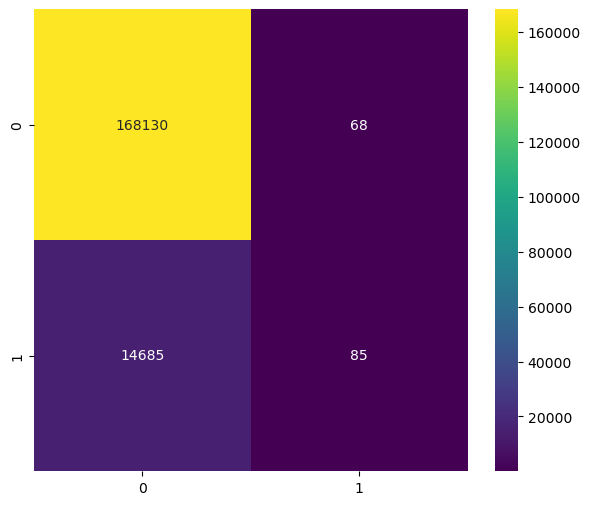

The Confusion Matrix for Validation Set


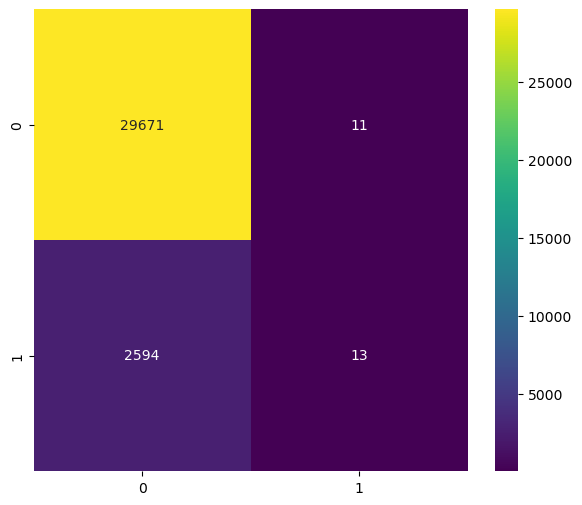

The Confusion Matrix for Test Set


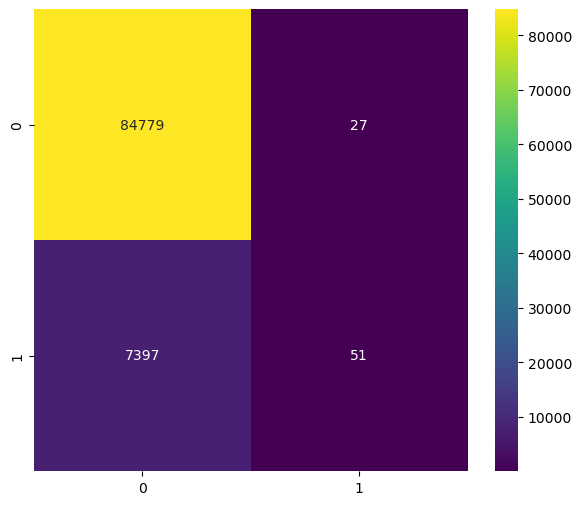

The AUC-ROC for Train Set


<Figure size 900x600 with 0 Axes>

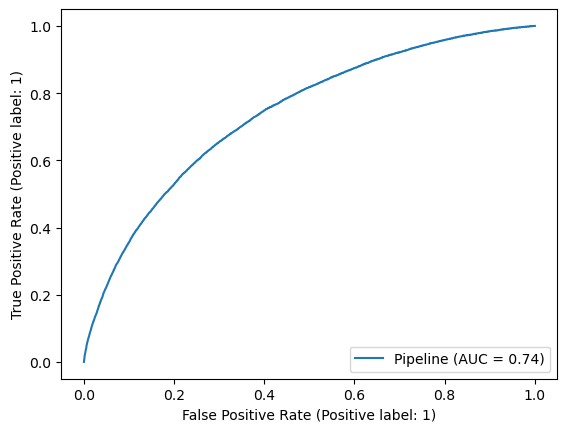

The AUC-ROC for Valid Set


<Figure size 900x600 with 0 Axes>

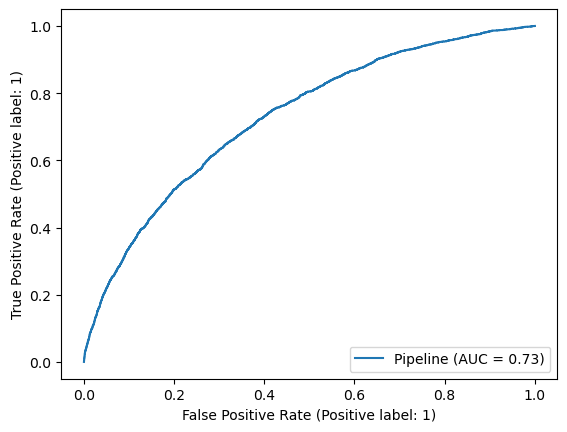

AUC-ROC for Test Set


<Figure size 1000x800 with 0 Axes>

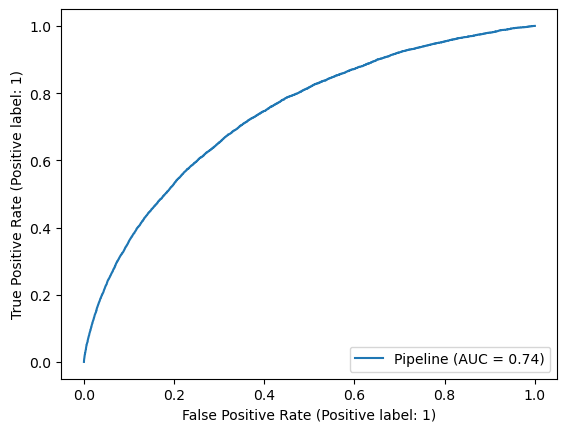

In [283]:
print('The Accuracy Score for Train Dataset:', np.round(accuracy_score(Y_Train, model.predict(X_Train)), 3))
print('The F1 Score for Train Dataset:', np.round(f1_score(Y_Train, model.predict(X_Train)), 3))
con_train = confusion_matrix(Y_Train, model.predict(X_Train))
con_val = confusion_matrix(Y_Valid, model.predict(X_Valid))
con_test = confusion_matrix(Y_Test, model.predict(X_Test))
plt.figure(figsize=(7,6))
print('The Confusion Matrix for Training Set')
sns.heatmap(con_train, annot=True, fmt='g',cmap='viridis')
plt.show()
plt.figure(figsize=(7,6))
print('The Confusion Matrix for Validation Set')
sns.heatmap(con_val, annot=True, fmt='g',cmap='viridis')
plt.show()
plt.figure(figsize=(7,6))
print('The Confusion Matrix for Test Set')
sns.heatmap(con_test, annot=True, fmt='g',cmap='viridis')
plt.show()
plt.figure(figsize=(9,6))
print('The AUC-ROC for Train Set')
plot_roc_curve(model, X_Train, Y_Train);
plt.show()
plt.figure(figsize=(9,6))
print('The AUC-ROC for Valid Set')
plot_roc_curve(model, X_Valid, Y_Valid);
plt.show()
plt.figure(figsize=(10,8))
print('AUC-ROC for Test Set')
plot_roc_curve(model, X_Test, Y_Test);
plt.show()

## Evaluation metrics
Submissions are evaluated on [area under the ROC curve](http://en.wikipedia.org/wiki/Receiver_operating_characteristic) between the predicted probability and the observed target.

The SkLearn `roc_auc_score` function computes the area under the receiver operating characteristic (ROC) curve, which is also denoted by AUC or AUROC. By computing the area under the roc curve, the curve information is summarized in one number. 

```python
from sklearn.metrics import roc_auc_score
>>> y_true = np.array([0, 0, 1, 1])
>>> y_scores = np.array([0.1, 0.4, 0.35, 0.8])
>>> roc_auc_score(y_true, y_scores)
0.75
```

In [242]:
#ROC auc score

In [284]:
from sklearn.metrics import roc_auc_score
roc_auc_score(Y_Train, model.predict_proba(X_Train)[:, 1])


0.7396777275658682

In [232]:
pip install xgboost

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 173.6 MB 131.1 MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [14]:
#importing requiered libarries
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
import time

In [234]:
expLog.shape[1]

14

### Running Ensemble and Non-ensemble methods

In [344]:
def evaluate_classifier(clf, X_train, y_train, X_valid, y_valid, X_test, y_test, expLog, data_prep_pipeline, selected_features):
    start_time = time.time()
    full_pipeline_with_predictor = Pipeline([
        ("preparation", data_prep_pipeline),
        ("model", clf)
    ])
    model_name = "Baseline {}".format(type(full_pipeline_with_predictor['model']).__name__)
    model = full_pipeline_with_predictor.fit(X_train, y_train)
    fit_time = time.time() - start_time
    print('Fit Time for {} is: {} seconds'.format(model_name, fit_time))
    exp_name = f"Baseline_{len(selected_features)}_features"
    expLog.loc[len(expLog)] = [f"{exp_name}"] + [model_name] + list(np.round(
                   [accuracy_score(y_train, model.predict(X_train)), 
                    accuracy_score(y_valid, model.predict(X_valid)),
                    accuracy_score(y_test, model.predict(X_test)),
                    roc_auc_score(y_train, model.predict_proba(X_train)[:, 1]),
                    roc_auc_score(y_valid, model.predict_proba(X_valid)[:, 1]),
                    roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]),
                    f1_score(y_train, model.predict(X_train)), 
                    f1_score(y_valid, model.predict(X_valid)),
                    f1_score(y_test, model.predict(X_test)),
                    fit_time], 4))
    cf_train = confusion_matrix(y_train, model.predict(X_train))
    cf_val = confusion_matrix(y_valid, model.predict(X_valid))
    cf_test = confusion_matrix(y_test, model.predict(X_test))
    plt.figure(figsize=(8,5))
    print('Confusion Matrix for Training Set')
    sns.heatmap(cf_train, annot=True, fmt='g')
    plt.show()
    plt.figure(figsize=(8,5))
    print('Confusion Matrix for Validation Set')
    sns.heatmap(cf_val, annot=True, fmt='g')
    plt.show()
    plt.figure(figsize=(8,5))
    print('Confusion Matrix for Test Set')
    sns.heatmap(cf_test, annot=True, fmt='g')
    plt.show()
    plt.figure(figsize=(10,8))
    print('AUC-ROC for Train Set')
    plot_roc_curve(model, X_train, y_train);
    plt.show()
    plt.figure(figsize=(10,8))
    print('AUC-ROC for Valid Set')
    plot_roc_curve(model, X_valid, y_valid);
    plt.show()
    plt.figure(figsize=(10,8))
    print('AUC-ROC for Test Set')
    plot_roc_curve(model, X_test, y_test);
    plt.show()

### Non-Ensemble Methods

Fit Time for Baseline LogisticRegression is: 35.66123914718628 seconds
Confusion Matrix for Training Set


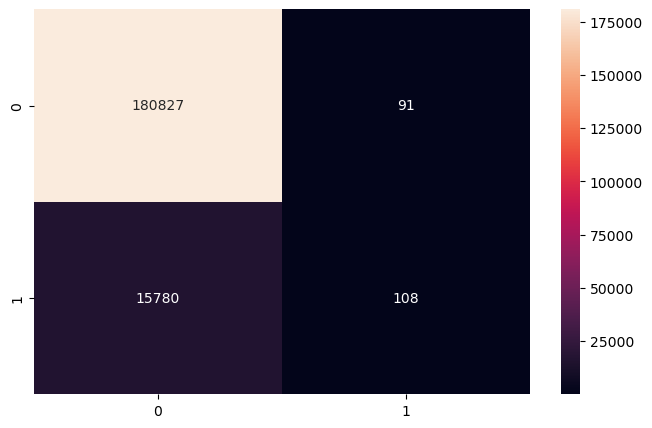

Confusion Matrix for Validation Set


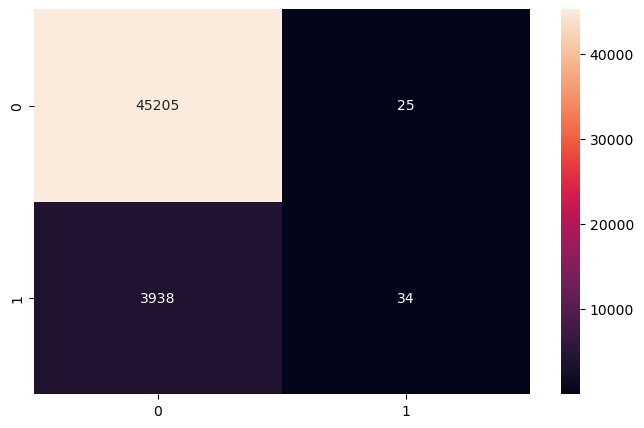

Confusion Matrix for Test Set


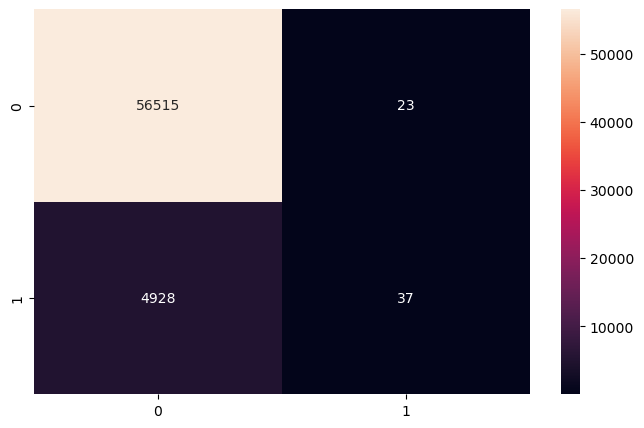

AUC-ROC for Train Set


<Figure size 1000x800 with 0 Axes>

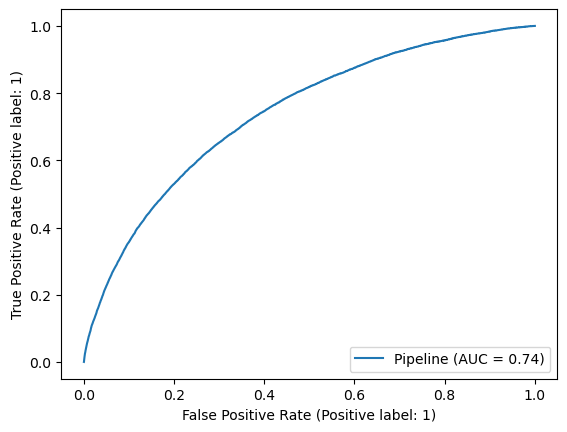

AUC-ROC for Valid Set


<Figure size 1000x800 with 0 Axes>

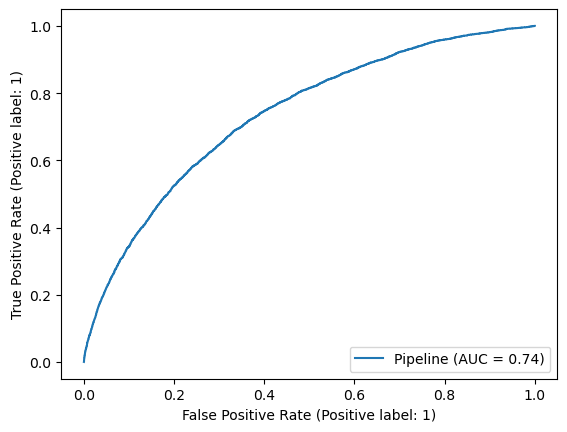

AUC-ROC for Test Set


<Figure size 1000x800 with 0 Axes>

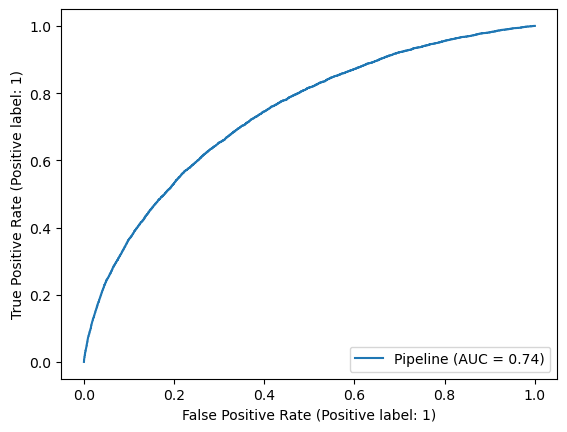

Fit Time for Baseline LogisticRegression is: 28.722261905670166 seconds
Confusion Matrix for Training Set


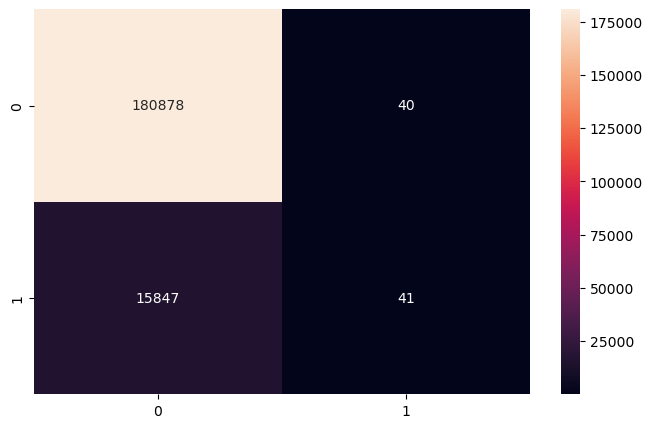

Confusion Matrix for Validation Set


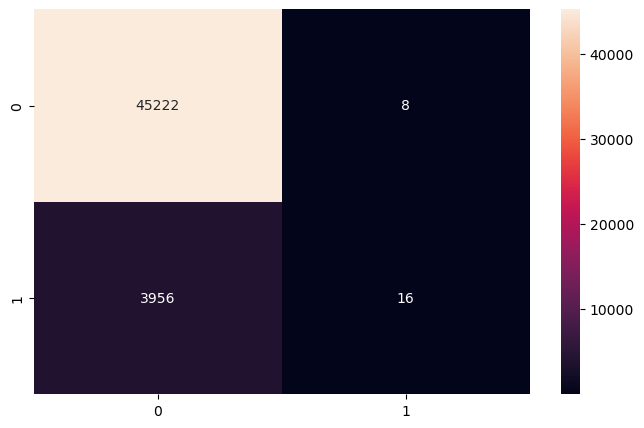

Confusion Matrix for Test Set


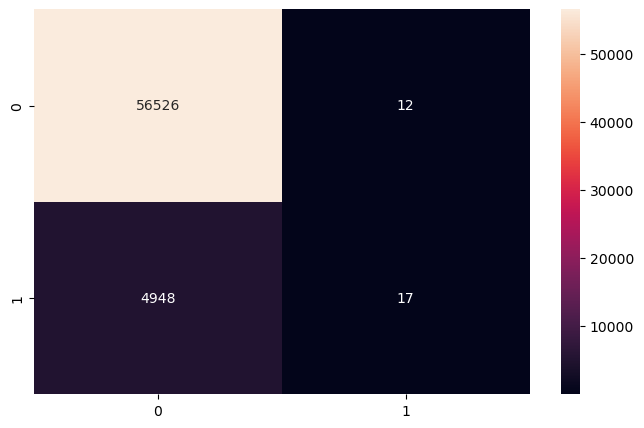

AUC-ROC for Train Set


<Figure size 1000x800 with 0 Axes>

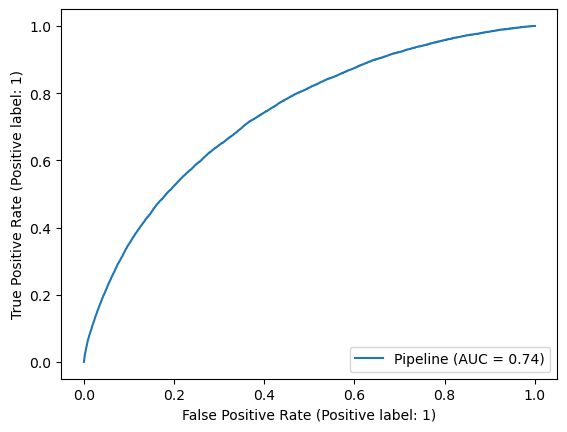

AUC-ROC for Valid Set


<Figure size 1000x800 with 0 Axes>

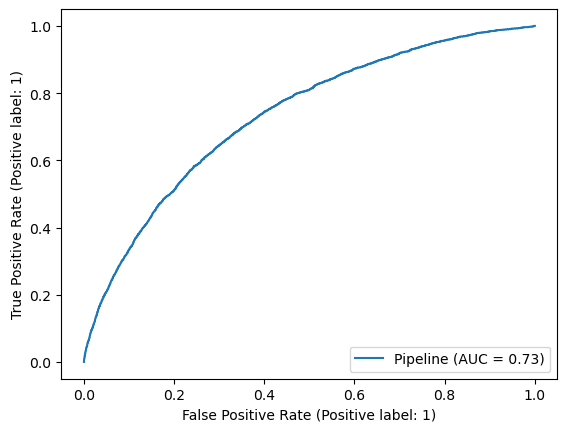

AUC-ROC for Test Set


<Figure size 1000x800 with 0 Axes>

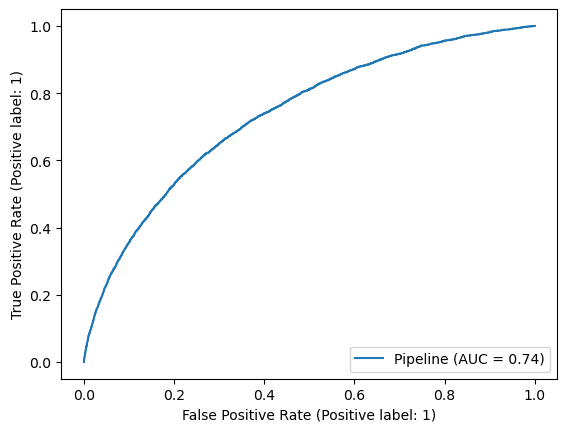

Fit Time for Baseline DecisionTreeClassifier is: 37.864579916000366 seconds
Confusion Matrix for Training Set


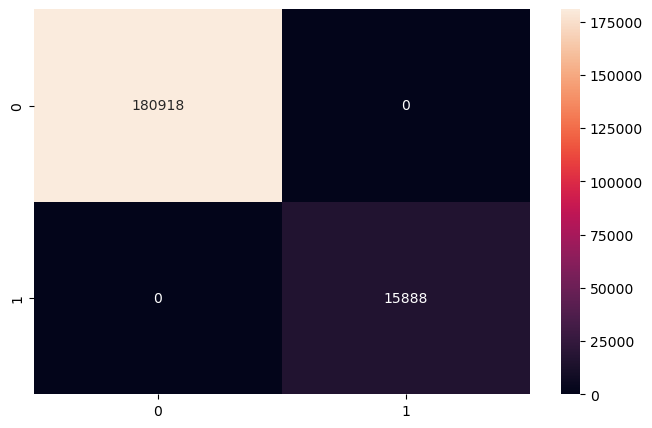

Confusion Matrix for Validation Set


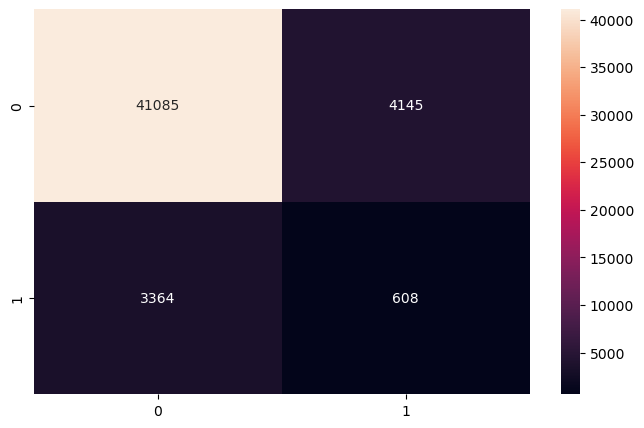

Confusion Matrix for Test Set


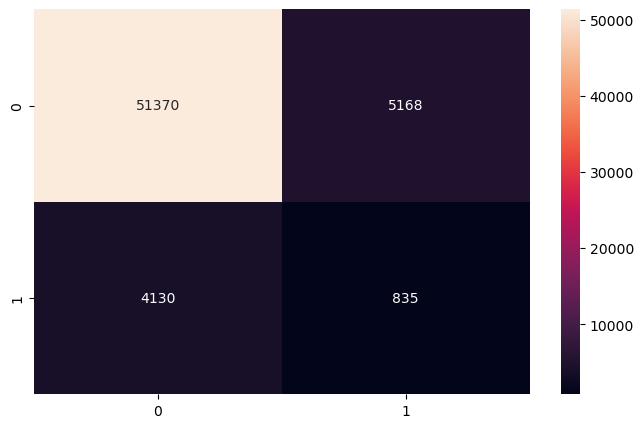

AUC-ROC for Train Set


<Figure size 1000x800 with 0 Axes>

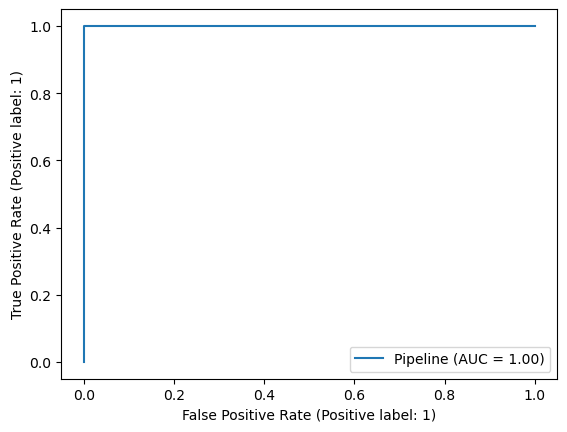

AUC-ROC for Valid Set


<Figure size 1000x800 with 0 Axes>

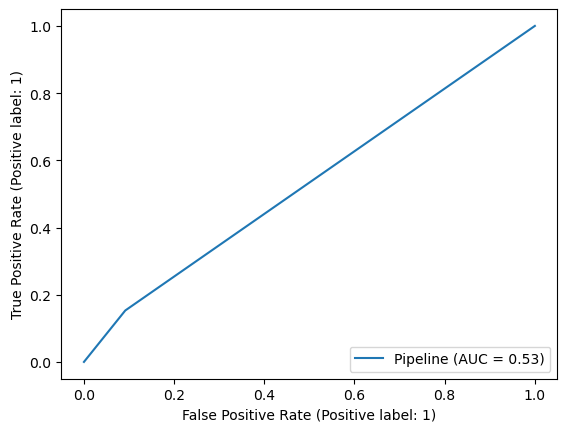

AUC-ROC for Test Set


<Figure size 1000x800 with 0 Axes>

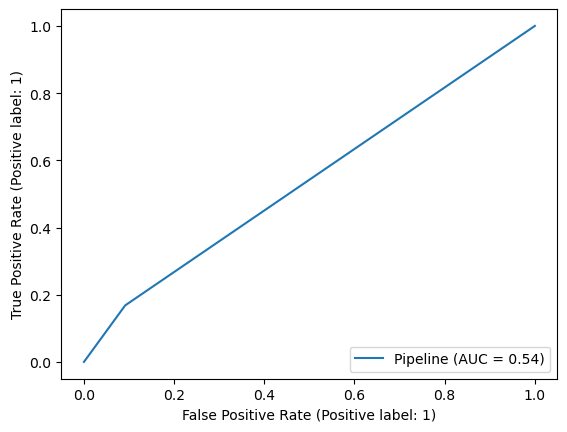

Fit Time for Baseline GaussianNB is: 4.6043219566345215 seconds
Confusion Matrix for Training Set


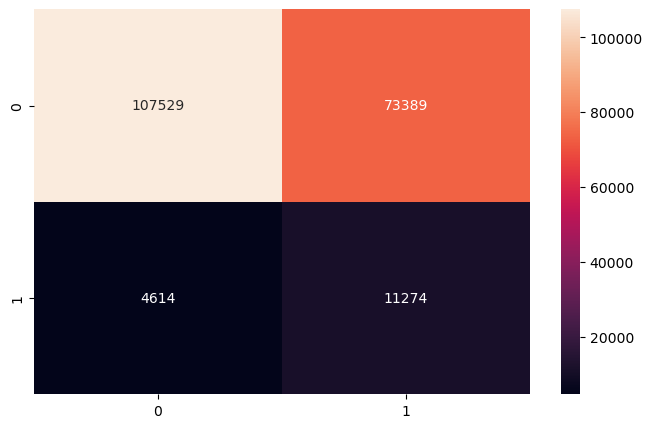

Confusion Matrix for Validation Set


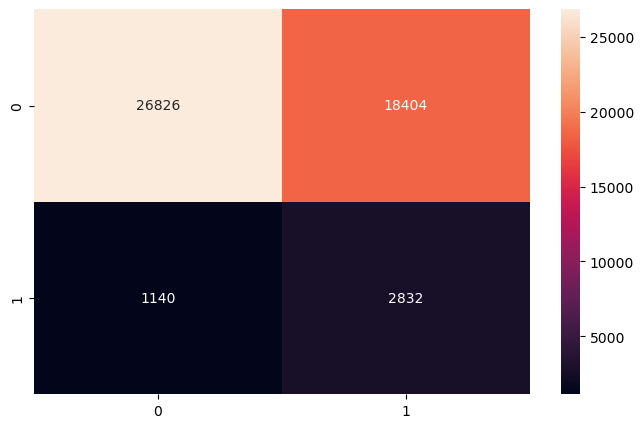

Confusion Matrix for Test Set


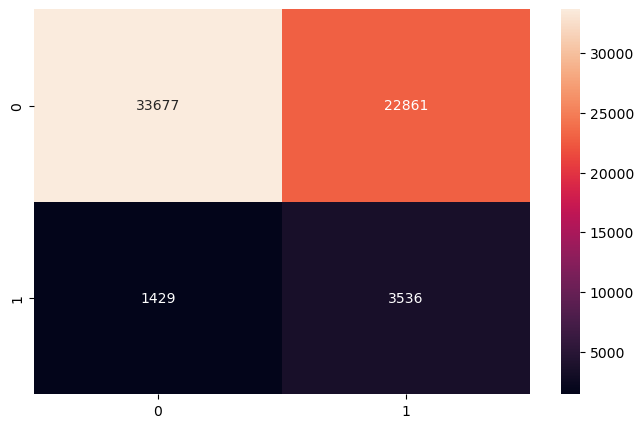

AUC-ROC for Train Set


<Figure size 1000x800 with 0 Axes>

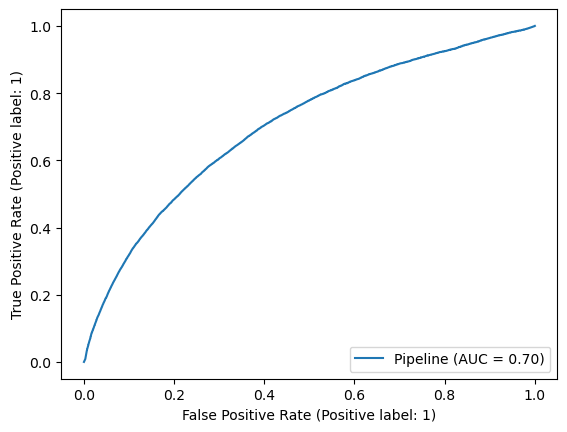

AUC-ROC for Valid Set


<Figure size 1000x800 with 0 Axes>

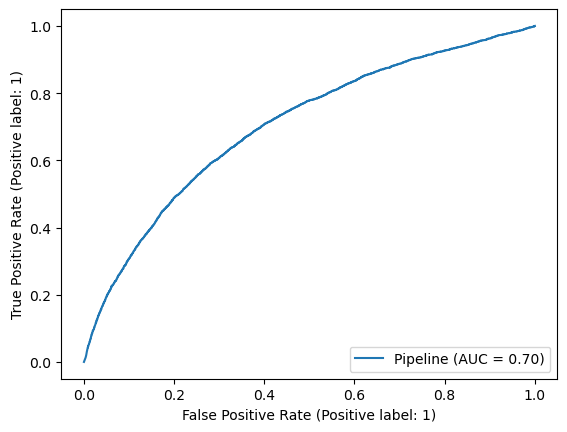

AUC-ROC for Test Set


<Figure size 1000x800 with 0 Axes>

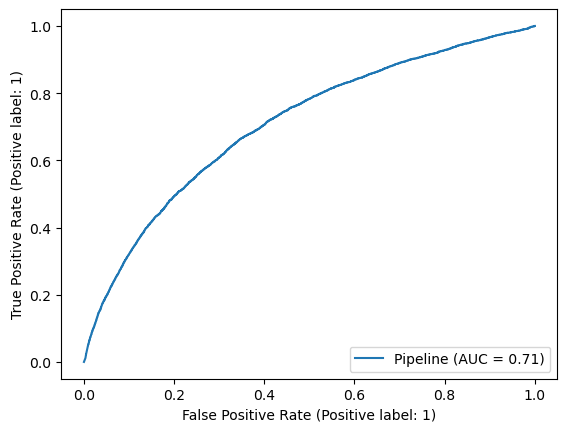

In [347]:
non_ensemble_clfs = [LogisticRegression(solver='liblinear'),LogisticRegression(solver='saga'),
        DecisionTreeClassifier(),
        GaussianNB()]

for clf in non_ensemble_clfs:
    evaluate_classifier(clf, X_Train, Y_Train, X_Valid, Y_Valid, X_Test, Y_Test, expLog, data_prep_pipeline, selected_features)

### Ensemble Methods

Fit Time for Baseline RandomForestClassifier is: 179.83224391937256 seconds
Confusion Matrix for Training Set


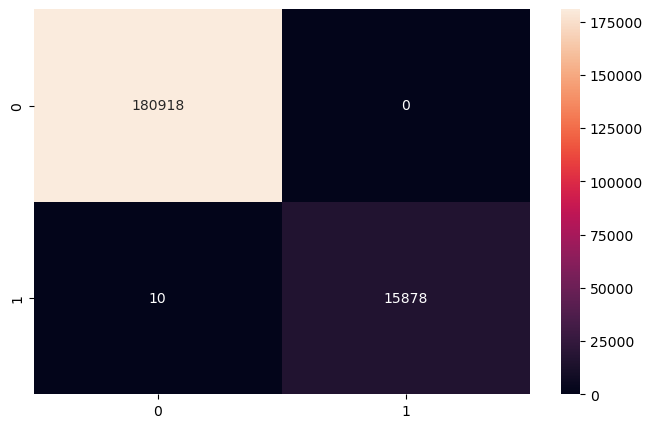

Confusion Matrix for Validation Set


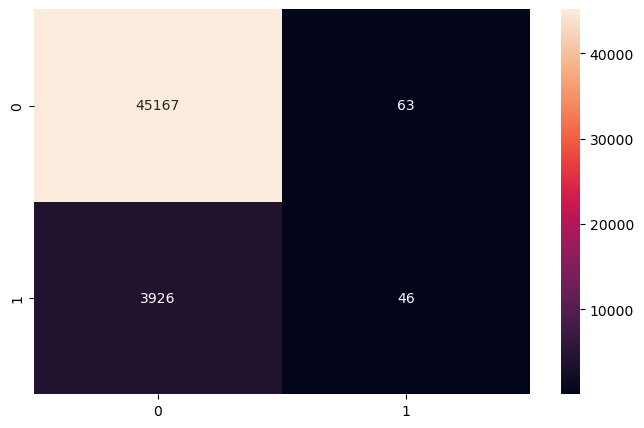

Confusion Matrix for Test Set


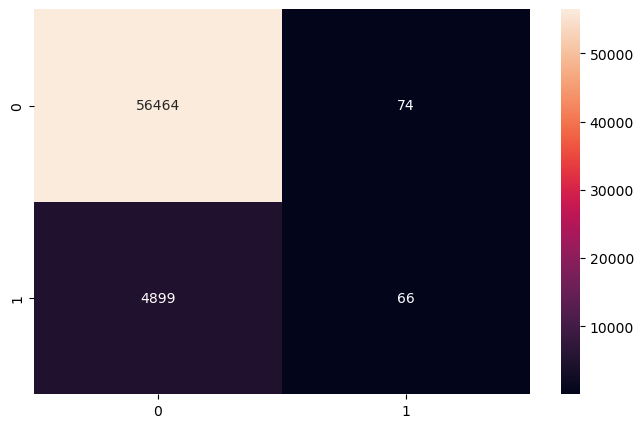

AUC-ROC for Train Set


<Figure size 1000x800 with 0 Axes>

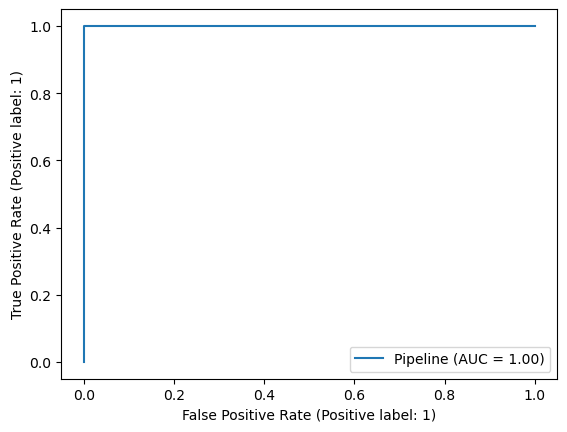

AUC-ROC for Valid Set


<Figure size 1000x800 with 0 Axes>

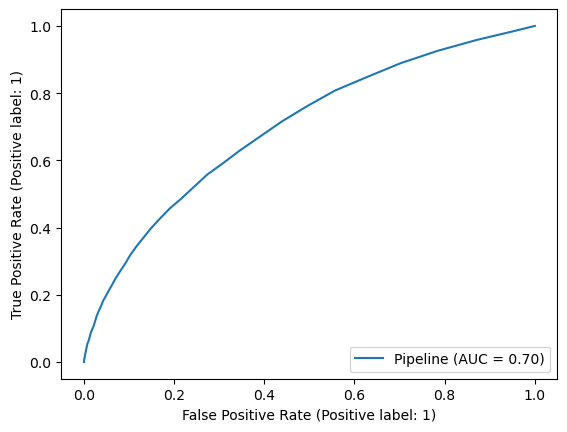

AUC-ROC for Test Set


<Figure size 1000x800 with 0 Axes>

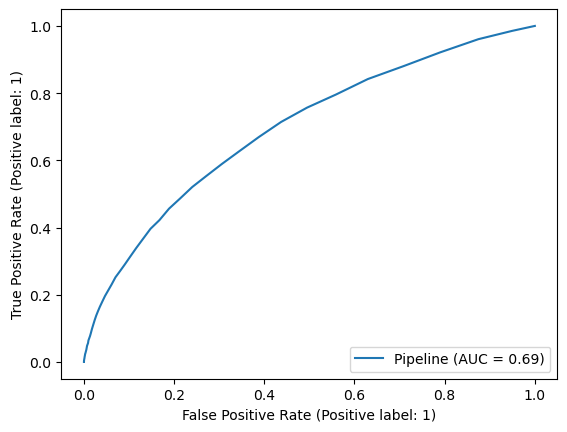

Fit Time for Baseline XGBClassifier is: 59.894498109817505 seconds
Confusion Matrix for Training Set


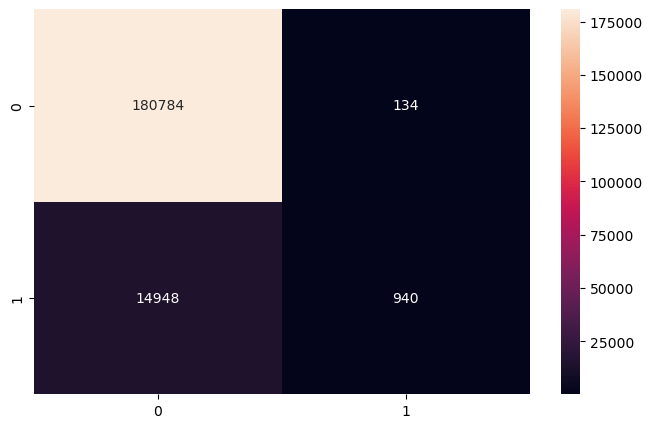

Confusion Matrix for Validation Set


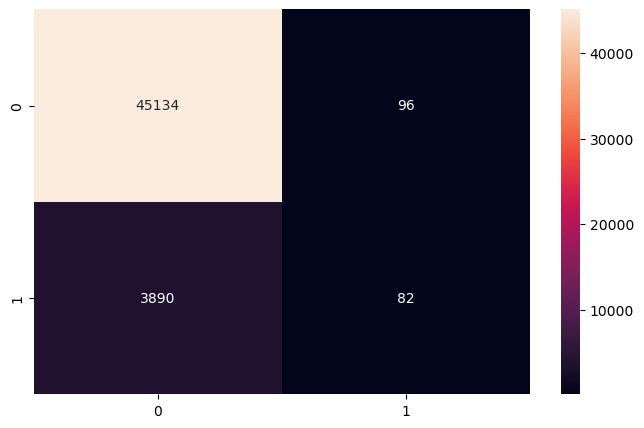

Confusion Matrix for Test Set


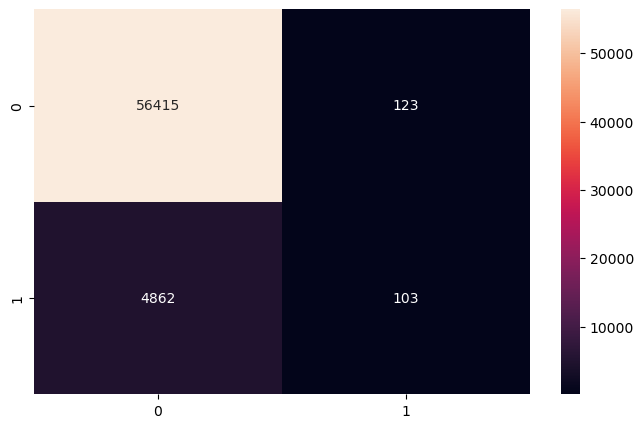

AUC-ROC for Train Set


<Figure size 1000x800 with 0 Axes>

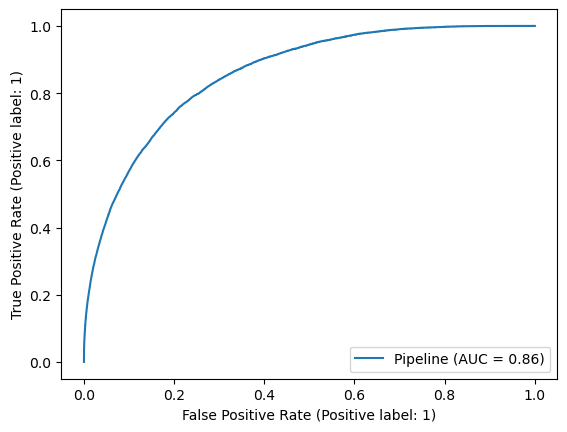

AUC-ROC for Valid Set


<Figure size 1000x800 with 0 Axes>

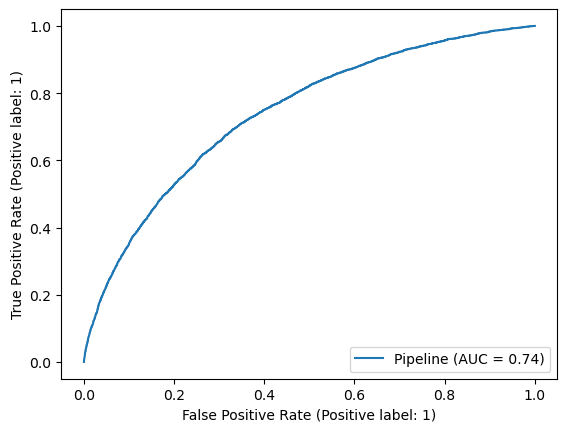

AUC-ROC for Test Set


<Figure size 1000x800 with 0 Axes>

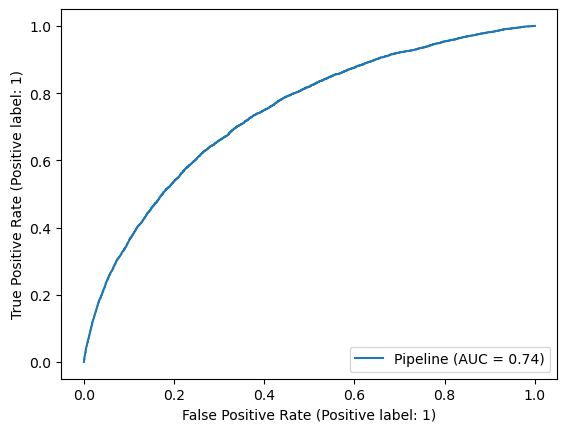

Fit Time for Baseline AdaBoostClassifier is: 77.43952894210815 seconds
Confusion Matrix for Training Set


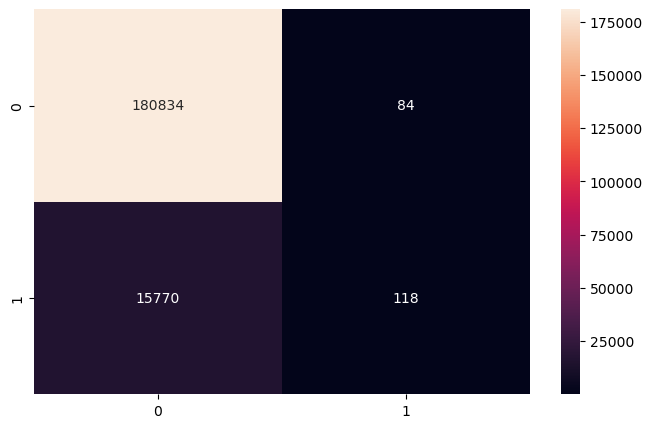

Confusion Matrix for Validation Set


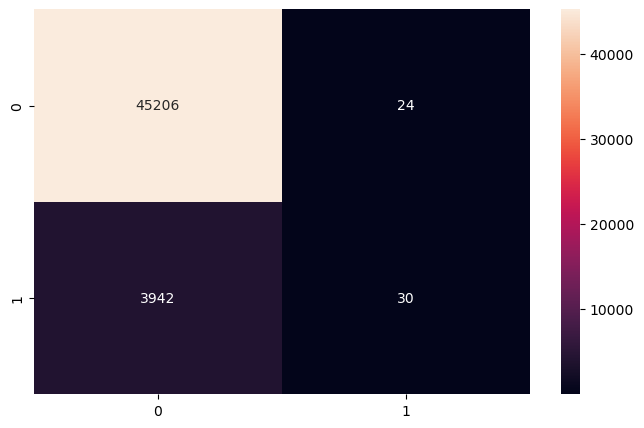

Confusion Matrix for Test Set


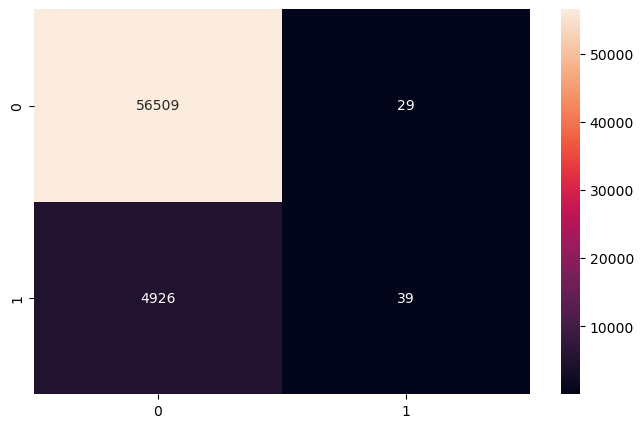

AUC-ROC for Train Set


<Figure size 1000x800 with 0 Axes>

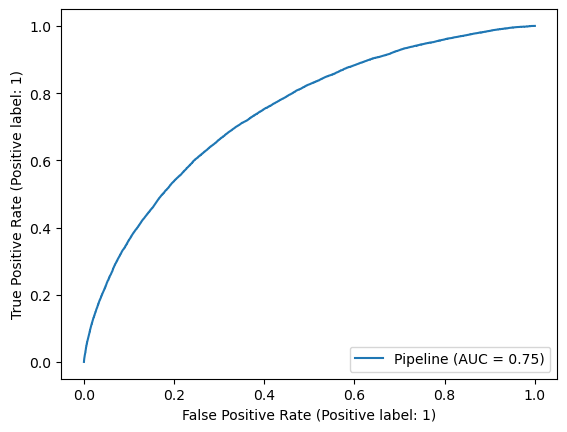

AUC-ROC for Valid Set


<Figure size 1000x800 with 0 Axes>

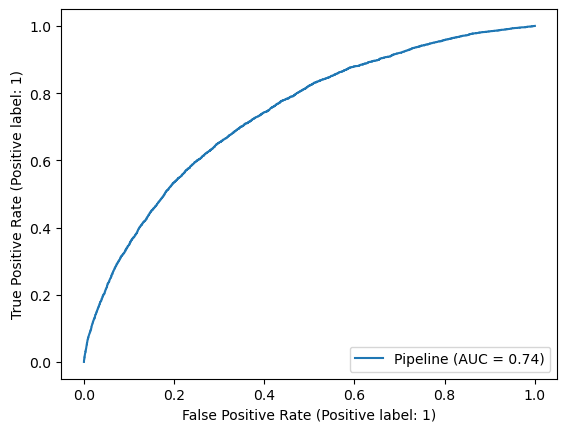

AUC-ROC for Test Set


<Figure size 1000x800 with 0 Axes>

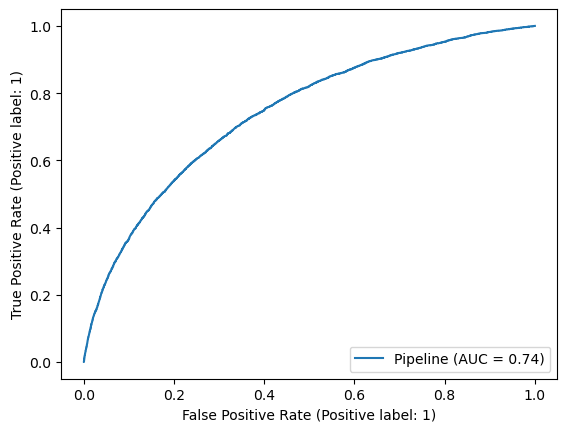

Fit Time for Baseline GradientBoostingClassifier is: 403.8157448768616 seconds
Confusion Matrix for Training Set


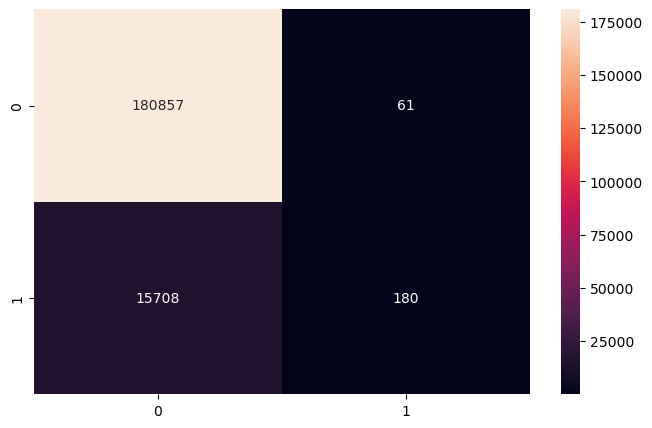

Confusion Matrix for Validation Set


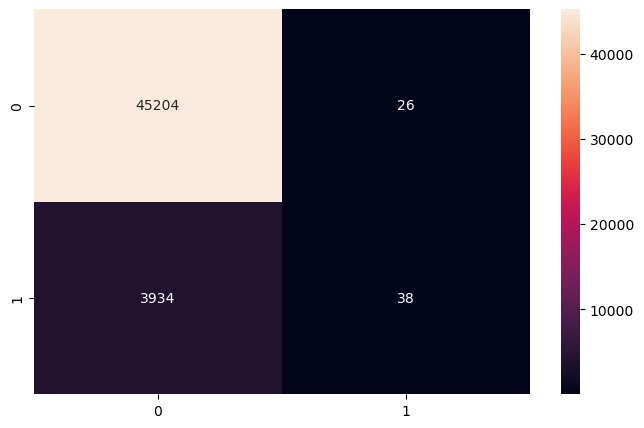

Confusion Matrix for Test Set


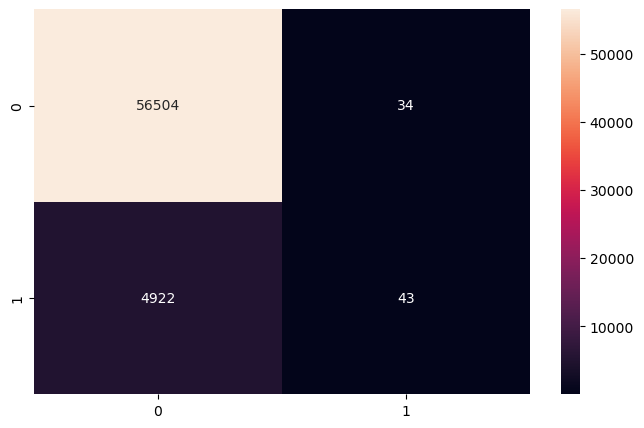

AUC-ROC for Train Set


<Figure size 1000x800 with 0 Axes>

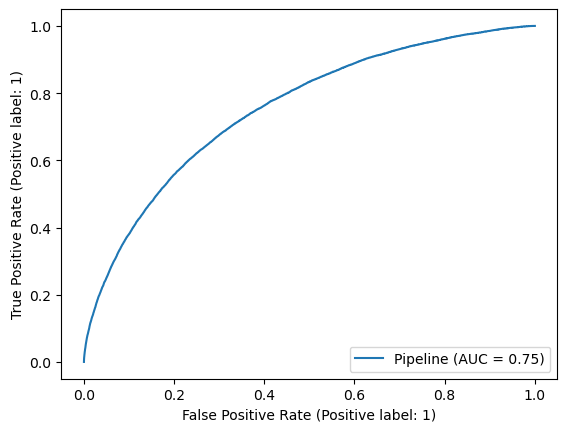

AUC-ROC for Valid Set


<Figure size 1000x800 with 0 Axes>

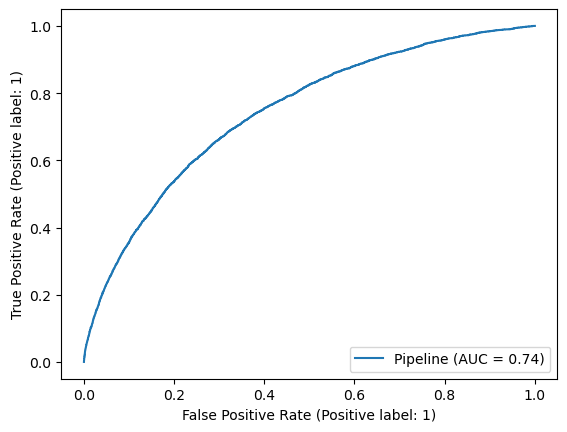

AUC-ROC for Test Set


<Figure size 1000x800 with 0 Axes>

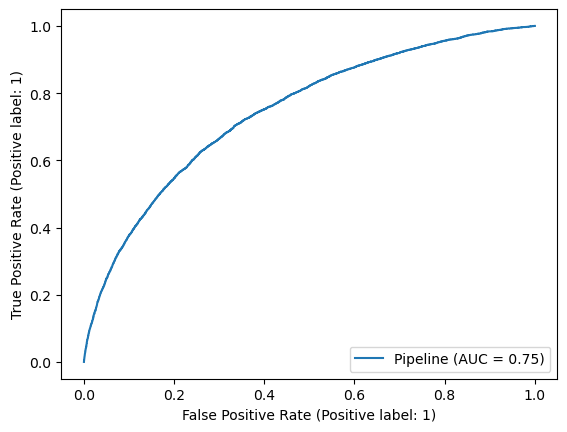

In [348]:

ensemble_clfs = [RandomForestClassifier(), XGBClassifier(),AdaBoostClassifier(), GradientBoostingClassifier()]
for clf in ensemble_clfs:
    evaluate_classifier(clf, X_Train, Y_Train, X_Valid, Y_Valid, X_Test, Y_Test, expLog, data_prep_pipeline, selected_features)

Fit Time for Baseline KNeighborsClassifier is: 0.5721931457519531 seconds
Confusion Matrix for Training Set


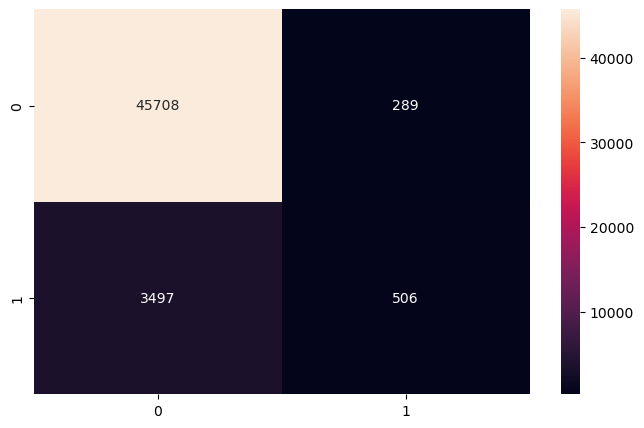

Confusion Matrix for Validation Set


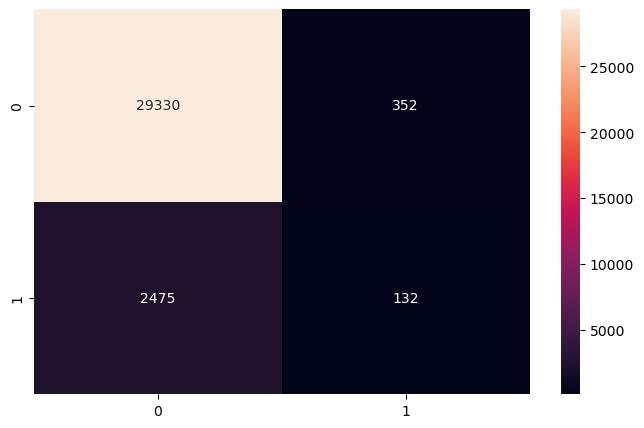

Confusion Matrix for Test Set


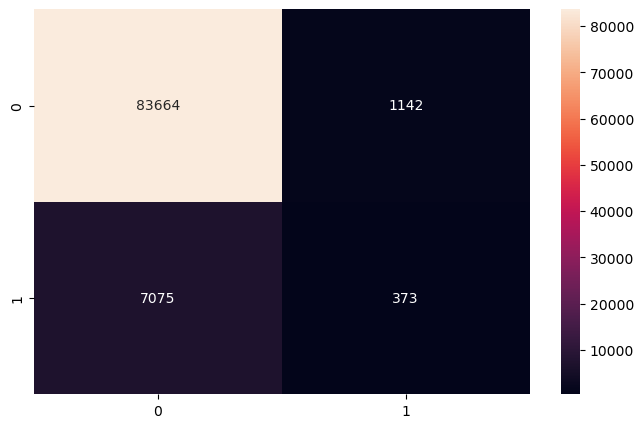

AUC-ROC for Train Set


<Figure size 1000x800 with 0 Axes>

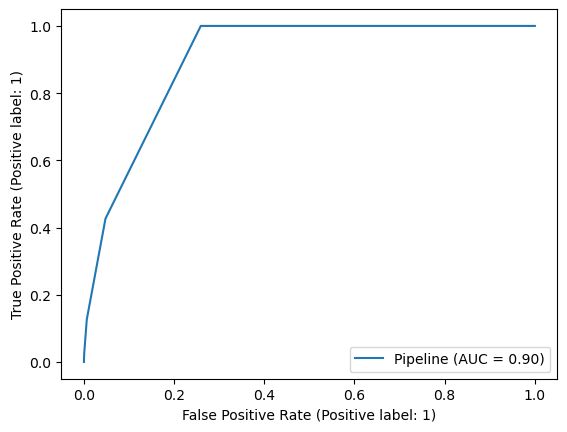

AUC-ROC for Valid Set


<Figure size 1000x800 with 0 Axes>

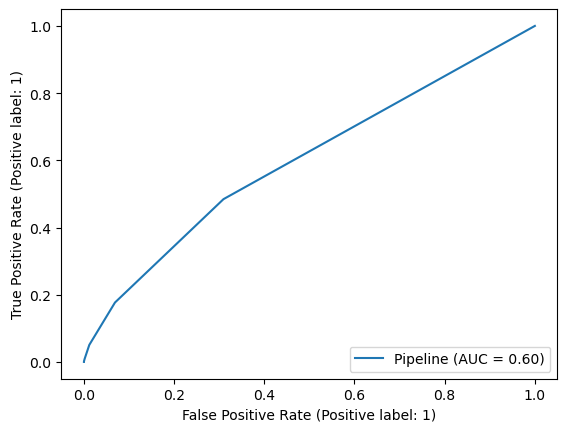

AUC-ROC for Test Set


<Figure size 1000x800 with 0 Axes>

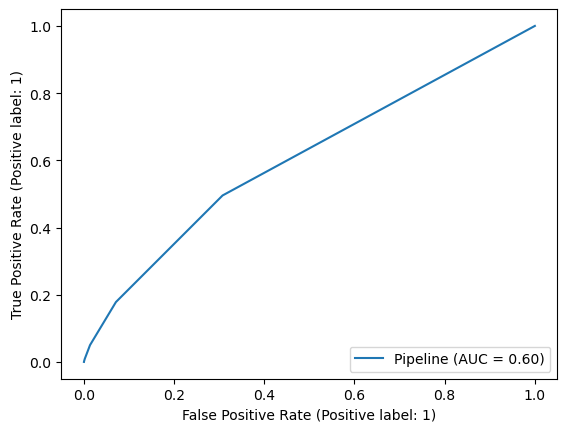

In [14]:
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
other_CLFs = [SVC(probability=True), KNeighborsClassifier()]
for clf in other_CLFs:
    evaluate_classifier(clf, X_Train, Y_Train, X_Valid, Y_Valid, X_Test, Y_Test, expLog, data_prep_pipeline, selected_features)

Fit Time for Baseline AdaBoostClassifier is: 71.9937117099762 seconds
Confusion Matrix for Training Set


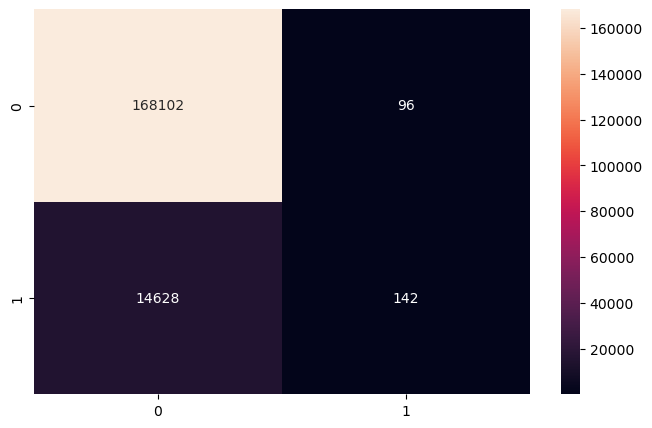

Confusion Matrix for Validation Set


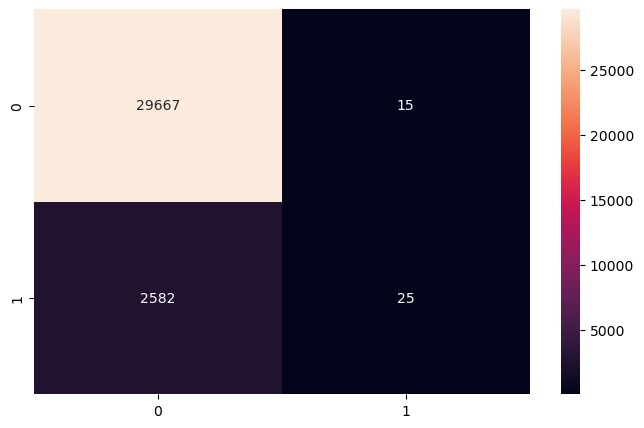

Confusion Matrix for Test Set


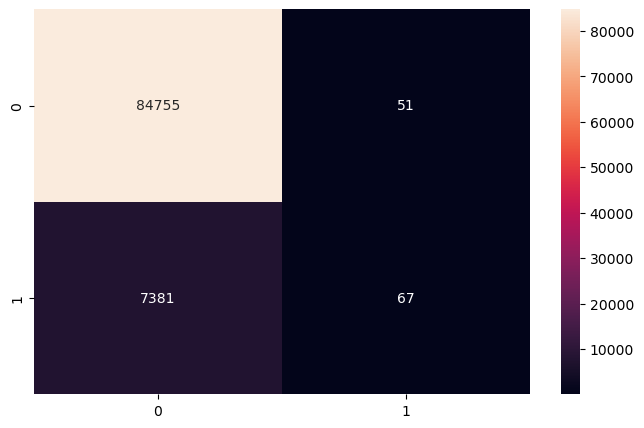

AUC-ROC for Train Set


<Figure size 1000x800 with 0 Axes>

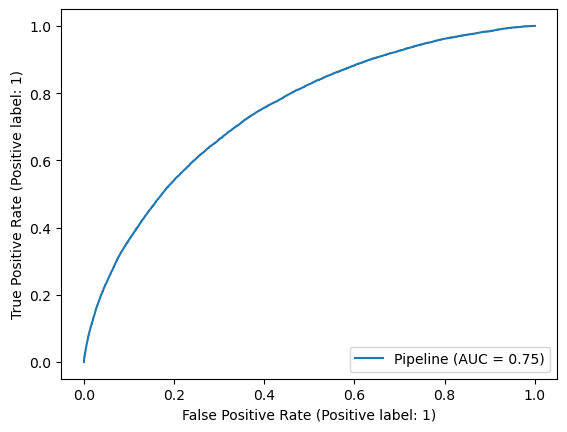

AUC-ROC for Valid Set


<Figure size 1000x800 with 0 Axes>

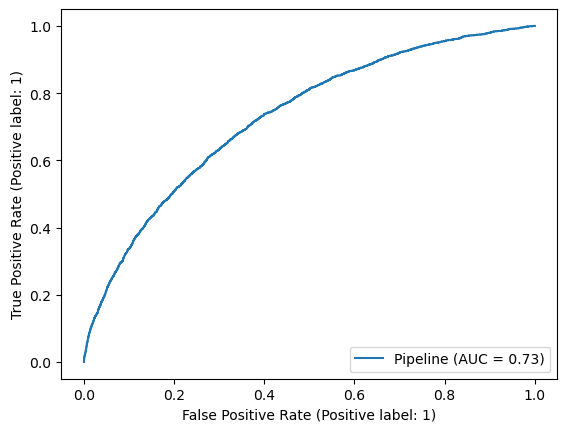

AUC-ROC for Test Set


<Figure size 1000x800 with 0 Axes>

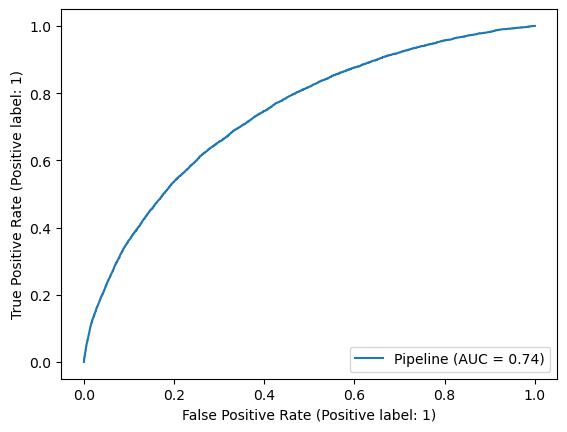

Fit Time for Baseline GradientBoostingClassifier is: 375.4438621997833 seconds
Confusion Matrix for Training Set


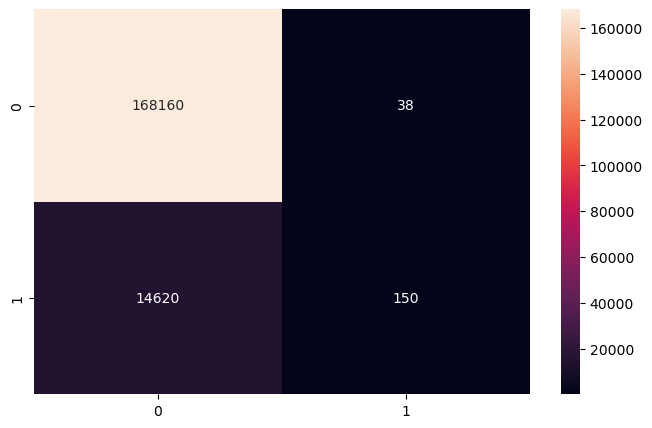

Confusion Matrix for Validation Set


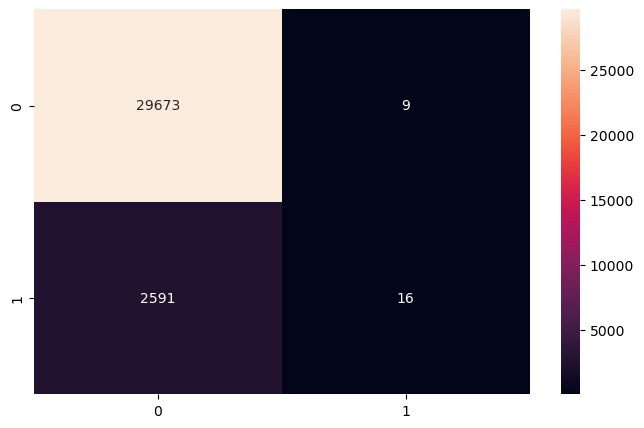

Confusion Matrix for Test Set


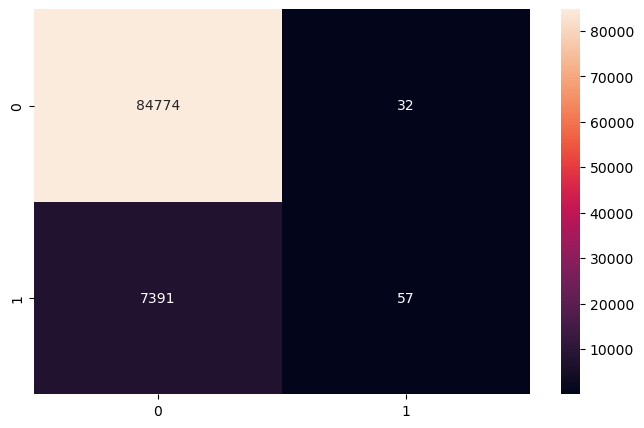

AUC-ROC for Train Set


<Figure size 1000x800 with 0 Axes>

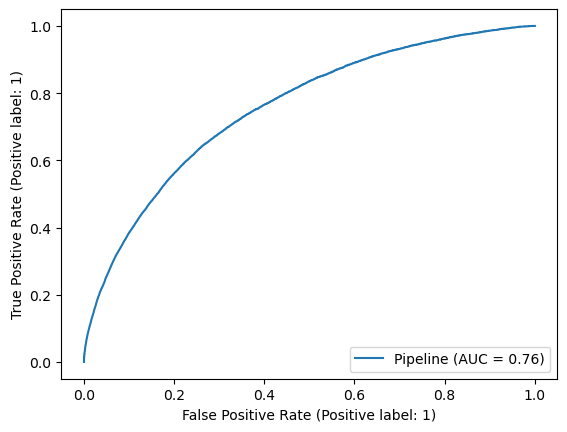

AUC-ROC for Valid Set


<Figure size 1000x800 with 0 Axes>

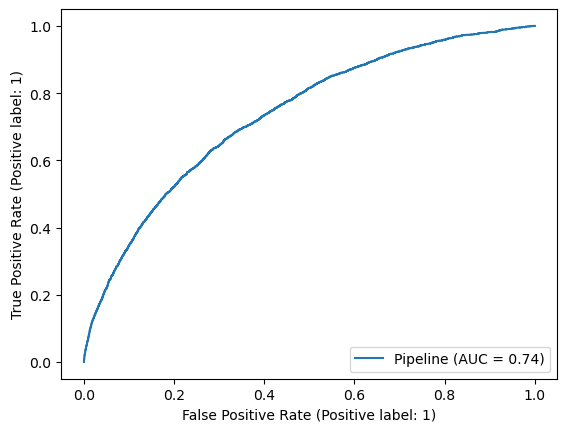

AUC-ROC for Test Set


<Figure size 1000x800 with 0 Axes>

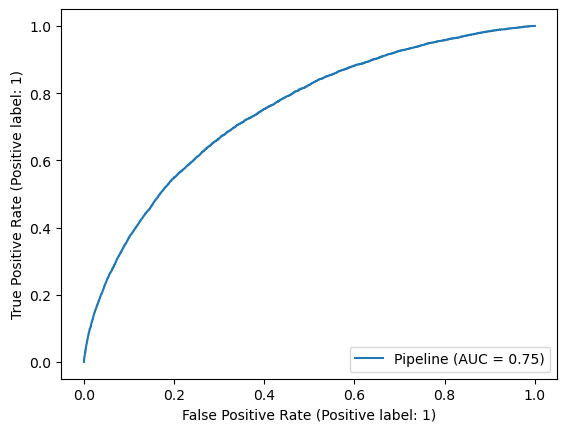

In [291]:
other_CLFs = [AdaBoostClassifier(), GradientBoostingClassifier()]
for clf in other_CLFs:
    evaluate_classifier(clf, X_Train, Y_Train, X_Valid, Y_Valid, X_Test, Y_Test, expLog, data_prep_pipeline, selected_features)

In [349]:
expLog

,exp_name,Model name,Train Acc,Valid Acc,Test Acc,Train AUC,Valid AUC,Test AUC,Train F1,Valid F1,Test F1,Fit Time
0,Baseline_104_features,Baseline LogisticRegression,0.9194,0.9195,0.9195,0.7400,0.7362,0.7397,0.0134,0.0169,0.0147,35.6612
1,Baseline_104_features,Baseline LogisticRegression,0.9193,0.9194,0.9194,0.7369,0.7330,0.7367,0.0051,0.0080,0.0068,28.7223
2,Baseline_104_features,Baseline DecisionTreeClassifier,1.0000,0.8474,0.8488,1.0000,0.5307,0.5384,1.0000,0.1394,0.1523,37.8646
3,Baseline_104_features,Baseline GaussianNB,0.6037,0.6028,0.6051,0.7043,0.7037,0.7077,0.2242,0.2247,0.2255,4.6043
4,Baseline_104_features,Baseline RandomForestClassifier,0.9999,0.9189,0.9191,1.0000,0.6973,0.6945,0.9997,0.0225,0.0259,179.8322
5,Baseline_104_features,Baseline XGBClassifier,0.9234,0.9190,0.9189,0.8587,0.7399,0.7420,0.1108,0.0395,0.0397,59.8945
6,Baseline_104_features,Baseline AdaBoostClassifier,0.9194,0.9194,0.9194,0.7452,0.7392,0.7431,0.0147,0.0149,0.0155,77.4395
7,Baseline_104_features,Baseline GradientBoostingClassifier,0.9199,0.9195,0.9194,0.7541,0.7438,0.7460,0.0223,0.0188,0.0171,403.8157


In [306]:
expLog.columns

Index(['exp_name', 'Model name', 'Train Acc', 'Valid Acc', 'Test  Acc',
       'Train AUC', 'Valid AUC', 'Test  AUC', 'Train F1', 'Valid F1',
       'Test F1', 'Fit Time'],
      dtype='object')

In [350]:
expLog_sorted = expLog.sort_values(by='Test  AUC', ascending=False)

# Print the sorted F1 scores
print("AUC scores sorted in descending order:")
print(expLog_sorted['Model name']," \t AUC:",expLog_sorted['Test  AUC'])

AUC scores sorted in descending order:
7    Baseline GradientBoostingClassifier
6            Baseline AdaBoostClassifier
5                 Baseline XGBClassifier
0            Baseline LogisticRegression
1            Baseline LogisticRegression
3                    Baseline GaussianNB
4        Baseline RandomForestClassifier
2        Baseline DecisionTreeClassifier
Name: Model name, dtype: object  	 AUC: 7    0.7460
6    0.7431
5    0.7420
0    0.7397
1    0.7367
3    0.7077
4    0.6945
2    0.5384
Name: Test  AUC, dtype: float64


In [351]:
expLog_sorted = expLog.sort_values(by='Test  Acc', ascending=False)

# Print the sorted F1 scores
print("Test Accuracy scores sorted in descending order:")
print(expLog_sorted['Model name'])

Test Accuracy scores sorted in descending order:
0            Baseline LogisticRegression
1            Baseline LogisticRegression
6            Baseline AdaBoostClassifier
7    Baseline GradientBoostingClassifier
4        Baseline RandomForestClassifier
5                 Baseline XGBClassifier
2        Baseline DecisionTreeClassifier
3                    Baseline GaussianNB
Name: Model name, dtype: object


In [352]:
expLog_sorted = expLog.sort_values(by='Test F1', ascending=False)

# Print the sorted F1 scores
print("Test F1 scores sorted in descending order:")
print(expLog_sorted['Model name'])

Test F1 scores sorted in descending order:
3                    Baseline GaussianNB
2        Baseline DecisionTreeClassifier
5                 Baseline XGBClassifier
4        Baseline RandomForestClassifier
7    Baseline GradientBoostingClassifier
6            Baseline AdaBoostClassifier
0            Baseline LogisticRegression
1            Baseline LogisticRegression
Name: Model name, dtype: object


In [ ]:
### Hyper-Parameter Tunning using Random SearchCV

In [26]:
X_Train.isna()

,AMT_INCOME_TOTAL,AMT_CREDIT,EXT_SOURCE_3_x,EXT_SOURCE_2_x,EXT_SOURCE_1_x,EXT_SOURCE_3_y,EXT_SOURCE_2_y,EXT_SOURCE_1_y,DAYS_EMPLOYED,FLOORSMAX_AVG,...,EXT_SOURCE_2 EXT_SOURCE_3 DAYS_BIRTH,EXT_SOURCE_2 DAYS_BIRTH^2,EXT_SOURCE_3^3,EXT_SOURCE_3^2 DAYS_BIRTH,EXT_SOURCE_3 DAYS_BIRTH^2,DAYS_BIRTH^3,FLAG_OWN_REALTY,FLAG_OWN_CAR,NAME_CONTRACT_TYPE,FLAG_OWN_CAR.1
0,False,False,True,False,True,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,True,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
2,False,False,True,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,True,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
182963,False,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
182964,False,False,True,False,True,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
182965,False,False,True,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
182966,False,False,False,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False


In [32]:
Y_Train.isna()

,TARGET
0,False
1,False
2,False
3,False
4,False
...,...
182963,False
182964,False
182965,False
182966,False


In [3]:
sub_x_train = X_Train
sub_y_train = Y_Train

In [4]:
X_Train.shape[0]

196806

In [48]:
sub_x_train_sampled, sub_x_train_unused, sub_y_train_sampled, sub_y_train_unused = train_test_split(sub_x_train, sub_y_train, test_size=186806, stratify=sub_y_train, shuffle=True, random_state=42)

In [49]:
sub_x_train_sampled.shape

(10000, 104)

In [50]:
sub_y_train_sampled.shape

(10000, 1)

In [51]:
clf_pipe = Pipeline([("preparation", data_prep_pipeline),
                     ("classifier", None)]) # Placeholder Estimator

parameters = [
    {'classifier__n_iter_no_change': [5], 'classifier__n_estimators': [100,200,300], 'classifier__min_samples_leaf': [2,5,10], 'classifier__max_depth': [3,5,7], 'classifier__subsample': [0.6,0.8,1], 'classifier': [GradientBoostingClassifier()]},
    {'classifier__n_estimators': [100,200,300], 'classifier__max_depth': [5,7,10], 'classifier__subsample': [0.6,0.8,1], 'classifier__colsample_bytree': [0.5,0.75,1], 'classifier__eval_metric': ['logloss'], 'classifier': [XGBClassifier(enable_categorical=False)]},
    {'classifier__penalty':['l1','l2','elasticnet'], 'classifier__solver': ['saga'], 'classifier__C':[1,10], 'classifier__n_jobs': [-1], 'classifier': [LogisticRegression()]},
    {'classifier__penalty':['l1','l2','elasticnet'], 'classifier__solver': ['liblinear'], 'classifier__C':[1,10], 'classifier__n_jobs': [-1], 'classifier': [LogisticRegression()]},
    {'classifier__n_estimators': [100,200,300], 'classifier__max_depth': [5,7,10, None], 'classifier__min_samples_leaf': [2,5,10], 'classifier__n_jobs': [-1], 'classifier': [RandomForestClassifier()]},
    {'classifier__max_depth': [5,7,10, None], 'classifier__min_samples_leaf': [2,5,10], 'classifier': [DecisionTreeClassifier()]},
    {'classifier__n_estimators': [50, 100, 200],'classifier__learning_rate': [0.1, 0.5, 1], 'classifier__algorithm': ['SAMME', 'SAMME.R'],'classifier': [AdaBoostClassifier()]}
]

start_time = time.time()
clf_gridsearch = GridSearchCV(clf_pipe, param_grid = parameters, cv = 5, scoring='roc_auc', n_jobs=-1, verbose=1)
clf_gridsearch.fit(sub_x_train_sampled, sub_y_train_sampled)
end_time = time.time() - start_time

Fitting 5 folds for each of 240 candidates, totalling 1200 fits


/Users/bhavyamistry/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/bhavyamistry/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/bhavyamistry/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/bhavyamistry/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array w

In [52]:
print(clf_gridsearch.best_params_)
print(clf_gridsearch.best_score_)

best_params = clf_gridsearch.best_params_
best_estimator = clf_gridsearch.best_estimator_

# Fit the best estimator to the validation data
best_estimator.fit(X_Train, Y_Train)

# Predict probabilities of positive class for validation data
y_prob = best_estimator.predict_proba(X_Valid)[:, 1]

# Calculate ROC AUC score
roc_auc = roc_auc_score(Y_Valid, y_prob)

# Print the ROC AUC score
print("ROC AUC score:", roc_auc)


{'classifier': AdaBoostClassifier(learning_rate=0.1), 'classifier__algorithm': 'SAMME.R', 'classifier__learning_rate': 0.1, 'classifier__n_estimators': 50}
0.7168818656043617
ROC AUC score: 0.7238302681004485


In [53]:
results = pd.DataFrame(clf_gridsearch.cv_results_)
top = results.sort_values(by='rank_test_score')

In [54]:
top[['param_classifier', 'rank_test_score']].head(15)

,param_classifier,rank_test_score
231,AdaBoostClassifier(learning_rate=0.1),1
232,AdaBoostClassifier(learning_rate=0.1),2
171,LogisticRegression(),3
172,LogisticRegression(),4
227,AdaBoostClassifier(learning_rate=0.1),5
169,LogisticRegression(),6
168,LogisticRegression(),7
226,AdaBoostClassifier(learning_rate=0.1),8
224,AdaBoostClassifier(learning_rate=0.1),9
14,GradientBoostingClassifier(),10


In [55]:
end_time

2352.8026456832886

### Random Search

In [56]:
start_time = time.time()
clf_randomsearch = RandomizedSearchCV(clf_pipe, param_distributions = parameters, cv = 5, scoring='accuracy', n_jobs=-1,verbose=1)
clf_randomsearch.fit(sub_x_train_sampled, sub_y_train_sampled)
end_time = time.time() - start_time

Fitting 5 folds for each of 10 candidates, totalling 50 fits


/Users/bhavyamistry/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/bhavyamistry/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/bhavyamistry/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/bhavyamistry/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_gb.py:494: DataConversionWarning: A column-vector y was passed when a 1d array w

In [57]:
print(clf_randomsearch.best_params_)
print(clf_randomsearch.best_score_)

best_params = clf_randomsearch.best_params_
best_estimator = clf_randomsearch.best_estimator_

# Fit the best estimator to the validation data
best_estimator.fit(X_Train, Y_Train)

# Predict probabilities of positive class for validation data
y_prob = best_estimator.predict_proba(X_Valid)[:, 1]

# Calculate ROC AUC score
roc_auc = roc_auc_score(Y_Valid, y_prob)

# Print the ROC AUC score
print("ROC AUC score:", roc_auc)

{'classifier__n_jobs': -1, 'classifier__n_estimators': 200, 'classifier__min_samples_leaf': 10, 'classifier__max_depth': None, 'classifier': RandomForestClassifier(min_samples_leaf=10, n_estimators=200, n_jobs=-1)}
0.9192
ROC AUC score: 0.7235400289312385


In [58]:
end_time

62.413804054260254

In [59]:
results_r = pd.DataFrame(clf_randomsearch.cv_results_)
top_r = results_r.sort_values(by='rank_test_score')

In [60]:
top_r[['param_classifier', 'rank_test_score']].head(15)

,param_classifier,rank_test_score
7,"RandomForestClassifier(min_samples_leaf=10, n_...",1
4,"RandomForestClassifier(min_samples_leaf=10, n_...",2
6,LogisticRegression(),3
2,GradientBoostingClassifier(),4
9,GradientBoostingClassifier(),5
8,GradientBoostingClassifier(),6
0,GradientBoostingClassifier(),7
1,"XGBClassifier(base_score=None, booster=None, c...",8
3,"XGBClassifier(base_score=None, booster=None, c...",9
5,DecisionTreeClassifier(),10


## Submission File Prep

For each SK_ID_CURR in the test set, you must predict a probability for the TARGET variable. The file should contain a header and have the following format:

```python 
SK_ID_CURR,TARGET
100001,0.1
100005,0.9
100013,0.2
etc.
```

In [61]:
y_kaggle_test_scores = clf_gridsearch.predict_proba(X_KaggleTest)[:, 1]
y_kaggle_test = X_KaggleTest[['SK_ID_CURR']]
y_kaggle_test['TARGET'] = y_kaggle_test_scores

y_kaggle_test.head()

,SK_ID_CURR,TARGET
0,100001,0.375442
1,100005,0.389888
2,100013,0.324720
3,100028,0.348558
4,100038,0.403192


In [63]:
y_kaggle_test.to_csv("hyper-parameter_submission.csv",index=False)

# Kaggle submission via the command line API

In [39]:
! kaggle competitions submit -c home-credit-default-risk -f submission.csv -m "hyper-parameter submission"

zsh:1: command not found: kaggle


In [3]:
! kaggle competitions submit -c home-credit-default-risk -f hyper-parameter_submission5000.csv -m "hyper parameter tuning submission with 5000 columns"

100%|██████████████████████████████████████| 1.22M/1.22M [00:00<00:00, 1.40MB/s]
Successfully submitted to Home Credit Default Risk

In [4]:
! kaggle competitions submit -c home-credit-default-risk -f hyper-parameter_submission10000Cols.csv -m "hyper parameter tuning submission with 10000 columns"

100%|██████████████████████████████████████| 1.23M/1.23M [00:00<00:00, 1.38MB/s]
Successfully submitted to Home Credit Default Risk

## report submission

Click on this [link](https://www.kaggle.com/c/home-credit-default-risk/submissions?sortBy=date&group=all&page=1)

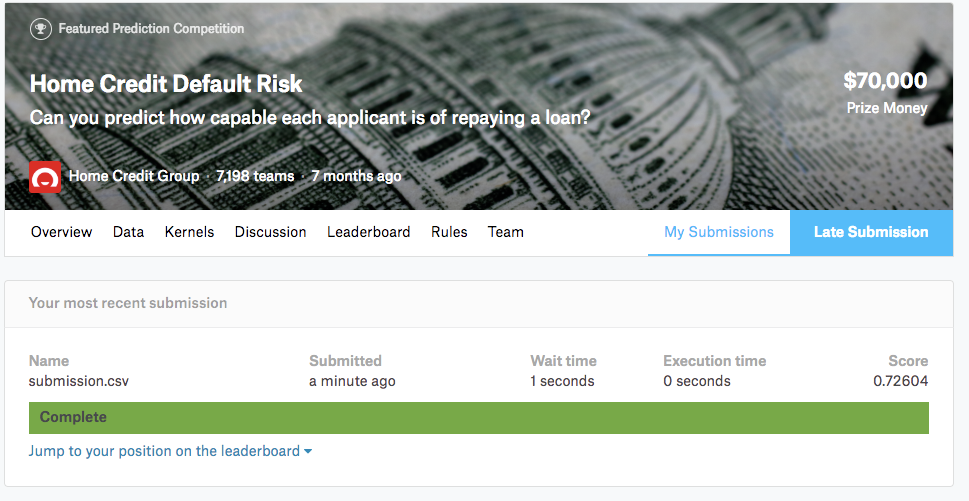

# Write-up 
For this phase of the project, you will need to submit a write-up summarizing the work you did. 
The write-up form is available on Canvas (Modules-> Module 12.1 - Course Project - Home Credit Default Risk (HCDR)-> FP Phase 2 (HCDR) : write-up form ). It has the following sections: 
## Abstract

Using the "Home Credit Default Risk" dataset, we attempted  to develop a machine learning model that forecasts a borrower's repayment capacity. To do this, we used application, demographic, and credit behavior history data to perform basic exploratory data analysis, and we created a baseline pipeline that also dealt with missing, aberrant, and uncommon data.

The metrics Accuracy, F1 Score, and ROC score, Confusion Matrix are among the ones we want to publish. In addition to Logistic Regression(L1-LibLinear), Logistic Regression(L1,L2(SGD)) Decision Tree Classifier, Random Forest, NaiveBayes Classifier, XGBoost Classifier , AdaBoost classifier and Gradient Boosting Classifier, we also used other baseline models. 

The major objective of this phase is to carry out additional feature engineering, hyperparameter tuning, and feature selection relevant to the prediction of the target risk variable. Given 335 columns distinguished as 166 as numerical attributes and 169 as categorical attributes, we first had trouble combining data from several databases. We had to use a subset of the data (maximum = 10,000 rows) for training rather than the complete set, due to time-exceeding and resource overloading. We increased the number of columns as compared to previous Phase and out of 166 we took top 100 numerical correlated features and took top 10 correlated categorical features and dropped some columns which seems to no use such as: [email, number, etc.]. 

In the phase before, we used PolynomialFeatures Class to engineer certain features to obtain 3-degree features. The previous_application.csv file and bureau.csv file were used to build aggregated features in this phase based on the already-existing numerical and category data.

We have developed distinct pipelines for both categorical and numerical features ,we use the imputer to fill in the missing data, StandardScaler and Onehot Encoder to normalize the data. For Hyper-parameter Tuning we used following classifiers: Logistic Regression(L1-LibLinear), Logistic Regression(L1,L2(SGD)), Random Forest, XGBoost Classifier , AdaBoost classifier and Gradient Boosting Classifier. We performed the experimentation by using both GridsearchCV and RandomizedSearchCV out of both GridSearchCV provided better AUC-ROC score of 72.38% with AdaBoostClassifier (learning rate=0.1) and 'classifier__algorithm': 'SAMME.R'. Upon Kaggle submissions, AdaBoostClassifier was the model that performed the best, with an AUC public score of 71.6%  and a private score of 70.4%.

Logistic Regression and XGBoost, our basic model, had the highest training accuracy of 91%. DecisionTreeClassifier, GaussianNB test accuracy were found to be 53.8%, 72.25%. After submitting to Kaggle, we received an AUC private score of 71.54% and a public score of 71.49%. Our tests revealed that XGBoost and Logistic Regression had the highest accuracy, both at 73.85%.


## Introduction
Using the "Home Credit Default Risk" dataset, the goal of this study was to create a machine learning model that forecasts a borrower's capacity to repay a loan. In the last phase we completed exploratory data analysis and built a foundational pipeline to manage missing, abnormal, and unusual data. We tested with a number of baseline models, including Logistic Regression, Decision Tree Classifier, Random Forest, NaiveBayes Classifier, and XGBoost Classifier.  
In this phase, tasks were to perform additional feature engineering, hyperparameter tuning, feature selection, analysis of feature importance, and perform ensemble methods and non-ensemble methods.

## Feature Engineering and transformers
The application_train.csv and application_test.csv datasets were the only ones used in the prior phase's feature engineering, which introduced 3rd-degree polynomial features. To train and test the baseline models, we used a portion of the fresh data.

In this stage, we prepare features from additional secondary tables that the HCDR dataset offers us. In this article, the previous_application.csv and bureau.csv tables have received the most of our attention.

This phase will be divided into the following three sections:
 Feature Engineering in the previous_application.csv table.
Feature Engineering in the brueau.csv table.
Combining the two secondary tables with the application_train.csv and application_test.csv tables.

For previous_application.csv table: 

We created three types of aggregated features (min, max, mean) for the following columns: 
'AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE', 'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE', 'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION'

 For AMT_APPLICATION , we created a range_AMT_APPLICATION that takes the range from the maximum and minimum of the said feature. 

The newly created aggregated table was then combined with the application_train.csv and application_test.csv tables using a straightforward merge function based on the SK_ID_CURR identifier.

For bureau.csv table: 
This table contains the information for 263,491 applicants, as can be seen.

For all of these applicants, we first developed a previous_loan_count feature based on the SK_ID_BUREAU feature.

Then, by executing a groupby on the SK_ID_CURR feature, we produced five categories of aggregated features (count, mean, max, min, and sum) for the remaining columns:

We executed a merging of the aggregated bureau table with the application_train.csv and application_test.csv tables based on the SK_ID_CURR identification after suitably changing the fields.

After these processes, the training dataset (merged application tr number of trees, the maximumain dataset) has 335 columns, while the testing dataset (merged application test.csv) has 334 columns.

## Pipelines
We performed creation of  two separate pipelines for both numerical and categorical features respectively. 

Creation of  separate pipelines  helps us to fill in missing values and perform scaling on numerical features:- ('DAYS_BIRTH_x','DAYS_BIRTH_y','DAYS_EMPLOYED','DAYS_REGISTRATION','OWN_CAR_AGE').

We are using SimpleImputer for both pipelines to fill in the missing values with the median being used, for the numerical pipeline and the most frequent value being used,for the categorical pipeline.

 In the categorical pipeline we used One Hot Encoding, to convert categorical values :
('FLAG_OWN_CAR','FLAG_OWN_REALTY','FLAG_MOBIL','FLAG_EMP_PHONE','FLAG_WORK_PHONE','FLAG_CONT_MOBILE', 'FLAG_PHONE') into integers for improving the performance of our models. 

Standard Scaler is used in the numerical pipeline for scaling purposes. The two pipelines are then combined into a single ‘ data_prep_pipeline ’ .We also tried using ‘MinMaxScaler’ but we were getting ‘column mismatch’ error.

We then performed hyperparamter tuning of the models.

## Experimental results
As per our results, when we fitted the models for the entire dataset and all the number of rows, and 104 columns (100 numerical, 4 categorical), as per the above expLog we can conclude and compare the AUC-ROC scores that GradientBoost Classifier was the best model, and according to the rankings we have printed the model names in descending order for Test AUC. 

On the basis of Test F1 score, Baseline GaussianNB and Baseline Decision Tree Classifier was better, but which is totally contradictory to the above results that’s why we consider, since accuracy cannot be a meaningful metric to evaluate performance until we oversample (unlikely due to complexity and huge number of data) or undersample (more likely) the dataset in accordance with the TARGET feature, imbalance in the dataset appears to be a worry as well at this time.

Our results showed that DecisionTreeClassifier model is experiencing overfitting, In this case, the model is performing perfectly on the training set (Train-Accuracy: 1.0000), but its performance drops significantly on the validation and test sets (Valid-Accuracy: 0.8491 and Test-Accuracy: 0.8490, respectively). It appears that the RandomForestClassifier model is slightly overfitting. In this case, the model is performing very well on the training set (Train-Accuracy: 0.9999), but its performance drops slightly on the validation and test sets (Valid-Accuracy: 0.9193 and Test-Accuracy: 0.9190, respectively).

Further tests revealed that XGBoost and Logistic Regression also had the highest Accuracy in the test set. These results suggest that Logistic Regression and AdaBoost are promising models for predicting borrower's repayment capacity using the "Home Credit Default Risk" dataset.

And the Other models, Random ForestClassifier and The Decision Tree Classifier had low accuracy which is comparatively low, and may be improved if selected in some other columns.

Overall, our experiment demonstrated the effectiveness of machine learning models in predicting borrower's repayment capacity and highlighted the potential of Logistic Regression and AdaBoost or we can also use GradientBoost as suitable models for this task. However, further research and fine-tuning of the models may be necessary to improve their performance and applicability in real-world scenarios

## Discussion
We had to make a number of significant judgments during this stage of the project based on the availability of numerous models and a sizable dataset.

With a primary focus on the recently prepared features, but making sure that our past data allows us to tune the models in a reasonable amount of time, we developed two distinct pipelines for hyperparameter tuning, based on data from the previous phase and the present phase.

We took chunks of data (10000 rows was the most before we found the models did not converge to a solution) to gauge how long it takes for the models to train because we are aware that we will be plagued by the high dimensionality of the data.

Since accuracy cannot be a meaningful metric to evaluate performance until we oversample (unlikely due to complexity and huge number of data) or undersample (more likely) the dataset in accordance with the TARGET feature, imbalance in the dataset appears to be a worry as well at this time.

Since random forest is an ensemble model that uses different subsets of the data, we intend to create the feature importances attribute since it will provide the best estimate of which features should be taken into account for our final run of the pipeline.

## Conclusion
In this project, we aim to predict the likelihood of loan repayment for a specific client. In the previous phase, we conducted exploratory data analysis, performed feature engineering, and created baseline models. Among the models, XGBoost showed the best performance.

In the current phase, we merged the datasets and extracted significant features for the target variable prediction. We faced some challenges during the data merging due to the large number of columns (330). To address this, we extracted Polynomial Features and aggregated features based on existing numerical and categorical features. We also conducted Hyperparameter tuning, and the AdaBoostClassifier showed the best AUC score of 0.746. We used ensemble methods such as RandomForest, AdaBoosting, Gradient Boosting, and XGBoost, and non-ensemble methods such as Decision Trees and Logistic Regression. We submitted the Grid Search CV for AdaBoost, which showed the best AUC public score of 71.6% and a private score of 70.4%.

Moving forward, we plan to undersample the data to make the dataset balanced, introduce dimensionality reduction using PCA, and develop a Multilayer Perceptron to achieve higher accuracy in predicting the target variable. Finally, we will compare all models based on their performance metrics and select the best model for the project.

## Kaggle Submission
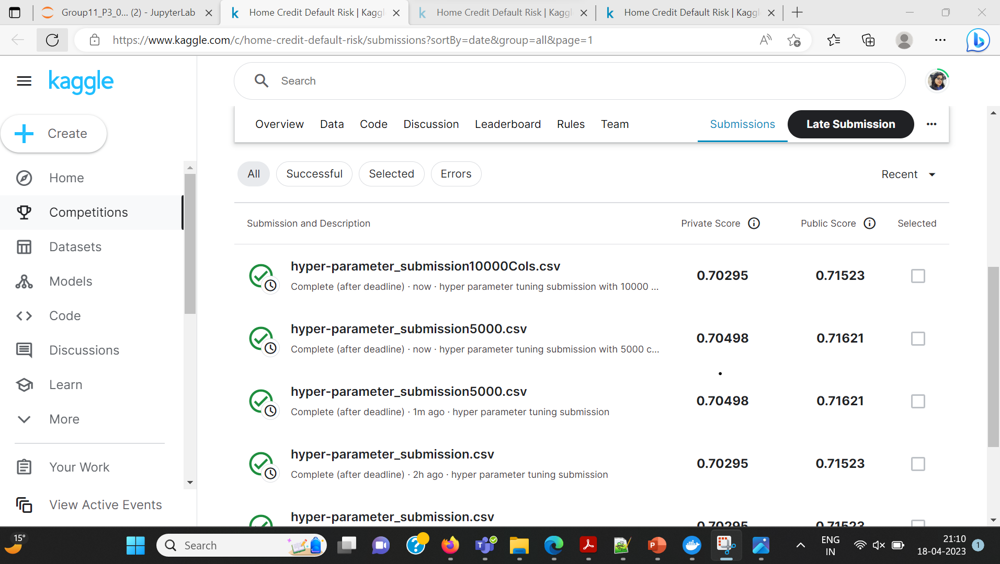

## **Discussion**
Based on the performance indicators of the models, we finalized the pipeline with polynomial features. Given that the logistic regression is quicker than the other models and provides strong performance metrics, we discovered that these characteristics perform better and decided to use it.

## Conclusion
Our main objectives in this phase were to do EDA, design new features, and develop a foundational model for estimating default risk.
The two main problems that were encountered were comprehending the association between datasets and extracting the complex features. Upon submission to Kaggle, the baseline RidgeLogistic Regression model generated a ROC-AUC score of 71.49% and a Training ROC-AUC score of roughly 71.54%.
Understanding the project requirements in the past. Project plan for a building.
Exploratory Data Analysis, figuring out how features relate to each other, creating brand-new features, and building and baseline models.

# References

Some of the material in this notebook has been adopted from [here](https://www.kaggle.com/willkoehrsen/start-here-a-gentle-introduction/notebook)


#  TODO: Predicting Loan Repayment with Automated Feature Engineering in Featuretools

Read the following:
* feature engineering via Featuretools library: 
  * https://github.com/Featuretools/predict-loan-repayment/blob/master/Automated%20Loan%20Repayment.ipynb
* https://www.analyticsvidhya.com/blog/2018/08/guide-automated-feature-engineering-featuretools-python/
* feature engineering paper: https://dai.lids.mit.edu/wp-content/uploads/2017/10/DSAA_DSM_2015.pdf
* https://www.analyticsvidhya.com/blog/2017/08/catboost-automated-categorical-data/